In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import joblib
import gc

import lightgbm as lgb
from sklearn import preprocessing
from sklearn import pipeline
from sklearn import impute
from scipy.optimize import minimize
from scipy.stats import beta

import optuna
from optuna.visualization import (
    plot_contour
    , plot_edf
    , plot_intermediate_values
    , plot_optimization_history
    , plot_parallel_coordinate
    , plot_param_importances
    , plot_slice
)

import sys
sys.path.append("../utils")
from resample import mixup

pd.set_option('display.max_columns', None)

import plotly.express as px
import plotly.io as pio
pio.renderers.default = "png"

/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


***
## loading data

In [2]:
input_path = "../data/raw"

train = pd.read_csv(f"{input_path}/train.csv")
test  = pd.read_csv(f"{input_path}/test.csv")
greeks = pd.read_csv(f"{input_path}/greeks.csv")

train.columns = [col.strip() for col in train.columns]
test.columns = [col.strip() for col in test.columns]

# available features
input_cols = train.columns[1:-1]
categ_cols = ["EJ"]

# we extend train with dummies from greeks
dummies = pd.get_dummies(greeks[["Alpha","Beta","Gamma","Delta"]])
train[dummies.columns] = dummies

# encode of categorical features
encoder = preprocessing.LabelEncoder().fit(train["EJ"])
train["EJ"] = encoder.transform(train["EJ"]).astype(int)
test["EJ"] = encoder.transform(test["EJ"]).astype(int)

display(train)

,Id,AB,AF,AH,AM,AR,AX,AY,AZ,BC,BD,BN,BP,BQ,BR,BZ,CB,CC,CD,CF,CH,CL,CR,CS,CU,CW,DA,DE,DF,DH,DI,DL,DN,DU,DV,DY,EB,EE,EG,EH,EJ,EL,EP,EU,FC,FD,FE,FI,FL,FR,FS,GB,GE,GF,GH,GI,GL,Class,Alpha_A,Alpha_B,Alpha_D,Alpha_G,Beta_A,Beta_B,Beta_C,Gamma_A,Gamma_B,Gamma_E,Gamma_F,Gamma_G,Gamma_H,Gamma_M,Gamma_N,Delta_A,Delta_B,Delta_C,Delta_D
0,000ff2bfdfe9,0.209377,3109.03329,85.200147,22.394407,8.138688,0.699861,0.025578,9.812214,5.555634,4126.58731,22.5984,175.638726,152.707705,823.928241,257.432377,47.223358,0.563481,23.387600,4.851915,0.023482,1.050225,0.069225,13.784111,1.302012,36.205956,69.08340,295.570575,0.238680,0.284232,89.245560,84.31664,29.657104,5.310690,1.74307,23.187704,7.294176,1.987283,1433.166750,0.949104,1,30.879420,78.526968,3.828384,13.394640,10.265073,9028.291921,3.583450,7.298162,1.73855,0.094822,11.339138,72.611063,2003.810319,22.136229,69.834944,0.120343,1,0,1,0,0,0,0,1,0,0,0,0,1,0,0,0,0,0,0,1
1,007255e47698,0.145282,978.76416,85.200147,36.968889,8.138688,3.632190,0.025578,13.517790,1.229900,5496.92824,19.4205,155.868030,14.754720,51.216883,257.432377,30.284345,0.484710,50.628208,6.085041,0.031442,1.113875,1.117800,28.310953,1.357182,37.476568,70.79836,178.553100,0.238680,0.363489,110.581815,75.74548,37.532000,0.005518,1.74307,17.222328,4.926396,0.858603,1111.287150,0.003042,0,109.125159,95.415086,52.260480,17.175984,0.296850,6785.003474,10.358927,0.173229,0.49706,0.568932,9.292698,72.611063,27981.562750,29.135430,32.131996,21.978000,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
2,013f2bd269f5,0.470030,2635.10654,85.200147,32.360553,8.138688,6.732840,0.025578,12.824570,1.229900,5135.78024,26.4825,128.988531,219.320160,482.141594,257.432377,32.563713,0.495852,85.955376,5.376488,0.036218,1.050225,0.700350,39.364743,1.009611,21.459644,70.81970,321.426625,0.238680,0.210441,120.056438,65.46984,28.053464,1.289739,1.74307,36.861352,7.813674,8.146651,1494.076488,0.377208,1,109.125159,78.526968,5.390628,224.207424,8.745201,8338.906181,11.626917,7.709560,0.97556,1.198821,37.077772,88.609437,13676.957810,28.022851,35.192676,0.196941,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
3,043ac50845d5,0.252107,3819.65177,120.201618,77.112203,8.138688,3.685344,0.025578,11.053708,1.229900,4169.67738,23.6577,237.282264,11.050410,661.518640,257.432377,15.201914,0.717882,88.159360,2.347652,0.029054,1.400300,0.636075,41.116960,0.722727,21.530392,47.27586,196.607985,0.238680,0.292431,139.824570,71.57120,24.354856,2.655345,1.74307,52.003884,7.386060,3.813326,15691.552180,0.614484,1,31.674357,78.526968,31.323372,59.301984,7.884336,10965.766040,14.852022,6.122162,0.49706,0.284466,18.529584,82.416803,2094.262452,39.948656,90.493248,0.155829,0,1,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,1,0,0
4,044fb8a146ec,0.380297,3733.04844,85.200147,14.103738,8.138688,3.942255,0.054810,3.396778,102.151980,5728.73412,24.0108,324.546318,149.717165,6074.859475,257.432377,82.213495,0.536467,72.644264,30.537722,0.025472,1.050225,0.693150,31.724726,0.827550,34.415360,74.06532,200.178160,0.238680,0.207708,97.920120,52.83888,26.019912,1.144902,1.74307,9.064856,7.350720,3.490846,1403.656300,0.164268,1,109.125159,91.994825,51.141336,29.102640,4.274640,16198.049590,13.666727,8.153058,48.50134,0.121914,16.408728,146.109943,8524.370502,45.381316,36.262628,0.096614,1,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
612,fd3dafe738fd,0.149555,3130.05946,123.763599,9.513984,13.020852,3.499305,0.077343,8.545512,2.804172,4157.68439,21.1860,167.877117,27.287375,365.516874,257.432377,41.368691,0.691257,55.163024,4.780452,0.013930,1.177525,0.698250,40.159779,1.070298,7.030640,21.75904,355.930925,0.238680,0.445479,176.977590,90.91832,27.957928,0.005518,2.41906,32.508604,8.015112,1.354416,495.086300,0.003042,0,51.

In [3]:
preproc_pipe = pipeline.Pipeline([
    ("imputer", impute.SimpleImputer(strategy="median")), 
    ("scaler", preprocessing.MaxAbsScaler()),
])

preproc_pipe.fit(train[input_cols])
display(preproc_pipe)

train[input_cols] = preproc_pipe.transform(train[input_cols])
test[input_cols] = preproc_pipe.transform(test[input_cols])

Pipeline(steps=[('imputer', SimpleImputer(strategy='median')),
                ('scaler', MaxAbsScaler())])

In [4]:
repeated_cv_split = joblib.load("../data/iarc-data-split/repeated_5fold_cv_split_4validation.pkl")
print(len(repeated_cv_split))

# number of repetitions to use
REPETITIONS = 10

10


***
## training

In [5]:
def balanced_logloss_(y_pred, y_true, eps=1e-15):
    n0 = np.sum(1-y_true)
    n1 = np.sum(y_true)
    p1 = np.clip(y_pred, eps, 1-eps)
    p0 = 1-p1
    log_loss0 = - np.sum((1-y_true) * np.log(p0)) / (n0+eps)
    log_loss1 = - np.sum(y_true * np.log(p1)) / (n1+eps)
    return (log_loss0 + log_loss1)/2

def balanced_logloss(y_pred: np.ndarray, data: lgb.Dataset):
    y_true = data.get_label()
    return 'balanced_logloss', balanced_logloss_(y_pred, y_true), False 

In [6]:
pct = train.Class.value_counts(normalize=True)
scale_pos_weight = pct[0]/pct[1]
print("scale_pos_weight:", scale_pos_weight)

cnt = train.Class.value_counts(normalize=False)
neg_bagging_fraction = cnt[1]/cnt[0]
print("neg_bagging_fraction:", neg_bagging_fraction)

scale_pos_weight: 4.712962962962963
neg_bagging_fraction: 0.21218074656188604


In [7]:
#balance_method = "weight"
#balance_method = "bagging"
balance_method = None

DEFAULT_PARAMS = {
    #'objective': 'cross_entropy',
    'objective': 'binary',
    'metric': 'None',
    'learning_rate': 0.005,
    'seed': 2112,
    'deterministic': True,
    'first_metric_only': False,
    'feature_pre_filter': False,
    'verbosity': -1,

    'linear_tree':True,
    'feature_fraction': 0.85,
    'lambda_l1': 1.882514072161519e-07,
    'lambda_l2': 0.47310656156097364,
    'linear_lambda': 1.6136340709412249e-10,
    'min_data_in_leaf': 29,
    'min_gain_to_split': 1.2401743751214779e-05,
    'num_iterations': 1790,
    'path_smooth': 7.124685345958355e-10,
    'max_bin': 31,
    'num_leaves': 31,
    #'boost_from_average': True,
    
    'bagging_freq': 1,
    'bagging_fraction':0.01,
}


if balance_method == "weight":
    DEFAULT_PARAMS["scale_pos_weight"] = scale_pos_weight
elif balance_method == "bagging":
    DEFAULT_PARAMS["bagging_freq"] = 1
    DEFAULT_PARAMS["pos_bagging_fraction"] = 1
    DEFAULT_PARAMS["neg_bagging_fraction"] = neg_bagging_fraction
else:
    print("Unknown balance_method")

model_params = dict(DEFAULT_PARAMS)
display(model_params)

Unknown balance_method


{'objective': 'binary',
 'metric': 'None',
 'learning_rate': 0.005,
 'seed': 2112,
 'deterministic': True,
 'first_metric_only': False,
 'feature_pre_filter': False,
 'verbosity': -1,
 'linear_tree': True,
 'feature_fraction': 0.85,
 'lambda_l1': 1.882514072161519e-07,
 'lambda_l2': 0.47310656156097364,
 'linear_lambda': 1.6136340709412249e-10,
 'min_data_in_leaf': 29,
 'min_gain_to_split': 1.2401743751214779e-05,
 'num_iterations': 1790,
 'path_smooth': 7.124685345958355e-10,
 'max_bin': 31,
 'num_leaves': 31,
 'bagging_freq': 1,
 'bagging_fraction': 0.01}

REPEAT NUMBER: 1/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.533727
[200]	valid_0's balanced_logloss: 0.465921
[300]	valid_0's balanced_logloss: 0.429525
[400]	valid_0's balanced_logloss: 0.415295
[500]	valid_0's balanced_logloss: 0.404741
[600]	valid_0's balanced_logloss: 0.391362
[700]	valid_0's balanced_logloss: 0.383297
[800]	valid_0's balanced_logloss: 0.367655
[900]	valid_0's balanced_logloss: 0.36623
[1000]	valid_0's balanced_logloss: 0.371647
[1100]	valid_0's balanced_logloss: 0.379318
[1200]	valid_0's balanced_logloss: 0.386843
[1300]	valid_0's balanced_logloss: 0.395529
[1400]	valid_0's balanced_logloss: 0.407758
[1500]	valid_0's balanced_logloss: 0.415368
[1600]	valid_0's balanced_logloss: 0.426048
[1700]	valid_0's balanced_logloss: 0.435359


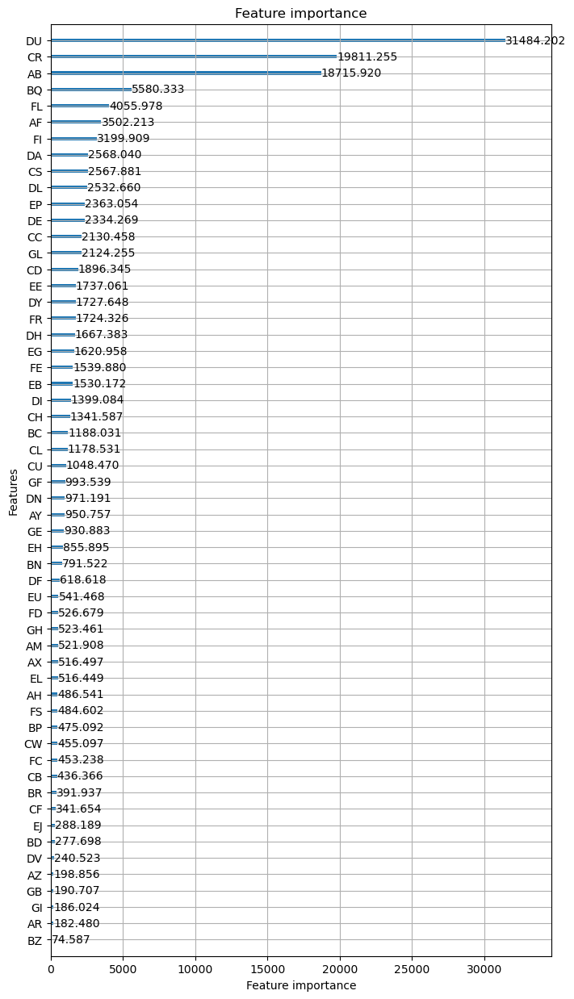

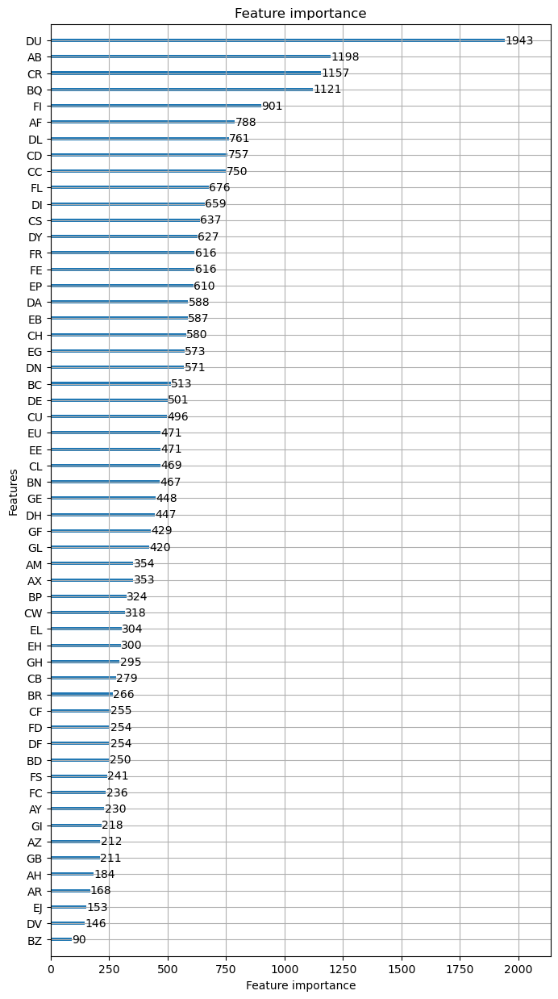

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.510324
[200]	valid_0's balanced_logloss: 0.409346
[300]	valid_0's balanced_logloss: 0.353671
[400]	valid_0's balanced_logloss: 0.318725
[500]	valid_0's balanced_logloss: 0.295542
[600]	valid_0's balanced_logloss: 0.280875
[700]	valid_0's balanced_logloss: 0.273433
[800]	valid_0's balanced_logloss: 0.268357
[900]	valid_0's balanced_logloss: 0.266273
[1000]	valid_0's balanced_logloss: 0.264582
[1100]	valid_0's balanced_logloss: 0.26752
[1200]	valid_0's balanced_logloss: 0.265917
[1300]	valid_0's balanced_logloss: 0.266986
[1400]	valid_0's balanced_logloss: 0.262251
[1500]	valid_0's balanced_logloss: 0.257021
[1600]	valid_0's balanced_logloss: 0.260446
[1700]	valid_0's balanced_logloss: 0.265684


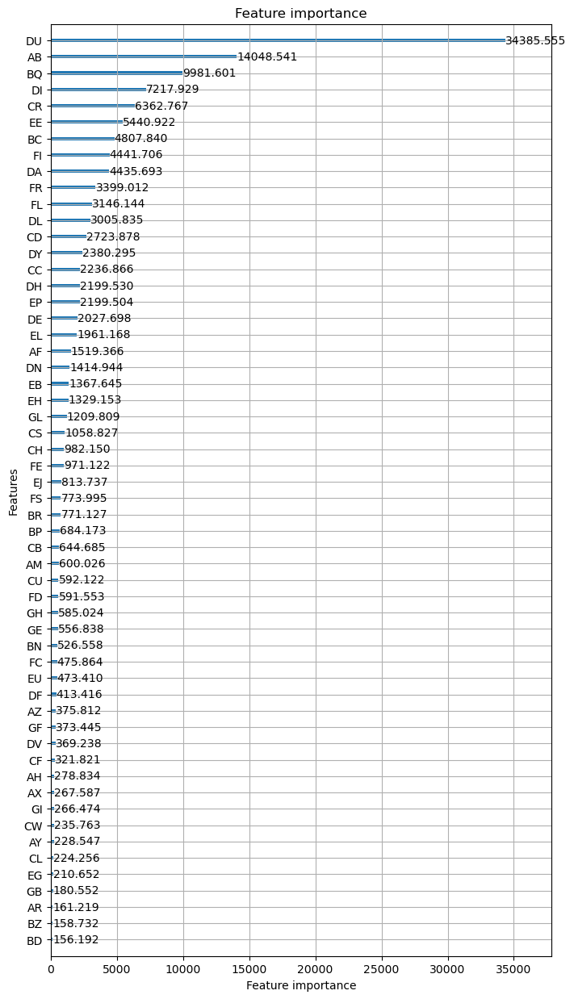

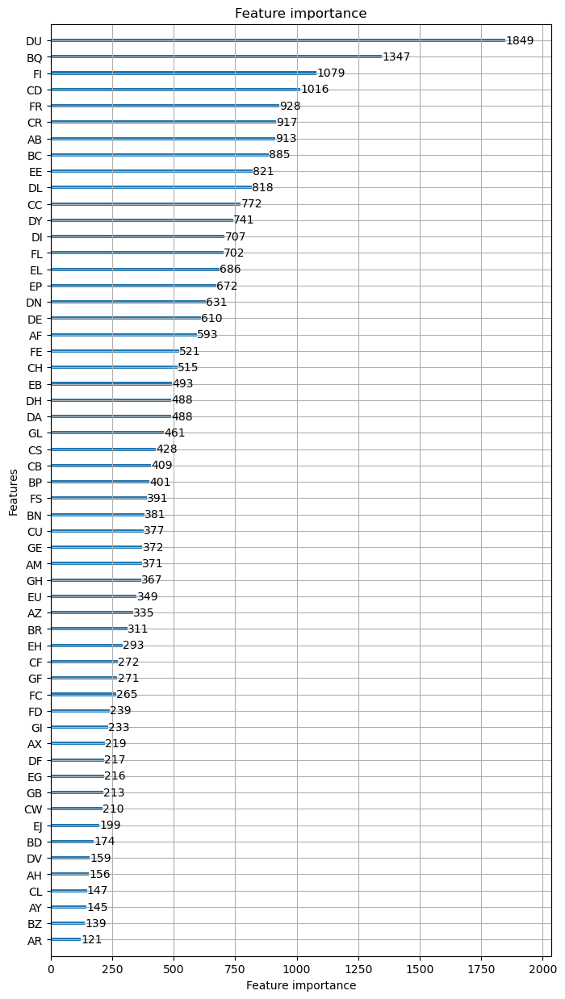

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.470374
[200]	valid_0's balanced_logloss: 0.358524
[300]	valid_0's balanced_logloss: 0.295621
[400]	valid_0's balanced_logloss: 0.259647
[500]	valid_0's balanced_logloss: 0.234106
[600]	valid_0's balanced_logloss: 0.215178
[700]	valid_0's balanced_logloss: 0.204511
[800]	valid_0's balanced_logloss: 0.197963
[900]	valid_0's balanced_logloss: 0.189594
[1000]	valid_0's balanced_logloss: 0.179769
[1100]	valid_0's balanced_logloss: 0.172929
[1200]	valid_0's balanced_logloss: 0.166786
[1300]	valid_0's balanced_logloss: 0.165955
[1400]	valid_0's balanced_logloss: 0.161622
[1500]	valid_0's balanced_logloss: 0.157799
[1600]	valid_0's balanced_logloss: 0.153956
[1700]	valid_0's balanced_logloss: 0.146987


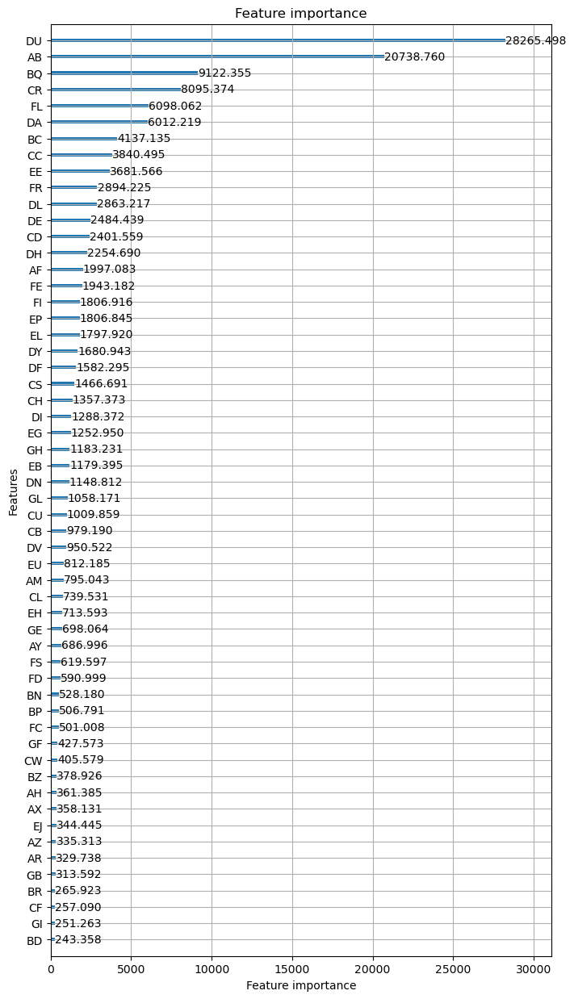

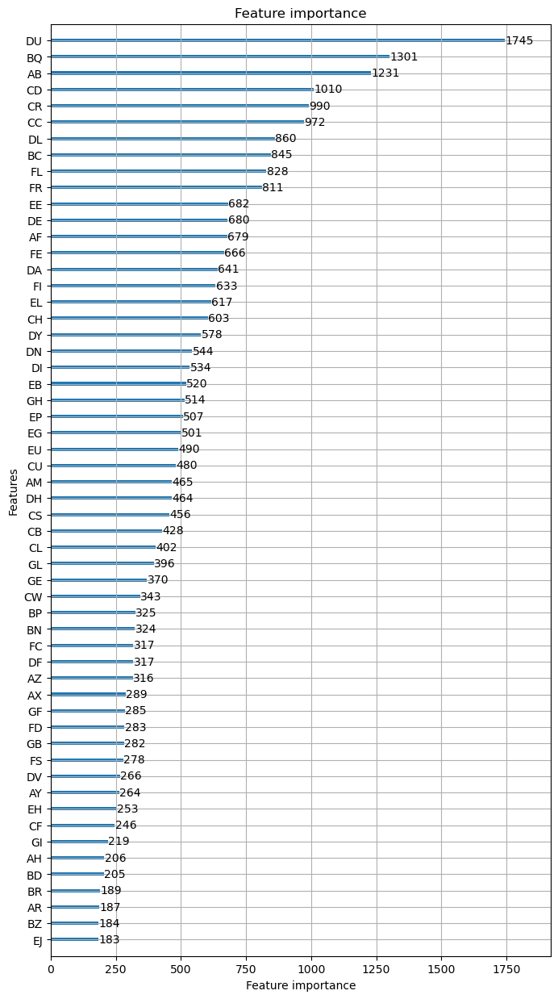

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.475398
[200]	valid_0's balanced_logloss: 0.373964
[300]	valid_0's balanced_logloss: 0.318692
[400]	valid_0's balanced_logloss: 0.283715
[500]	valid_0's balanced_logloss: 0.263849
[600]	valid_0's balanced_logloss: 0.247257
[700]	valid_0's balanced_logloss: 0.231968
[800]	valid_0's balanced_logloss: 0.227432
[900]	valid_0's balanced_logloss: 0.220321
[1000]	valid_0's balanced_logloss: 0.216648
[1100]	valid_0's balanced_logloss: 0.212097
[1200]	valid_0's balanced_logloss: 0.211644
[1300]	valid_0's balanced_logloss: 0.207074
[1400]	valid_0's balanced_logloss: 0.207573
[1500]	valid_0's balanced_logloss: 0.206915
[1600]	valid_0's balanced_logloss: 0.210431
[1700]	valid_0's balanced_logloss: 0.212689


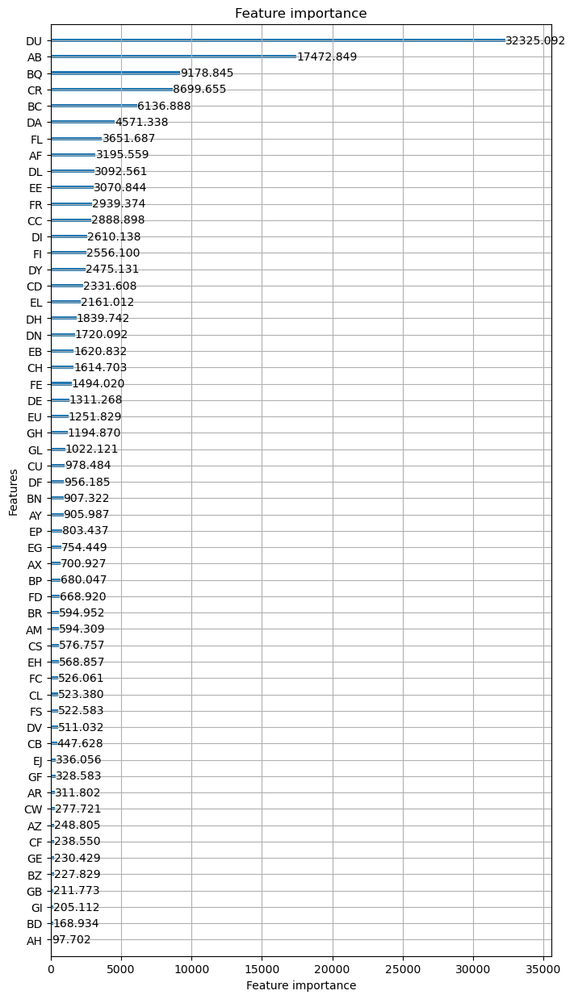

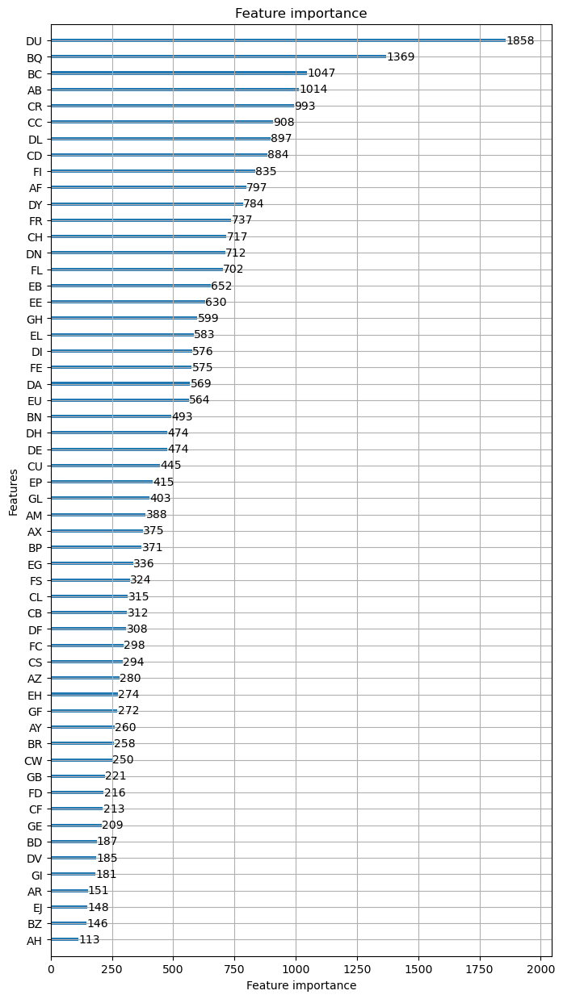

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.48775
[200]	valid_0's balanced_logloss: 0.396563
[300]	valid_0's balanced_logloss: 0.352613
[400]	valid_0's balanced_logloss: 0.322891
[500]	valid_0's balanced_logloss: 0.307184
[600]	valid_0's balanced_logloss: 0.296966
[700]	valid_0's balanced_logloss: 0.283544
[800]	valid_0's balanced_logloss: 0.278694
[900]	valid_0's balanced_logloss: 0.278058
[1000]	valid_0's balanced_logloss: 0.276511
[1100]	valid_0's balanced_logloss: 0.281216
[1200]	valid_0's balanced_logloss: 0.284509
[1300]	valid_0's balanced_logloss: 0.28685
[1400]	valid_0's balanced_logloss: 0.289333
[1500]	valid_0's balanced_logloss: 0.290856
[1600]	valid_0's balanced_logloss: 0.296022
[1700]	valid_0's balanced_logloss: 0.300659


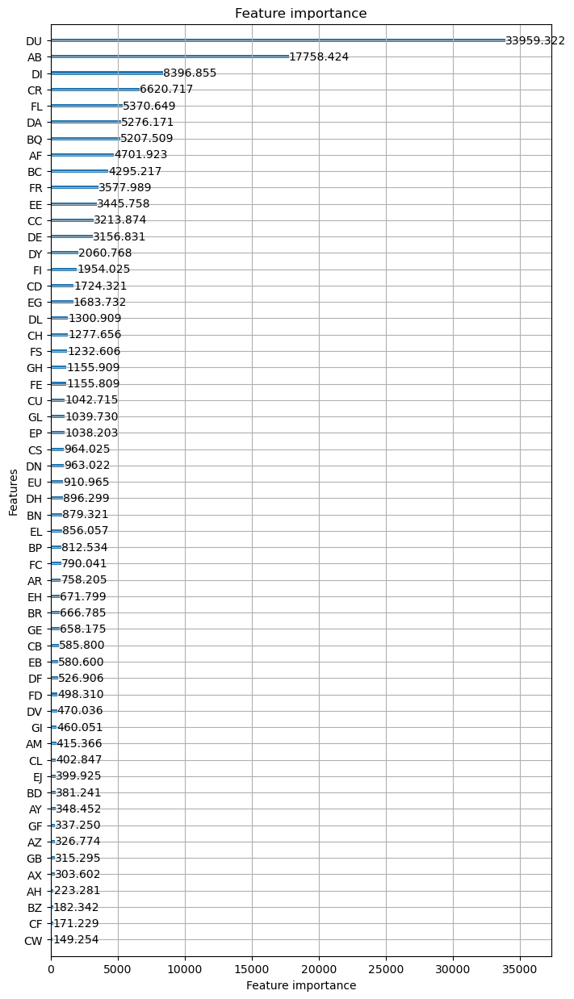

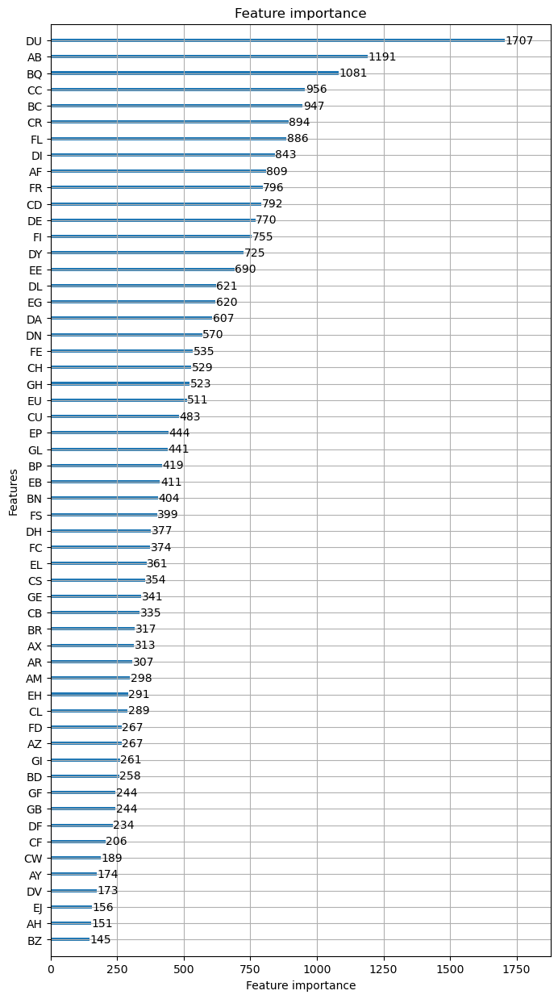

REPEAT NUMBER: 2/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.519909
[200]	valid_0's balanced_logloss: 0.429954
[300]	valid_0's balanced_logloss: 0.378615
[400]	valid_0's balanced_logloss: 0.347194
[500]	valid_0's balanced_logloss: 0.327865
[600]	valid_0's balanced_logloss: 0.31635
[700]	valid_0's balanced_logloss: 0.307209
[800]	valid_0's balanced_logloss: 0.304448
[900]	valid_0's balanced_logloss: 0.299048
[1000]	valid_0's balanced_logloss: 0.298855
[1100]	valid_0's balanced_logloss: 0.300299
[1200]	valid_0's balanced_logloss: 0.295186
[1300]	valid_0's balanced_logloss: 0.295017
[1400]	valid_0's balanced_logloss: 0.296236
[1500]	valid_0's balanced_logloss: 0.302527
[1600]	valid_0's balanced_logloss: 0.315226
[1700]	valid_0's balanced_logloss: 0.295446


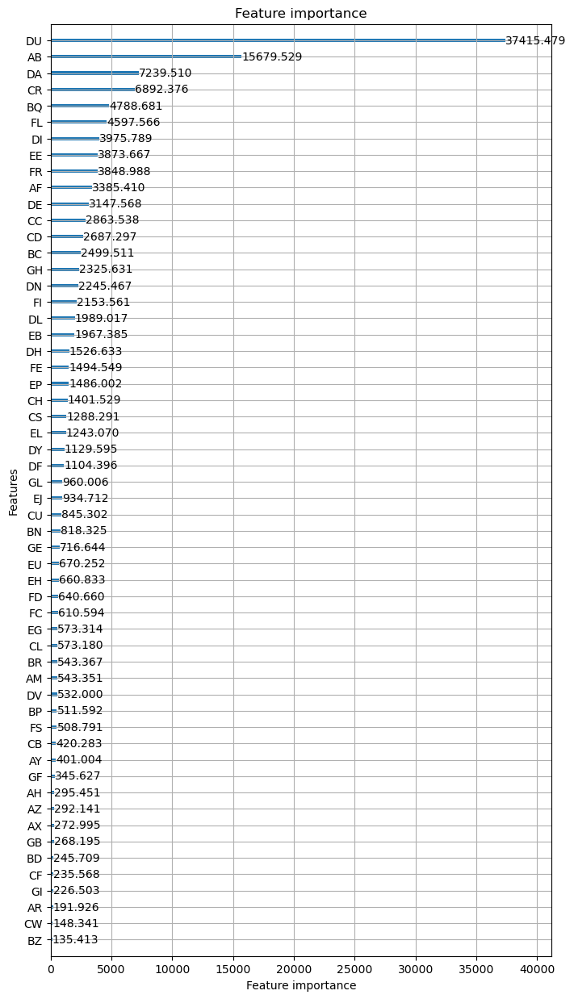

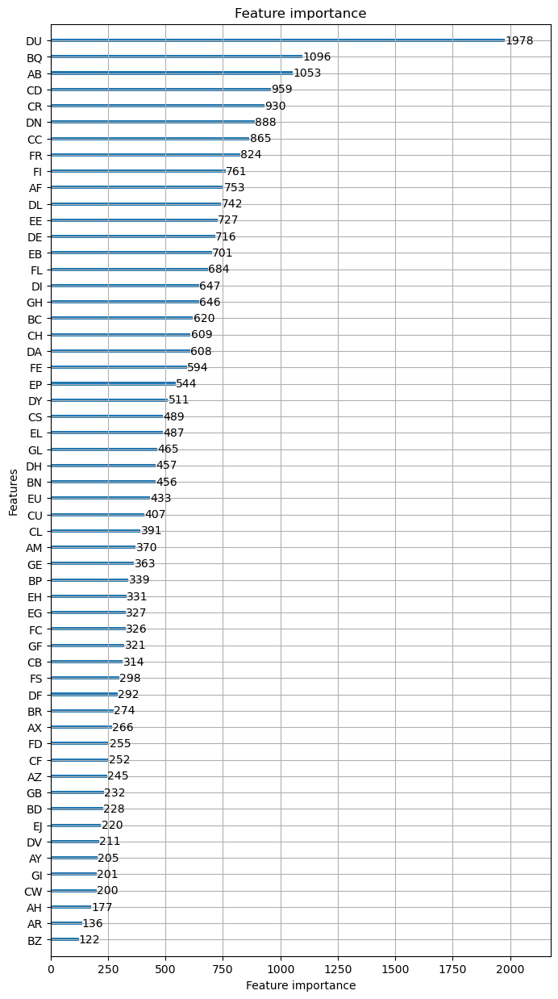

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.476779
[200]	valid_0's balanced_logloss: 0.369265
[300]	valid_0's balanced_logloss: 0.305898
[400]	valid_0's balanced_logloss: 0.270863
[500]	valid_0's balanced_logloss: 0.247876
[600]	valid_0's balanced_logloss: 0.229865
[700]	valid_0's balanced_logloss: 0.221983
[800]	valid_0's balanced_logloss: 0.217984
[900]	valid_0's balanced_logloss: 0.212687
[1000]	valid_0's balanced_logloss: 0.207655
[1100]	valid_0's balanced_logloss: 0.207184
[1200]	valid_0's balanced_logloss: 0.203539
[1300]	valid_0's balanced_logloss: 0.2028
[1400]	valid_0's balanced_logloss: 0.201338
[1500]	valid_0's balanced_logloss: 0.206791
[1600]	valid_0's balanced_logloss: 0.207985
[1700]	valid_0's balanced_logloss: 0.207338


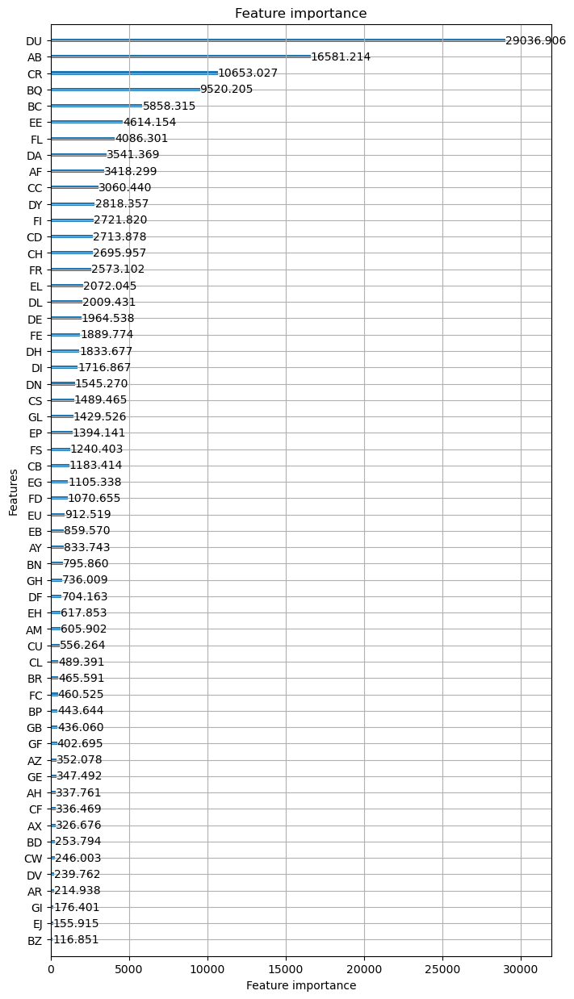

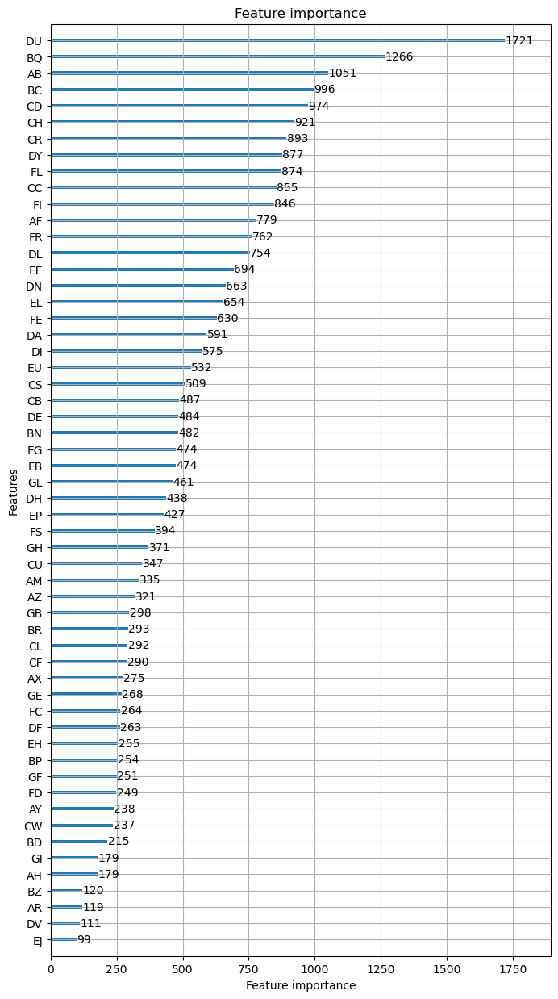

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.487931
[200]	valid_0's balanced_logloss: 0.388417
[300]	valid_0's balanced_logloss: 0.339938
[400]	valid_0's balanced_logloss: 0.315611
[500]	valid_0's balanced_logloss: 0.29647
[600]	valid_0's balanced_logloss: 0.293609
[700]	valid_0's balanced_logloss: 0.33846
[800]	valid_0's balanced_logloss: 0.342667
[900]	valid_0's balanced_logloss: 0.547928
[1000]	valid_0's balanced_logloss: 0.369243
[1100]	valid_0's balanced_logloss: 0.359033
[1200]	valid_0's balanced_logloss: 0.362076
[1300]	valid_0's balanced_logloss: 0.355273
[1400]	valid_0's balanced_logloss: 0.367322
[1500]	valid_0's balanced_logloss: 0.376515
[1600]	valid_0's balanced_logloss: 0.386171
[1700]	valid_0's balanced_logloss: 0.398424


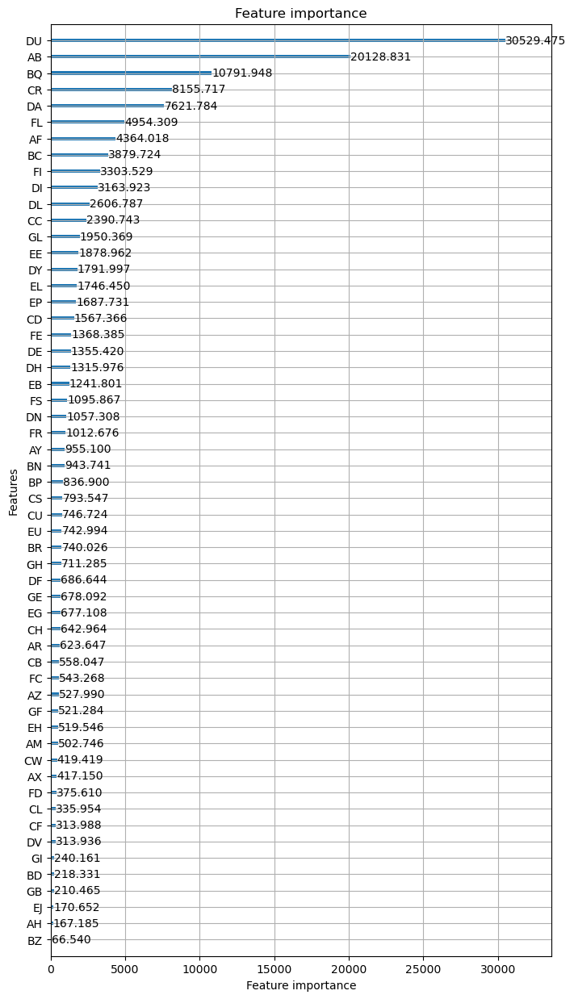

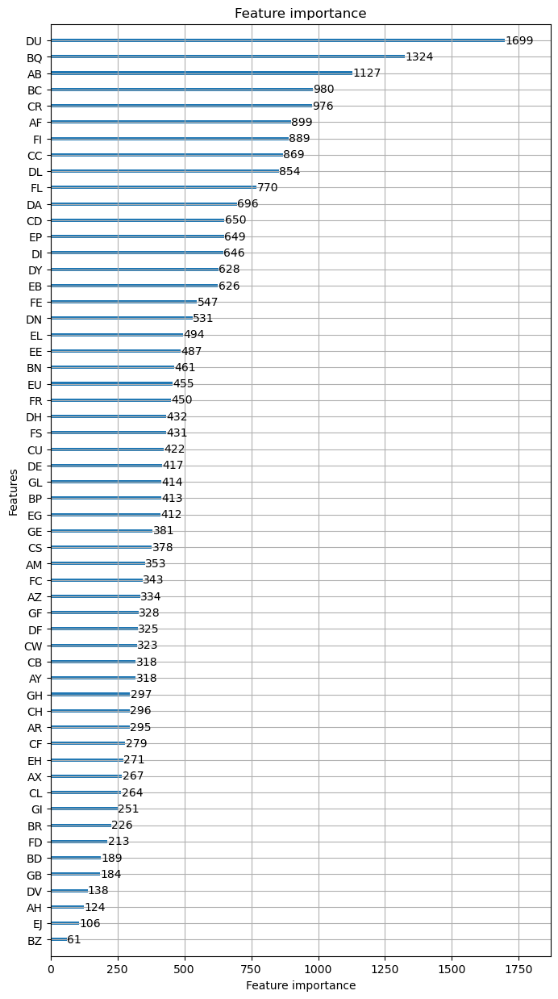

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.505896
[200]	valid_0's balanced_logloss: 0.374495
[300]	valid_0's balanced_logloss: 0.338991
[400]	valid_0's balanced_logloss: 0.291874
[500]	valid_0's balanced_logloss: 0.22702
[600]	valid_0's balanced_logloss: 0.205817
[700]	valid_0's balanced_logloss: 0.181439
[800]	valid_0's balanced_logloss: 0.169535
[900]	valid_0's balanced_logloss: 0.156213
[1000]	valid_0's balanced_logloss: 0.144383
[1100]	valid_0's balanced_logloss: 0.132431
[1200]	valid_0's balanced_logloss: 0.125835
[1300]	valid_0's balanced_logloss: 0.120054
[1400]	valid_0's balanced_logloss: 0.116125
[1500]	valid_0's balanced_logloss: 0.112077
[1600]	valid_0's balanced_logloss: 0.111176
[1700]	valid_0's balanced_logloss: 0.110035


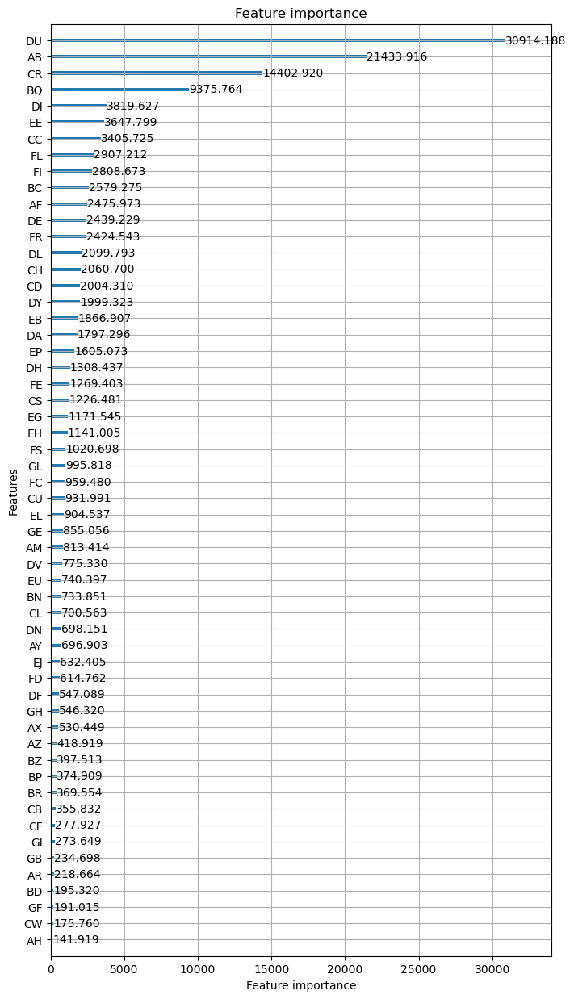

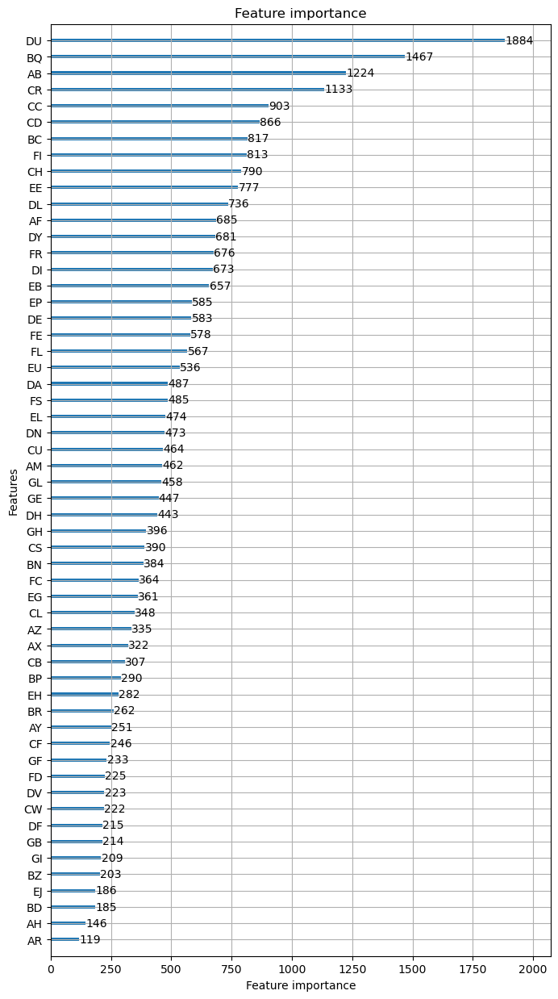

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.484943
[200]	valid_0's balanced_logloss: 0.392878
[300]	valid_0's balanced_logloss: 0.348574
[400]	valid_0's balanced_logloss: 0.329741
[500]	valid_0's balanced_logloss: 0.320491
[600]	valid_0's balanced_logloss: 0.32181
[700]	valid_0's balanced_logloss: 0.326214
[800]	valid_0's balanced_logloss: 0.33267
[900]	valid_0's balanced_logloss: 0.342932
[1000]	valid_0's balanced_logloss: 0.351085
[1100]	valid_0's balanced_logloss: 0.357698
[1200]	valid_0's balanced_logloss: 0.369555
[1300]	valid_0's balanced_logloss: 0.380765
[1400]	valid_0's balanced_logloss: 0.391999
[1500]	valid_0's balanced_logloss: 0.403018
[1600]	valid_0's balanced_logloss: 0.413715
[1700]	valid_0's balanced_logloss: 0.422709


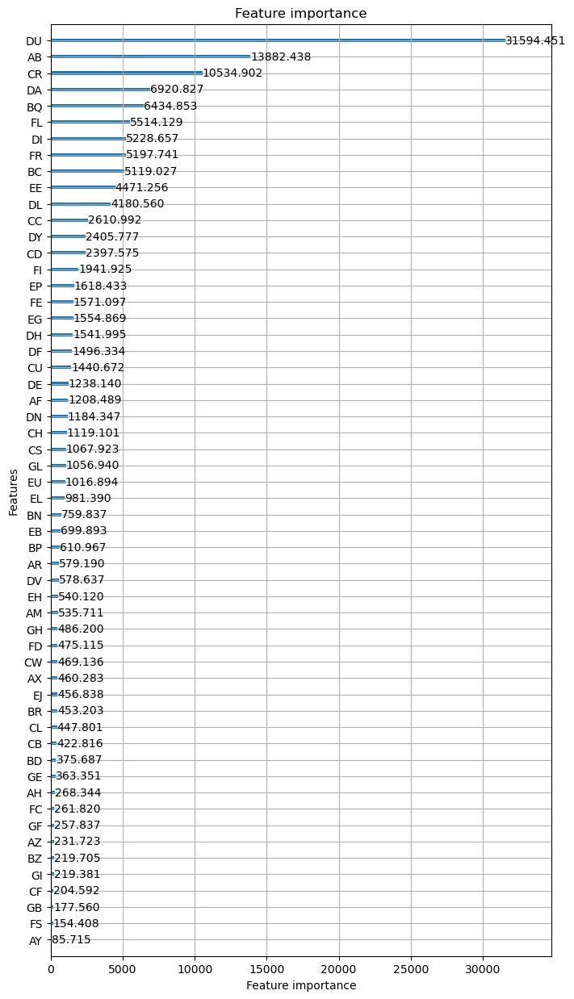

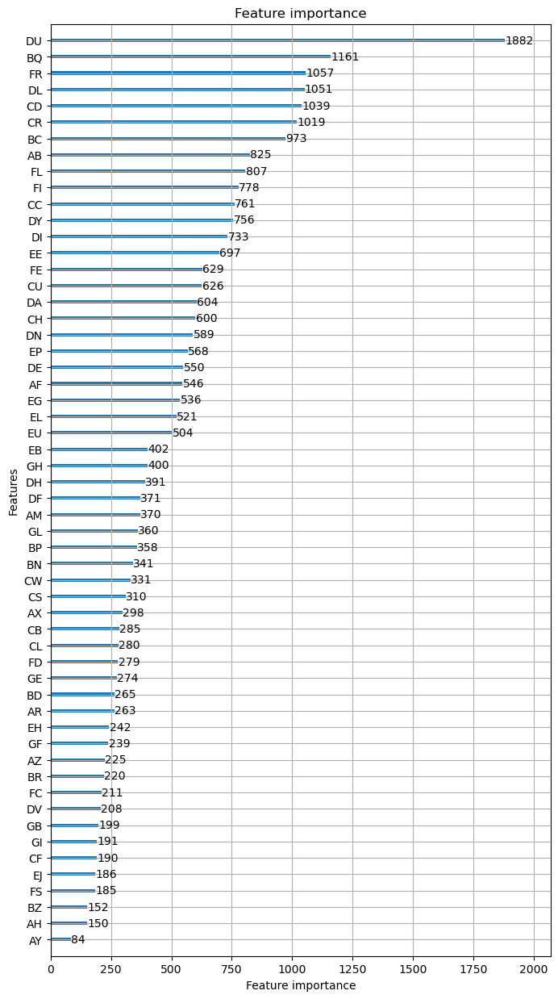

REPEAT NUMBER: 3/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.510128
[200]	valid_0's balanced_logloss: 0.407808
[300]	valid_0's balanced_logloss: 0.359248
[400]	valid_0's balanced_logloss: 0.343577
[500]	valid_0's balanced_logloss: 0.319014
[600]	valid_0's balanced_logloss: 0.30699
[700]	valid_0's balanced_logloss: 0.31378
[800]	valid_0's balanced_logloss: 0.305278
[900]	valid_0's balanced_logloss: 0.435821
[1000]	valid_0's balanced_logloss: 0.425229
[1100]	valid_0's balanced_logloss: 0.422327
[1200]	valid_0's balanced_logloss: 0.417943
[1300]	valid_0's balanced_logloss: 0.630398
[1400]	valid_0's balanced_logloss: 13.8763
[1500]	valid_0's balanced_logloss: 13.8763
[1600]	valid_0's balanced_logloss: 13.8763
[1700]	valid_0's balanced_logloss: 13.8763


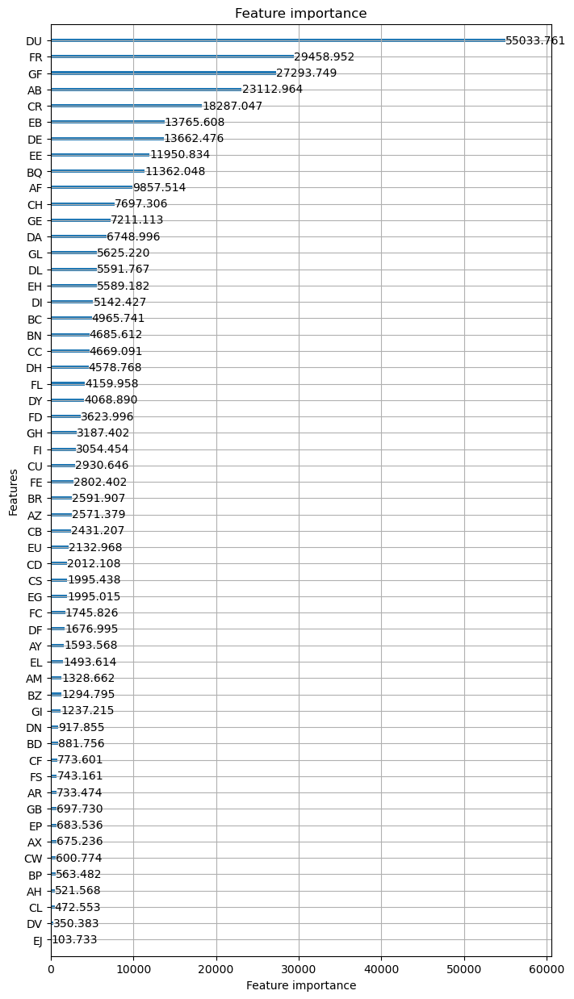

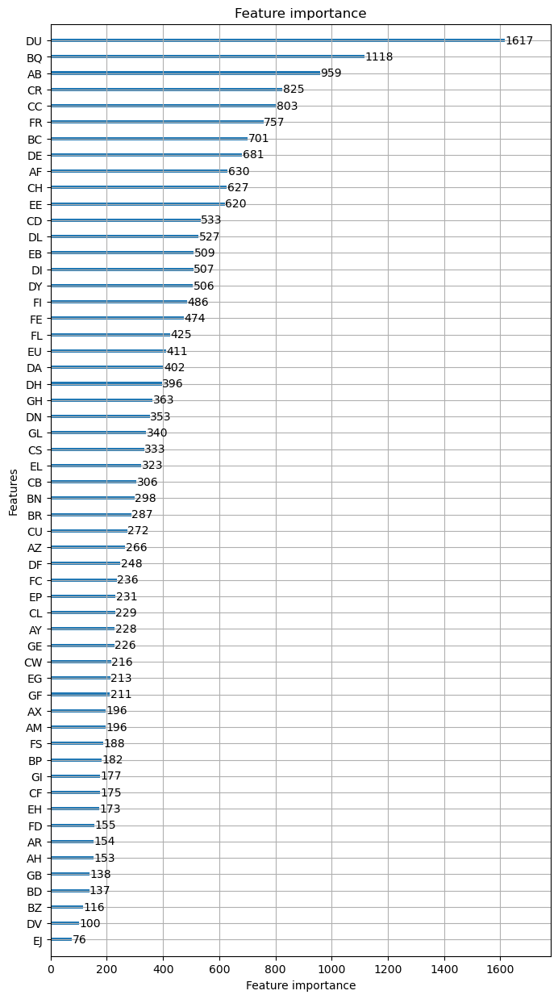

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.521457
[200]	valid_0's balanced_logloss: 0.43946
[300]	valid_0's balanced_logloss: 0.393882
[400]	valid_0's balanced_logloss: 0.366894
[500]	valid_0's balanced_logloss: 0.344869
[600]	valid_0's balanced_logloss: 0.333727
[700]	valid_0's balanced_logloss: 0.329576
[800]	valid_0's balanced_logloss: 0.393001
[900]	valid_0's balanced_logloss: 0.375224
[1000]	valid_0's balanced_logloss: 0.359097
[1100]	valid_0's balanced_logloss: 0.356261
[1200]	valid_0's balanced_logloss: 0.315385
[1300]	valid_0's balanced_logloss: 0.312345
[1400]	valid_0's balanced_logloss: 0.33126
[1500]	valid_0's balanced_logloss: 0.33303
[1600]	valid_0's balanced_logloss: 0.337488
[1700]	valid_0's balanced_logloss: 0.348347


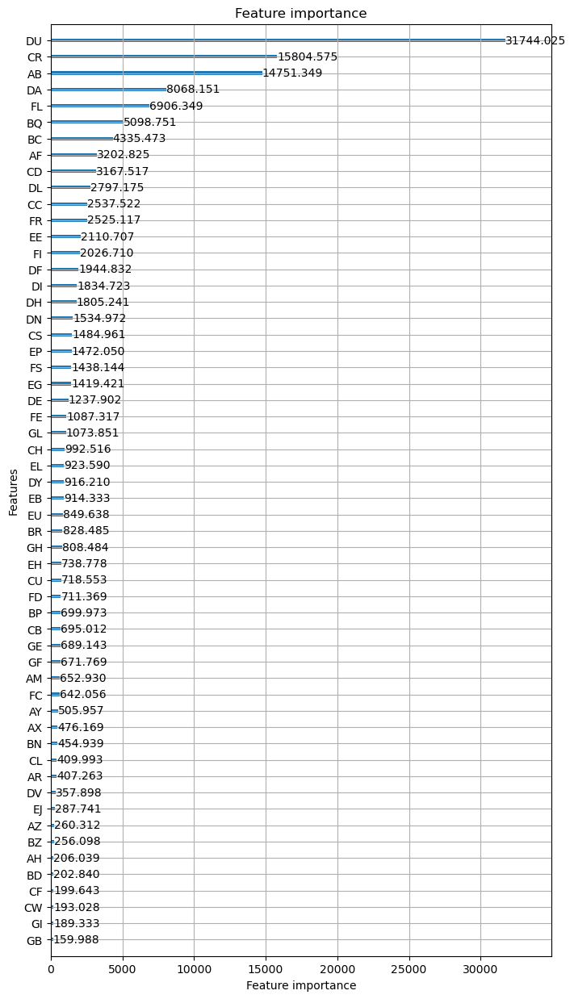

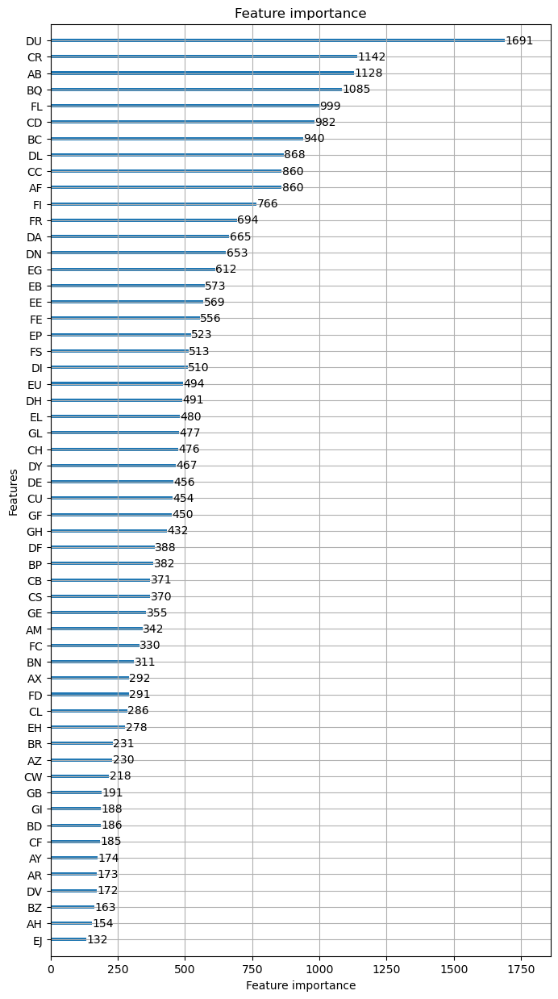

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.496624
[200]	valid_0's balanced_logloss: 0.374487
[300]	valid_0's balanced_logloss: 0.308213
[400]	valid_0's balanced_logloss: 0.266389
[500]	valid_0's balanced_logloss: 0.242942
[600]	valid_0's balanced_logloss: 0.229871
[700]	valid_0's balanced_logloss: 0.217092
[800]	valid_0's balanced_logloss: 0.215913
[900]	valid_0's balanced_logloss: 0.204835
[1000]	valid_0's balanced_logloss: 0.200475
[1100]	valid_0's balanced_logloss: 0.19727
[1200]	valid_0's balanced_logloss: 0.194118
[1300]	valid_0's balanced_logloss: 1.83453
[1400]	valid_0's balanced_logloss: 1.82806
[1500]	valid_0's balanced_logloss: 1.83112
[1600]	valid_0's balanced_logloss: 8.99759
[1700]	valid_0's balanced_logloss: 9.1669


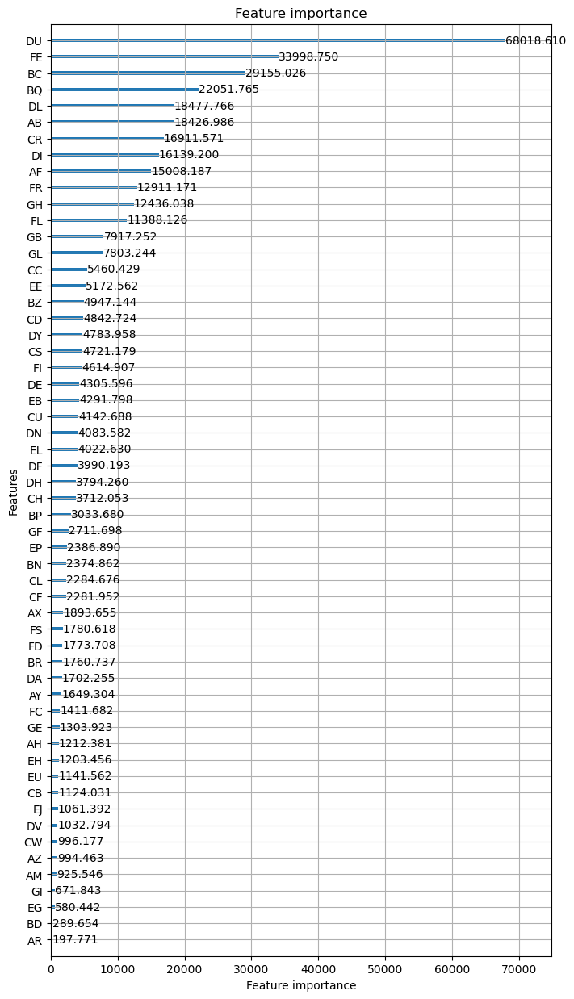

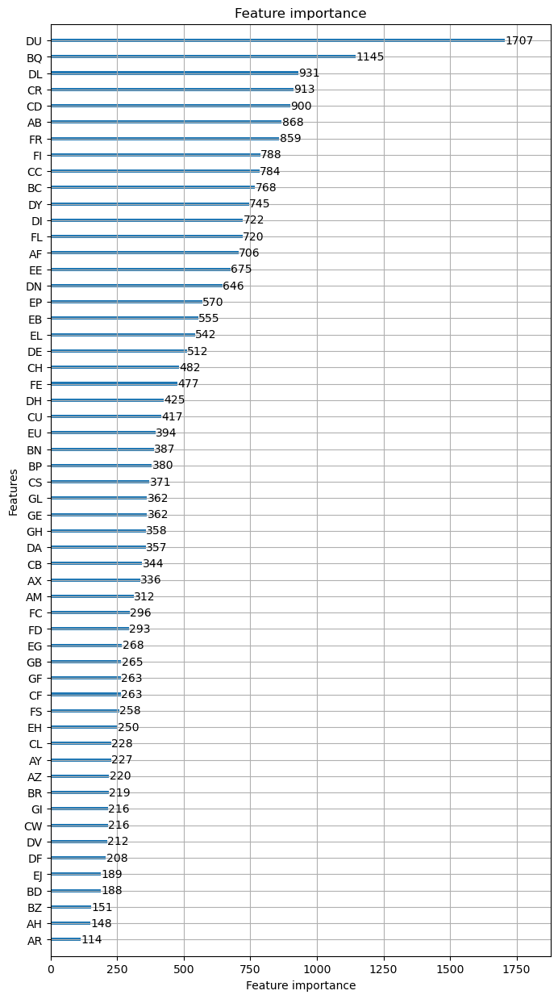

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.477086
[200]	valid_0's balanced_logloss: 0.363288
[300]	valid_0's balanced_logloss: 0.291377
[400]	valid_0's balanced_logloss: 0.24711
[500]	valid_0's balanced_logloss: 0.219478
[600]	valid_0's balanced_logloss: 0.199999
[700]	valid_0's balanced_logloss: 0.186124
[800]	valid_0's balanced_logloss: 0.178527
[900]	valid_0's balanced_logloss: 0.179241
[1000]	valid_0's balanced_logloss: 0.175135
[1100]	valid_0's balanced_logloss: 0.17294
[1200]	valid_0's balanced_logloss: 0.177714
[1300]	valid_0's balanced_logloss: 0.179451
[1400]	valid_0's balanced_logloss: 0.180048
[1500]	valid_0's balanced_logloss: 0.182876
[1600]	valid_0's balanced_logloss: 0.186445
[1700]	valid_0's balanced_logloss: 0.185499


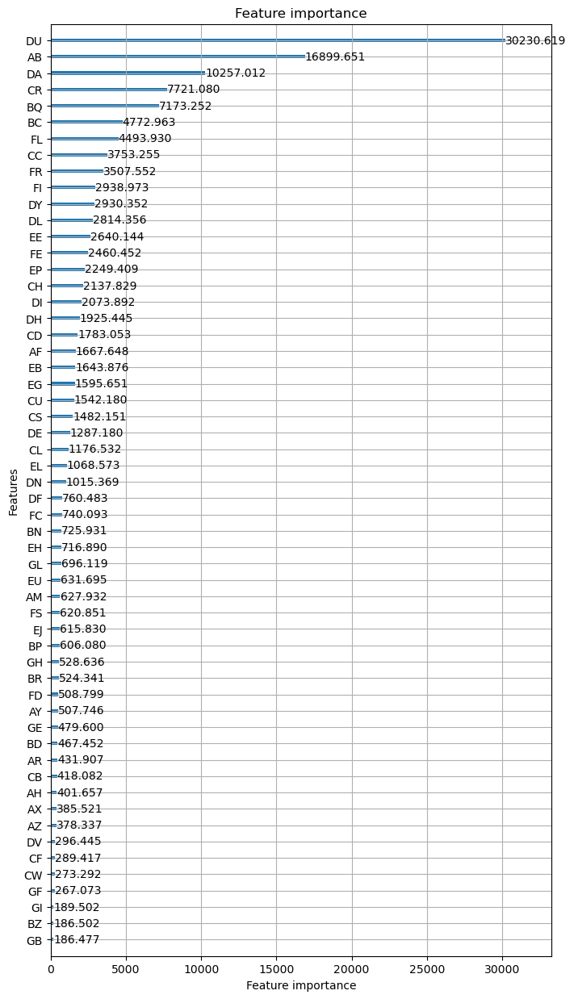

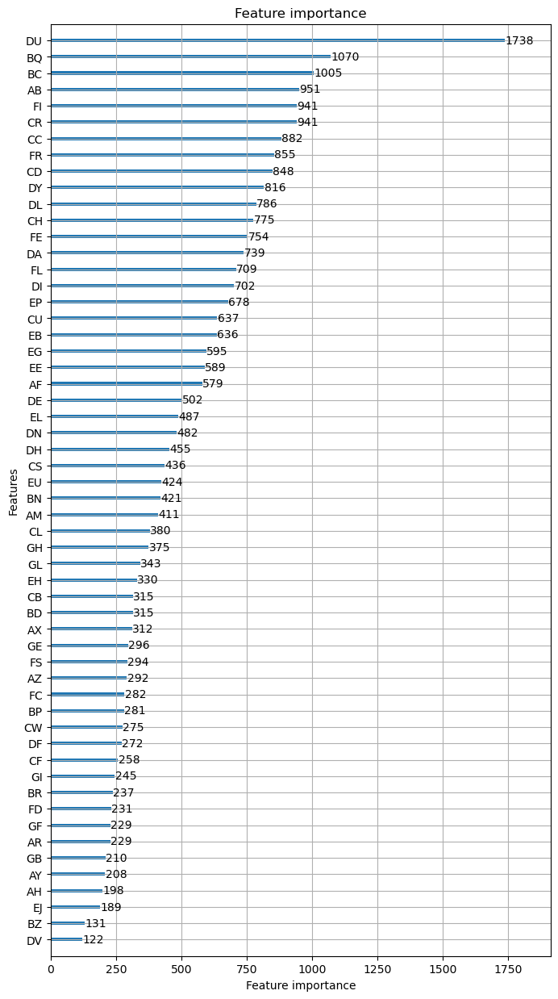

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.490649
[200]	valid_0's balanced_logloss: 0.390144
[300]	valid_0's balanced_logloss: 0.333451
[400]	valid_0's balanced_logloss: 0.300901
[500]	valid_0's balanced_logloss: 0.283171
[600]	valid_0's balanced_logloss: 0.274767
[700]	valid_0's balanced_logloss: 0.268453
[800]	valid_0's balanced_logloss: 0.265406
[900]	valid_0's balanced_logloss: 0.265563
[1000]	valid_0's balanced_logloss: 0.267026
[1100]	valid_0's balanced_logloss: 0.269503
[1200]	valid_0's balanced_logloss: 0.274425
[1300]	valid_0's balanced_logloss: 0.279638
[1400]	valid_0's balanced_logloss: 0.282633
[1500]	valid_0's balanced_logloss: 0.286255
[1600]	valid_0's balanced_logloss: 0.288766
[1700]	valid_0's balanced_logloss: 0.295151


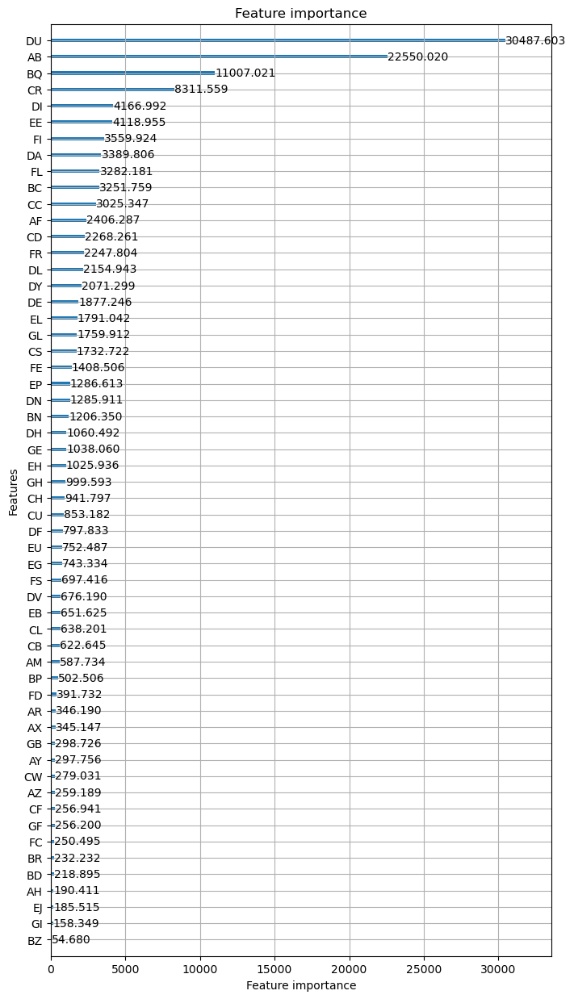

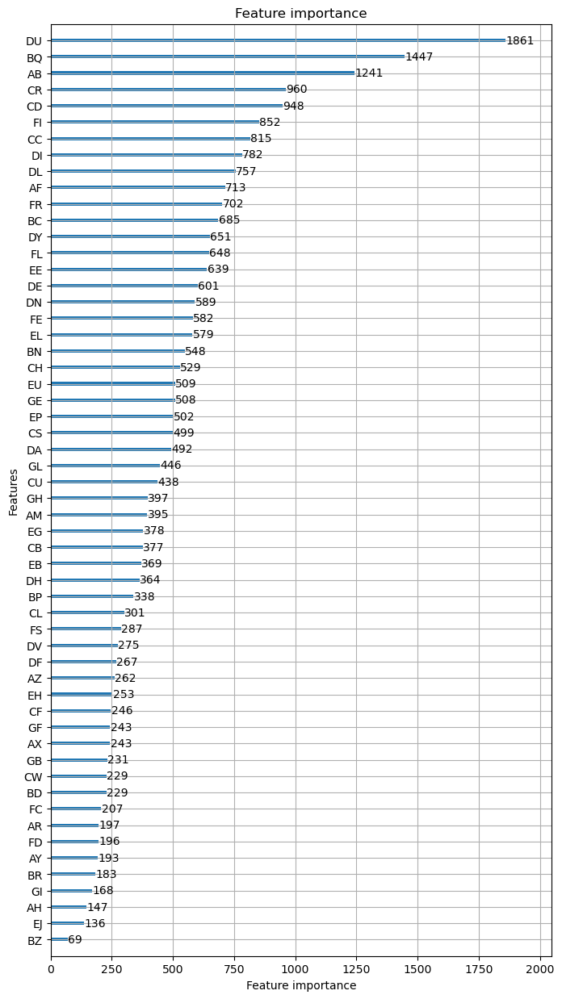

REPEAT NUMBER: 4/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.50325
[200]	valid_0's balanced_logloss: 0.403664
[300]	valid_0's balanced_logloss: 0.346952
[400]	valid_0's balanced_logloss: 0.311611
[500]	valid_0's balanced_logloss: 0.279696
[600]	valid_0's balanced_logloss: 0.264635
[700]	valid_0's balanced_logloss: 0.255529
[800]	valid_0's balanced_logloss: 0.249673
[900]	valid_0's balanced_logloss: 0.245783
[1000]	valid_0's balanced_logloss: 0.243937
[1100]	valid_0's balanced_logloss: 0.241863
[1200]	valid_0's balanced_logloss: 0.243581
[1300]	valid_0's balanced_logloss: 0.245201
[1400]	valid_0's balanced_logloss: 0.243866
[1500]	valid_0's balanced_logloss: 0.786346
[1600]	valid_0's balanced_logloss: 1.20564
[1700]	valid_0's balanced_logloss: 11.8565


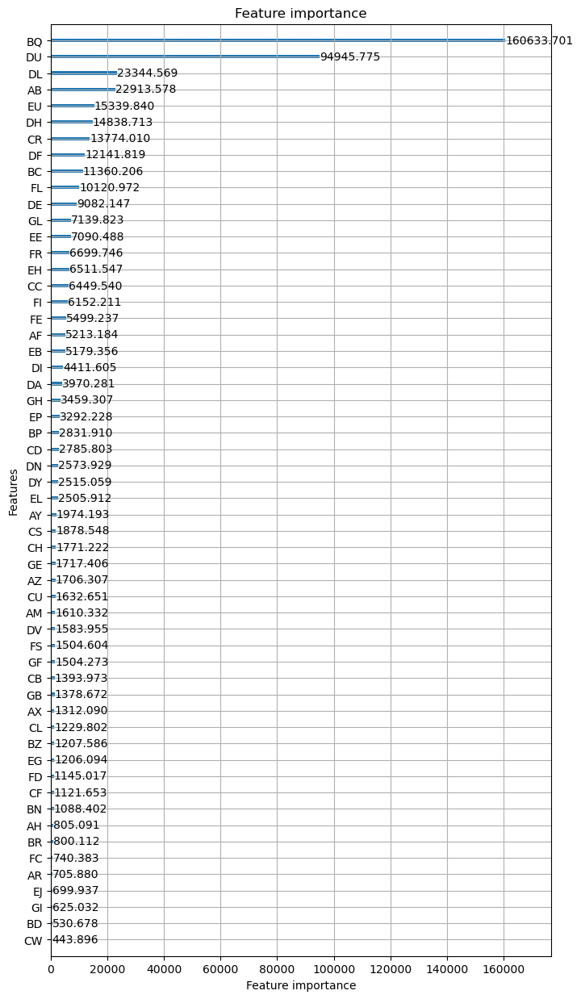

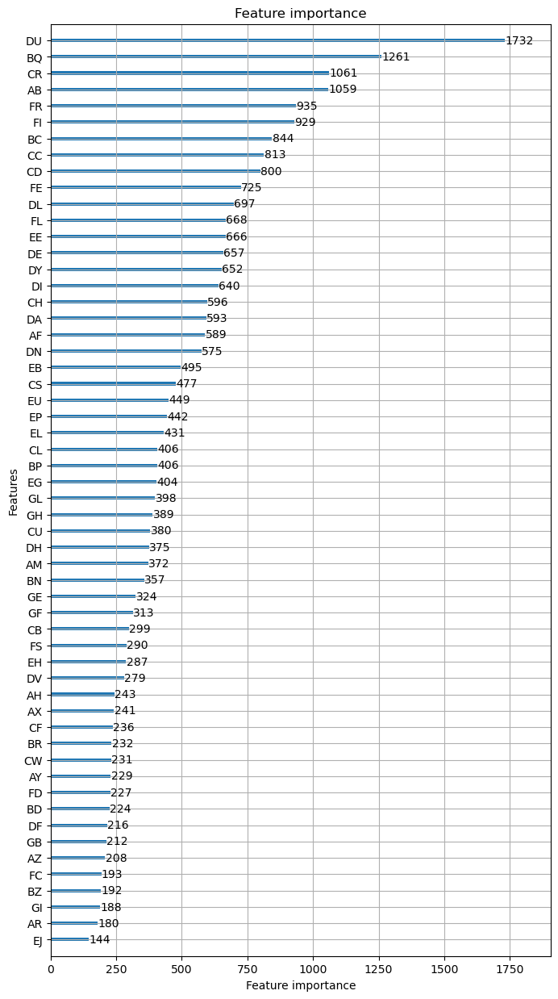

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.523043
[200]	valid_0's balanced_logloss: 0.442777
[300]	valid_0's balanced_logloss: 0.392914
[400]	valid_0's balanced_logloss: 0.366794
[500]	valid_0's balanced_logloss: 0.361152
[600]	valid_0's balanced_logloss: 0.355452
[700]	valid_0's balanced_logloss: 0.356689
[800]	valid_0's balanced_logloss: 0.358183
[900]	valid_0's balanced_logloss: 0.36876
[1000]	valid_0's balanced_logloss: 0.374561
[1100]	valid_0's balanced_logloss: 0.380299
[1200]	valid_0's balanced_logloss: 0.381932
[1300]	valid_0's balanced_logloss: 0.388609
[1400]	valid_0's balanced_logloss: 0.398183
[1500]	valid_0's balanced_logloss: 0.472961
[1600]	valid_0's balanced_logloss: 7.99914
[1700]	valid_0's balanced_logloss: 13.4923


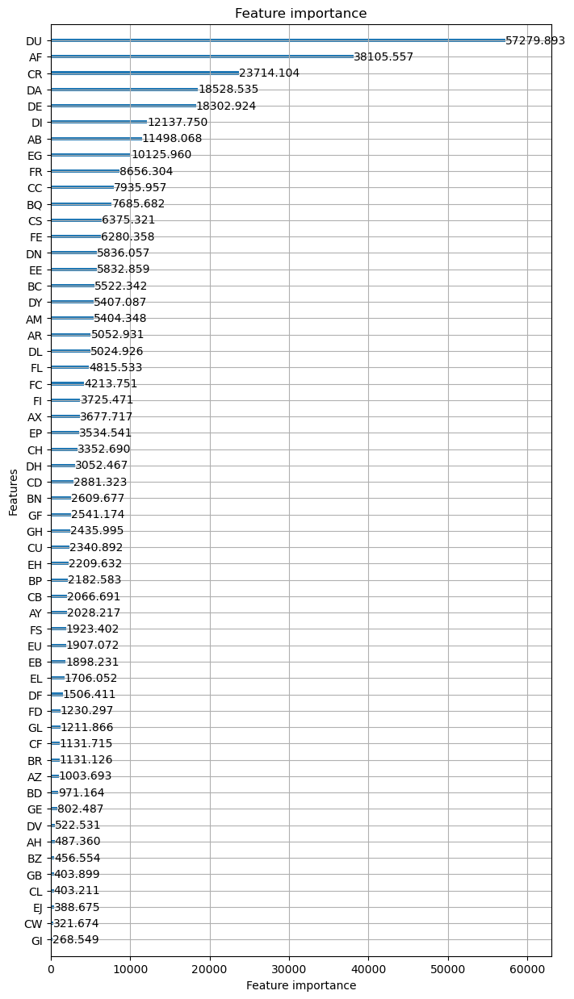

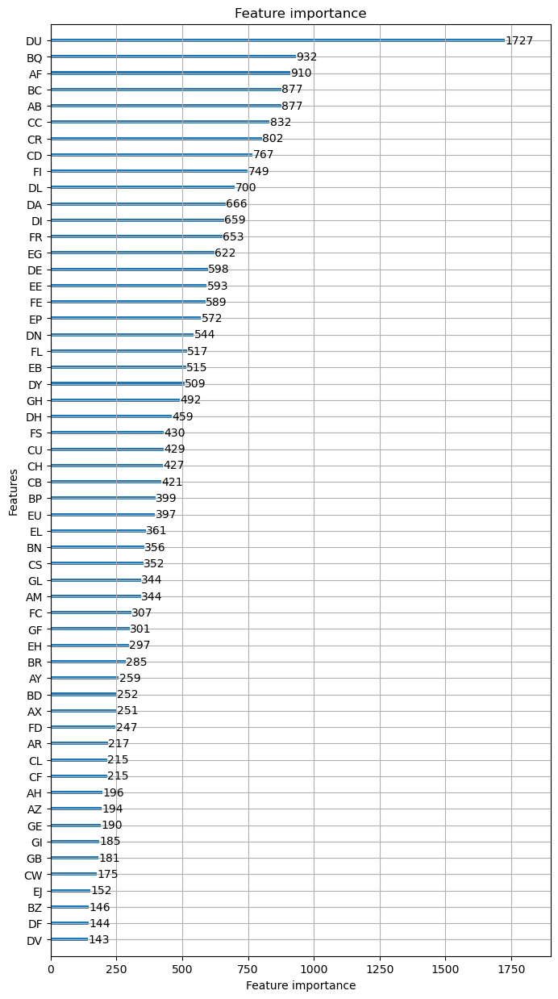

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.471397
[200]	valid_0's balanced_logloss: 0.372213
[300]	valid_0's balanced_logloss: 0.320761
[400]	valid_0's balanced_logloss: 0.298696
[500]	valid_0's balanced_logloss: 0.290638
[600]	valid_0's balanced_logloss: 0.282027
[700]	valid_0's balanced_logloss: 0.283618
[800]	valid_0's balanced_logloss: 0.286025
[900]	valid_0's balanced_logloss: 0.293908
[1000]	valid_0's balanced_logloss: 0.301283
[1100]	valid_0's balanced_logloss: 0.307358
[1200]	valid_0's balanced_logloss: 0.314865
[1300]	valid_0's balanced_logloss: 0.32562
[1400]	valid_0's balanced_logloss: 0.337288
[1500]	valid_0's balanced_logloss: 0.344955
[1600]	valid_0's balanced_logloss: 0.354602
[1700]	valid_0's balanced_logloss: 0.367645


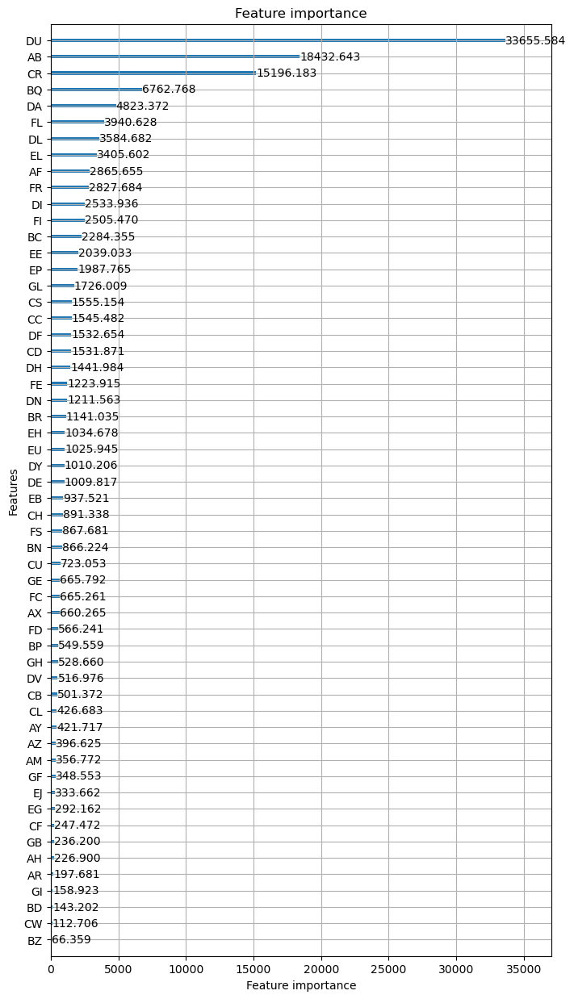

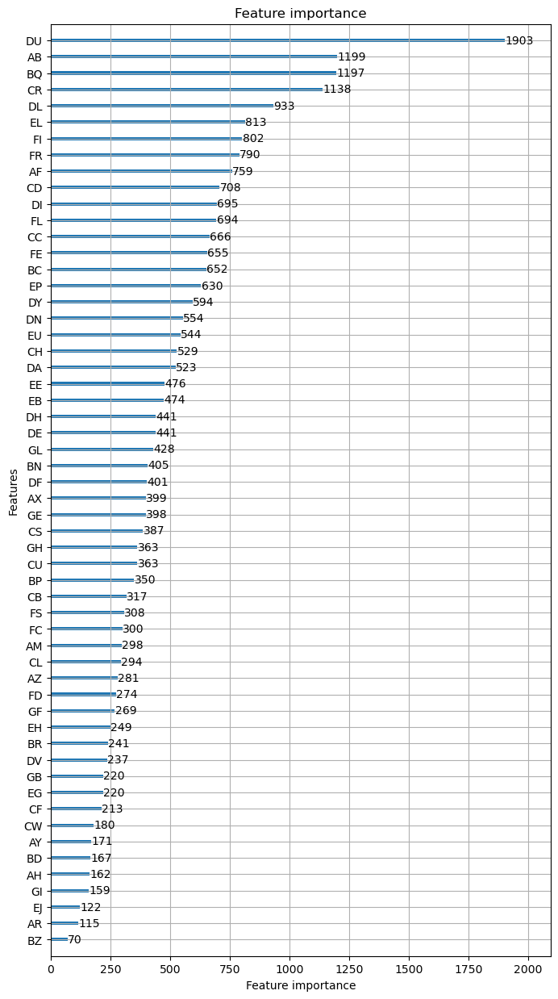

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.460233
[200]	valid_0's balanced_logloss: 0.343138
[300]	valid_0's balanced_logloss: 0.500901
[400]	valid_0's balanced_logloss: 0.478253
[500]	valid_0's balanced_logloss: 0.209858
[600]	valid_0's balanced_logloss: 0.188089
[700]	valid_0's balanced_logloss: 0.170292
[800]	valid_0's balanced_logloss: 0.155969
[900]	valid_0's balanced_logloss: 0.145772
[1000]	valid_0's balanced_logloss: 0.13994
[1100]	valid_0's balanced_logloss: 0.135597
[1200]	valid_0's balanced_logloss: 0.130689
[1300]	valid_0's balanced_logloss: 0.128679
[1400]	valid_0's balanced_logloss: 0.126363
[1500]	valid_0's balanced_logloss: 0.123889
[1600]	valid_0's balanced_logloss: 0.124446
[1700]	valid_0's balanced_logloss: 0.12317


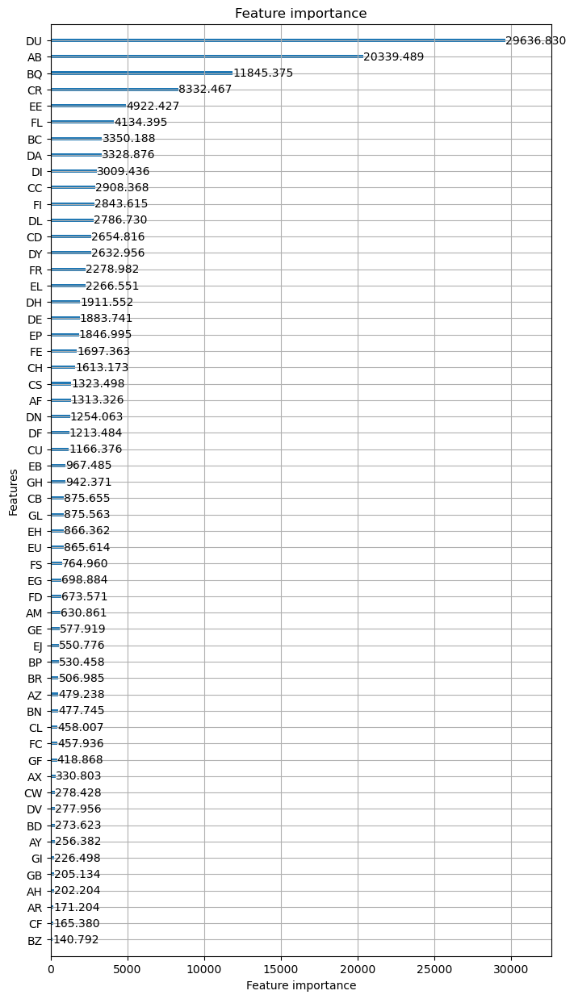

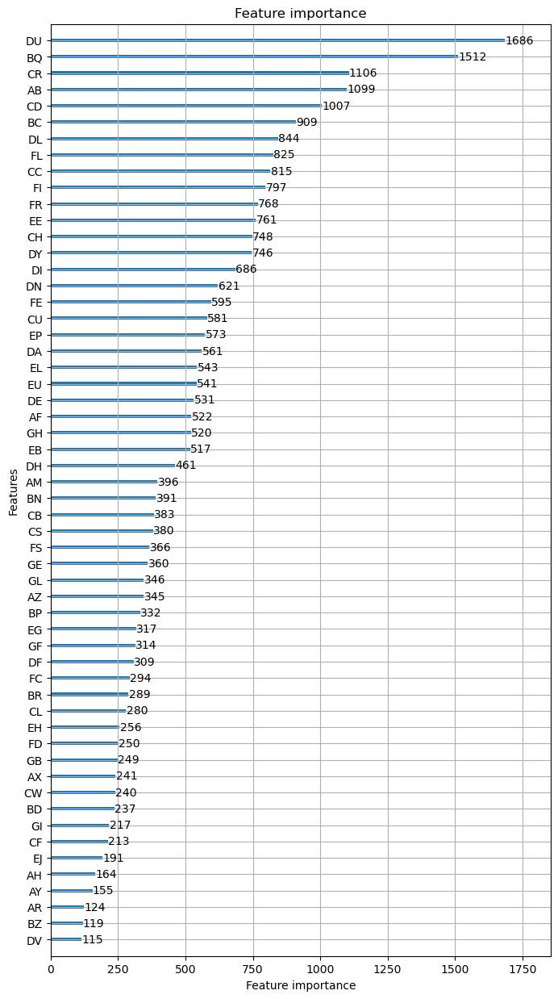

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.481528
[200]	valid_0's balanced_logloss: 0.390515
[300]	valid_0's balanced_logloss: 0.332332
[400]	valid_0's balanced_logloss: 0.29766
[500]	valid_0's balanced_logloss: 0.274438
[600]	valid_0's balanced_logloss: 0.259654
[700]	valid_0's balanced_logloss: 0.247056
[800]	valid_0's balanced_logloss: 0.238824
[900]	valid_0's balanced_logloss: 0.232638
[1000]	valid_0's balanced_logloss: 0.226958
[1100]	valid_0's balanced_logloss: 0.221497
[1200]	valid_0's balanced_logloss: 0.21712
[1300]	valid_0's balanced_logloss: 0.204287
[1400]	valid_0's balanced_logloss: 0.198172
[1500]	valid_0's balanced_logloss: 0.195976
[1600]	valid_0's balanced_logloss: 0.195553
[1700]	valid_0's balanced_logloss: 0.199157


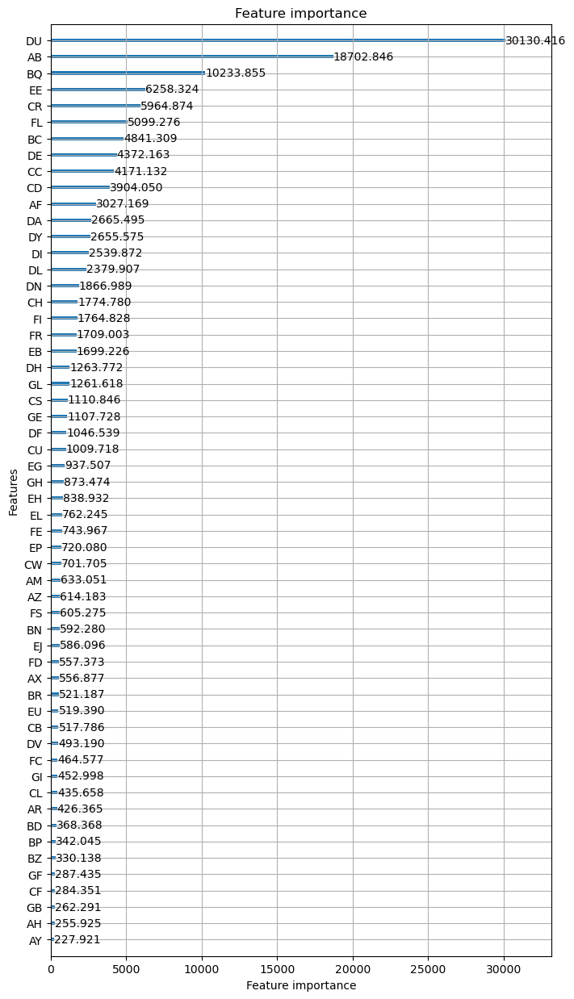

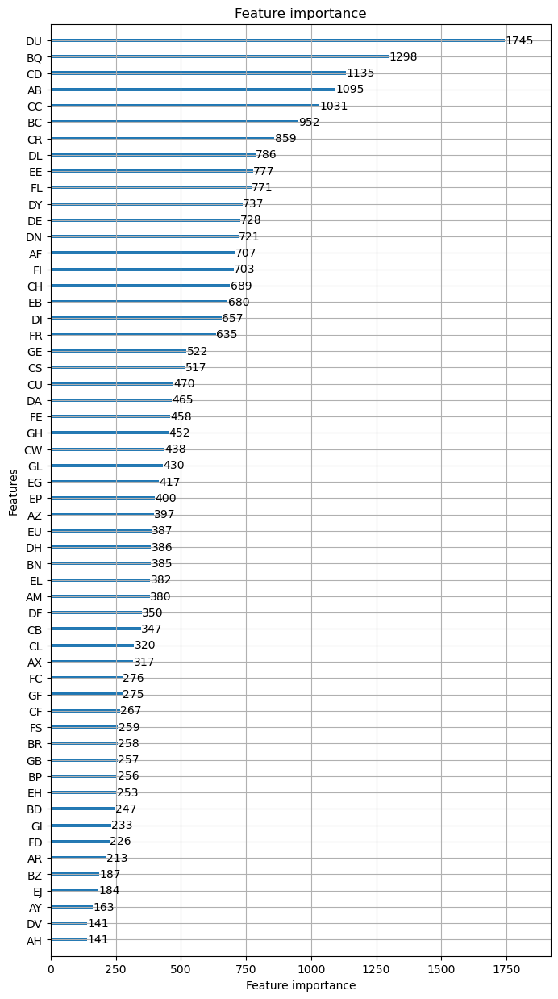

REPEAT NUMBER: 5/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.520248
[200]	valid_0's balanced_logloss: 0.383565
[300]	valid_0's balanced_logloss: 0.345783
[400]	valid_0's balanced_logloss: 0.303987
[500]	valid_0's balanced_logloss: 0.272298
[600]	valid_0's balanced_logloss: 0.253549
[700]	valid_0's balanced_logloss: 0.244085
[800]	valid_0's balanced_logloss: 0.236257
[900]	valid_0's balanced_logloss: 0.233806
[1000]	valid_0's balanced_logloss: 0.233892
[1100]	valid_0's balanced_logloss: 0.23096
[1200]	valid_0's balanced_logloss: 0.232041
[1300]	valid_0's balanced_logloss: 0.228945
[1400]	valid_0's balanced_logloss: 0.230877
[1500]	valid_0's balanced_logloss: 0.234225
[1600]	valid_0's balanced_logloss: 0.236505
[1700]	valid_0's balanced_logloss: 0.23827


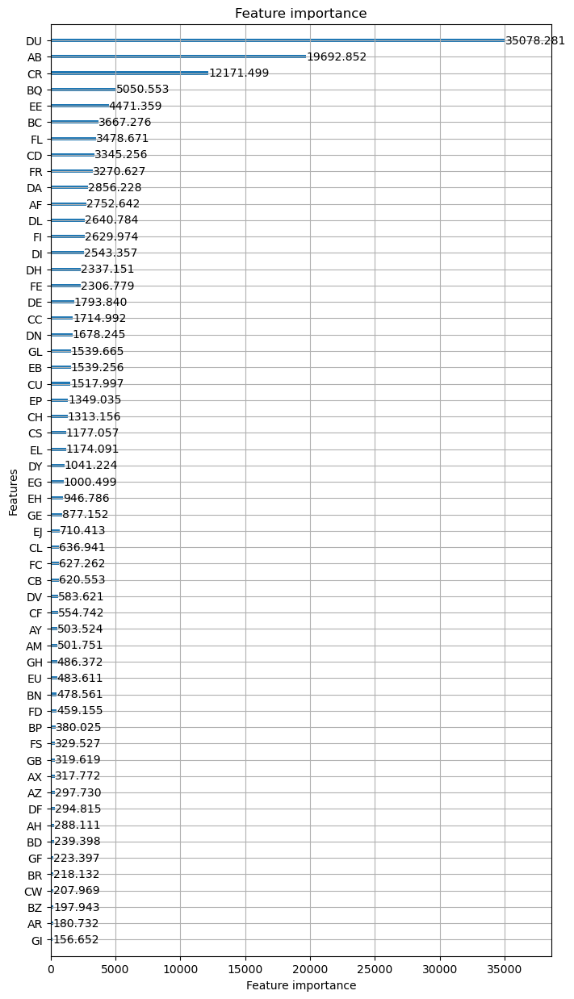

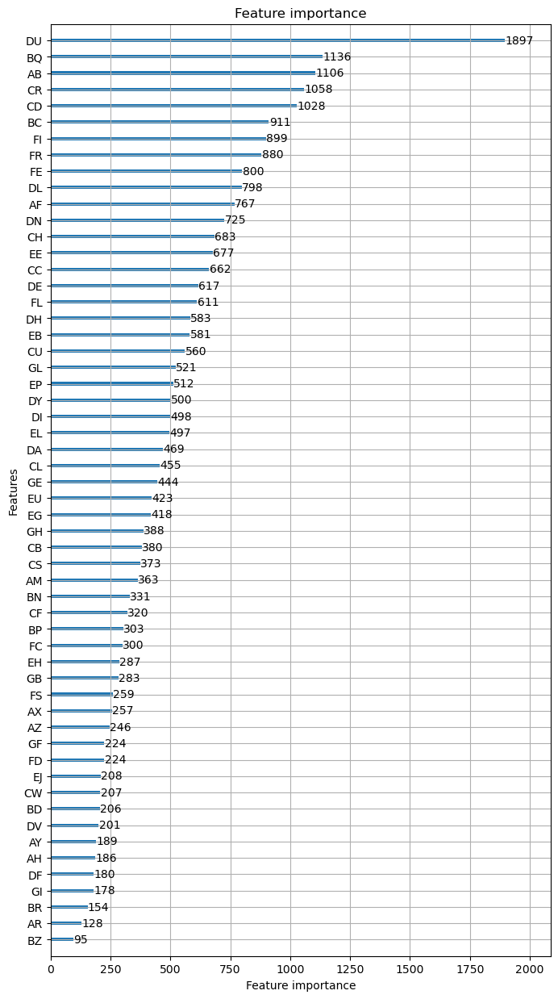

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.477508
[200]	valid_0's balanced_logloss: 0.364479
[300]	valid_0's balanced_logloss: 0.303228
[400]	valid_0's balanced_logloss: 0.267947
[500]	valid_0's balanced_logloss: 0.246308
[600]	valid_0's balanced_logloss: 0.234339
[700]	valid_0's balanced_logloss: 0.225379
[800]	valid_0's balanced_logloss: 0.21516
[900]	valid_0's balanced_logloss: 0.207186
[1000]	valid_0's balanced_logloss: 0.200647
[1100]	valid_0's balanced_logloss: 0.198378
[1200]	valid_0's balanced_logloss: 0.197966
[1300]	valid_0's balanced_logloss: 0.196998
[1400]	valid_0's balanced_logloss: 0.19504
[1500]	valid_0's balanced_logloss: 0.191403
[1600]	valid_0's balanced_logloss: 0.191936
[1700]	valid_0's balanced_logloss: 0.193993


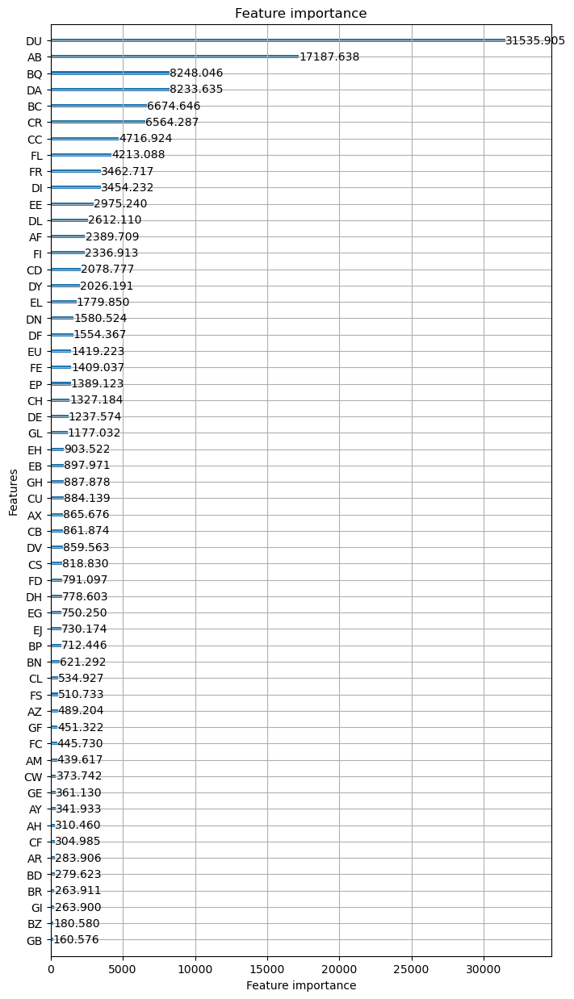

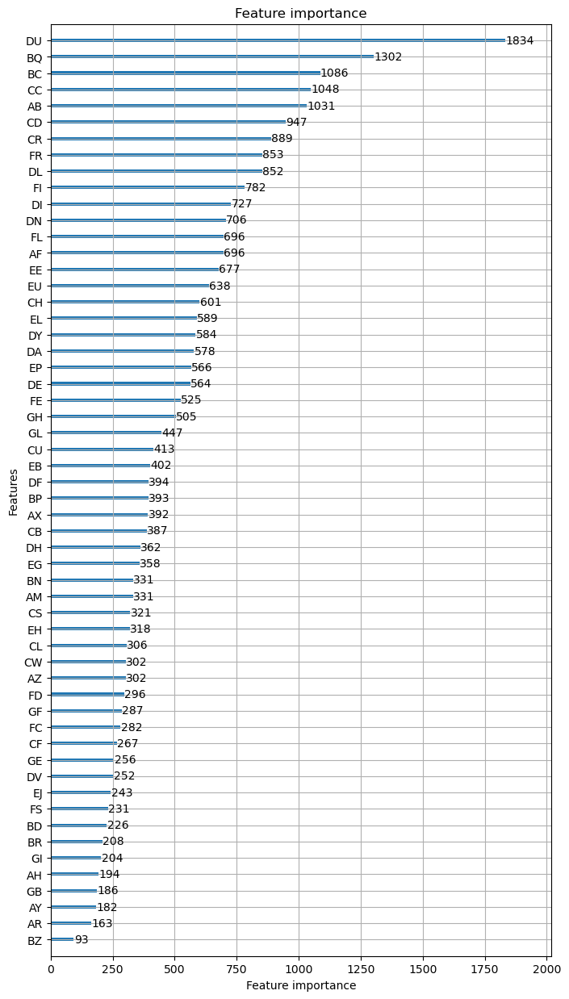

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.487604
[200]	valid_0's balanced_logloss: 0.380776
[300]	valid_0's balanced_logloss: 0.326735
[400]	valid_0's balanced_logloss: 0.293019
[500]	valid_0's balanced_logloss: 0.270372
[600]	valid_0's balanced_logloss: 0.247711
[700]	valid_0's balanced_logloss: 0.230662
[800]	valid_0's balanced_logloss: 0.214407
[900]	valid_0's balanced_logloss: 0.204522
[1000]	valid_0's balanced_logloss: 0.195726
[1100]	valid_0's balanced_logloss: 0.30993
[1200]	valid_0's balanced_logloss: 0.291323
[1300]	valid_0's balanced_logloss: 0.281074
[1400]	valid_0's balanced_logloss: 0.274566
[1500]	valid_0's balanced_logloss: 0.263088
[1600]	valid_0's balanced_logloss: 0.249143
[1700]	valid_0's balanced_logloss: 0.24262


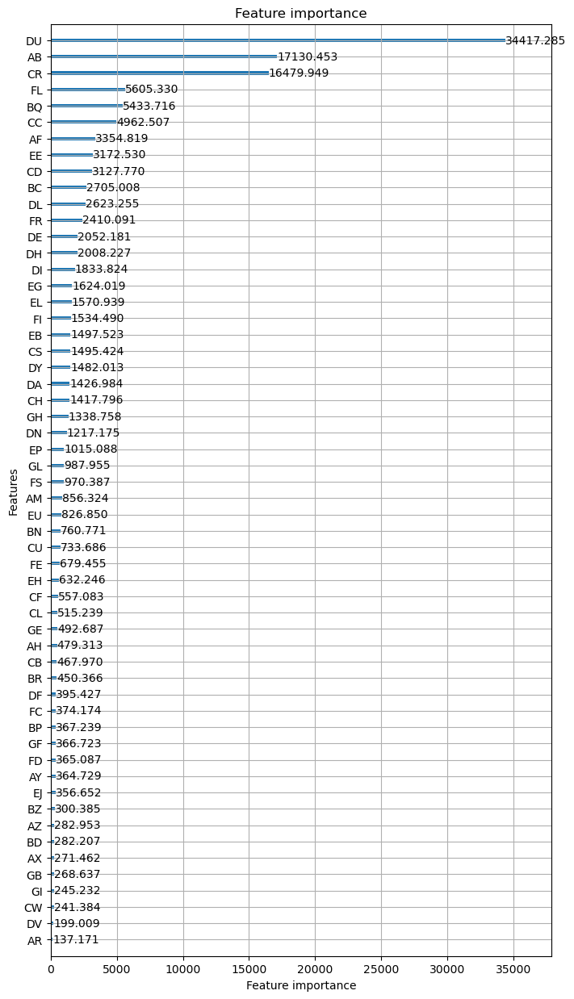

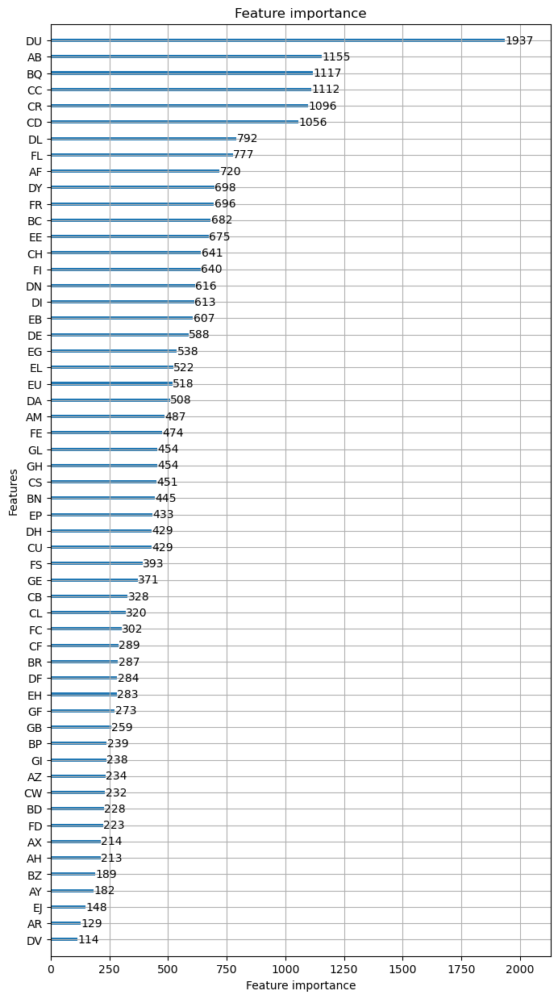

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.477384
[200]	valid_0's balanced_logloss: 0.363647
[300]	valid_0's balanced_logloss: 0.295529
[400]	valid_0's balanced_logloss: 0.250013
[500]	valid_0's balanced_logloss: 0.217655
[600]	valid_0's balanced_logloss: 0.192405
[700]	valid_0's balanced_logloss: 0.175529
[800]	valid_0's balanced_logloss: 0.161636
[900]	valid_0's balanced_logloss: 0.154659
[1000]	valid_0's balanced_logloss: 0.145566
[1100]	valid_0's balanced_logloss: 0.14073
[1200]	valid_0's balanced_logloss: 0.136412
[1300]	valid_0's balanced_logloss: 0.172652
[1400]	valid_0's balanced_logloss: 0.317283
[1500]	valid_0's balanced_logloss: 0.309264
[1600]	valid_0's balanced_logloss: 0.300235
[1700]	valid_0's balanced_logloss: 0.287303


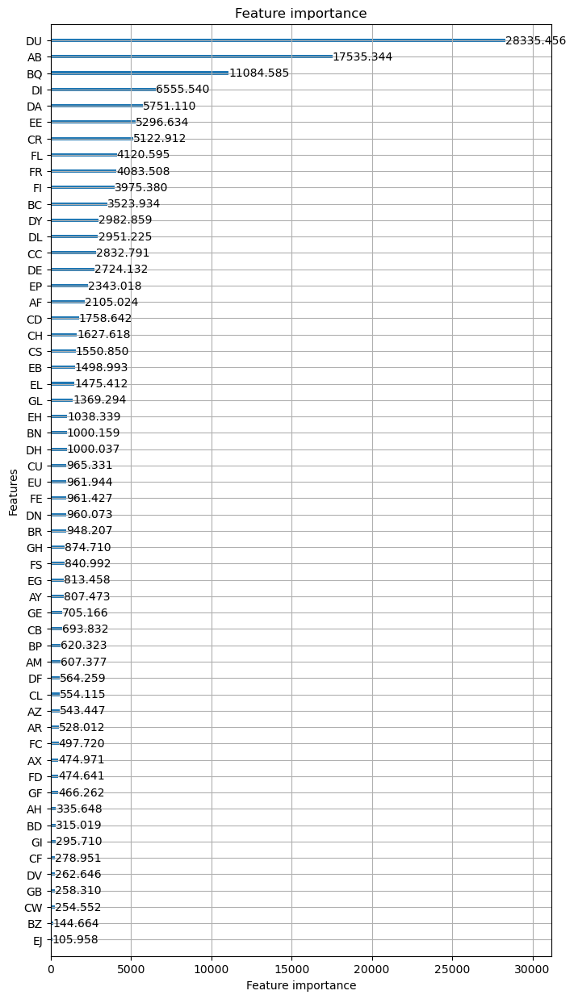

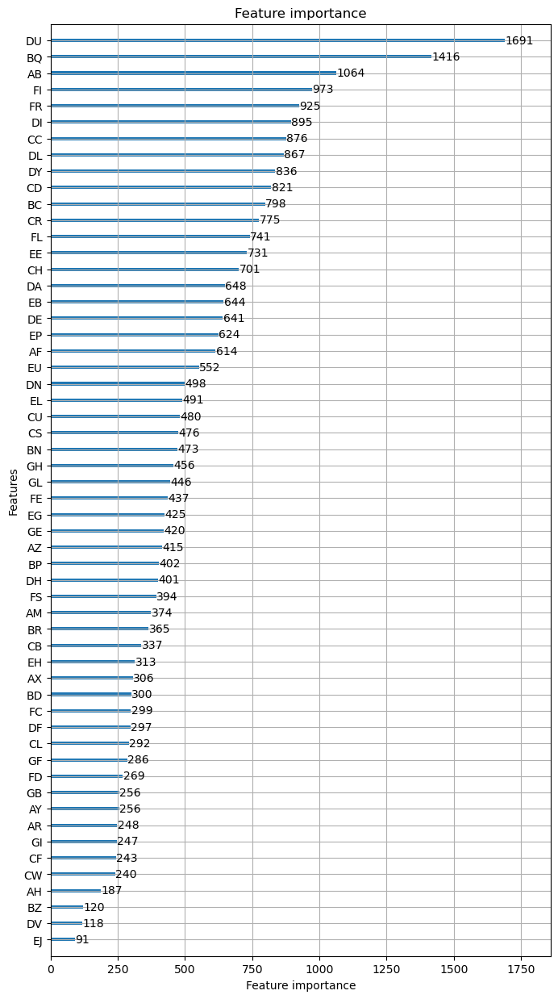

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.516028
[200]	valid_0's balanced_logloss: 0.434555
[300]	valid_0's balanced_logloss: 0.403896
[400]	valid_0's balanced_logloss: 0.393911
[500]	valid_0's balanced_logloss: 0.391461
[600]	valid_0's balanced_logloss: 0.404765
[700]	valid_0's balanced_logloss: 0.419295
[800]	valid_0's balanced_logloss: 0.441159
[900]	valid_0's balanced_logloss: 0.457733
[1000]	valid_0's balanced_logloss: 0.472888
[1100]	valid_0's balanced_logloss: 0.497078
[1200]	valid_0's balanced_logloss: 0.516259
[1300]	valid_0's balanced_logloss: 0.5417
[1400]	valid_0's balanced_logloss: 0.563222
[1500]	valid_0's balanced_logloss: 0.58129
[1600]	valid_0's balanced_logloss: 0.603722
[1700]	valid_0's balanced_logloss: 0.618607


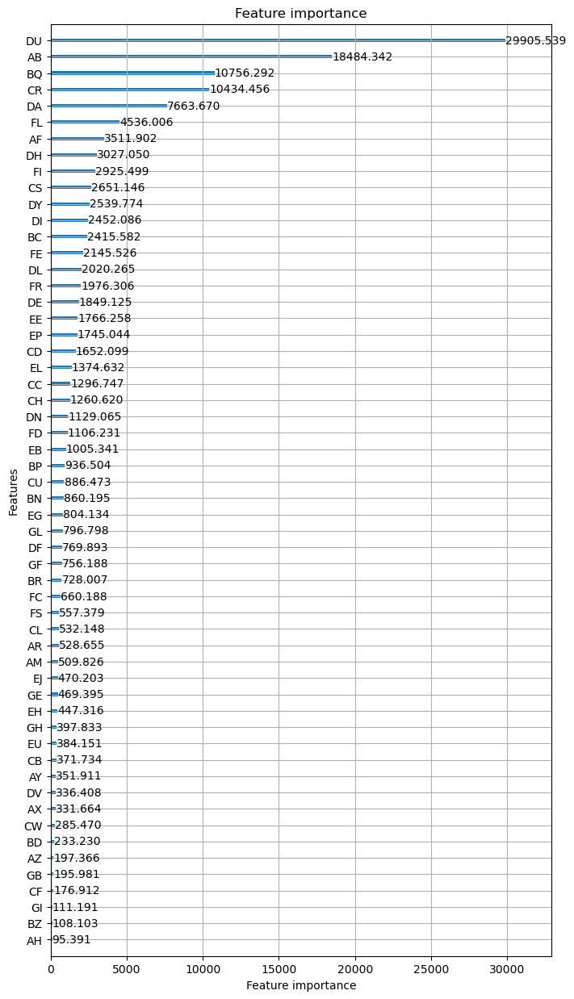

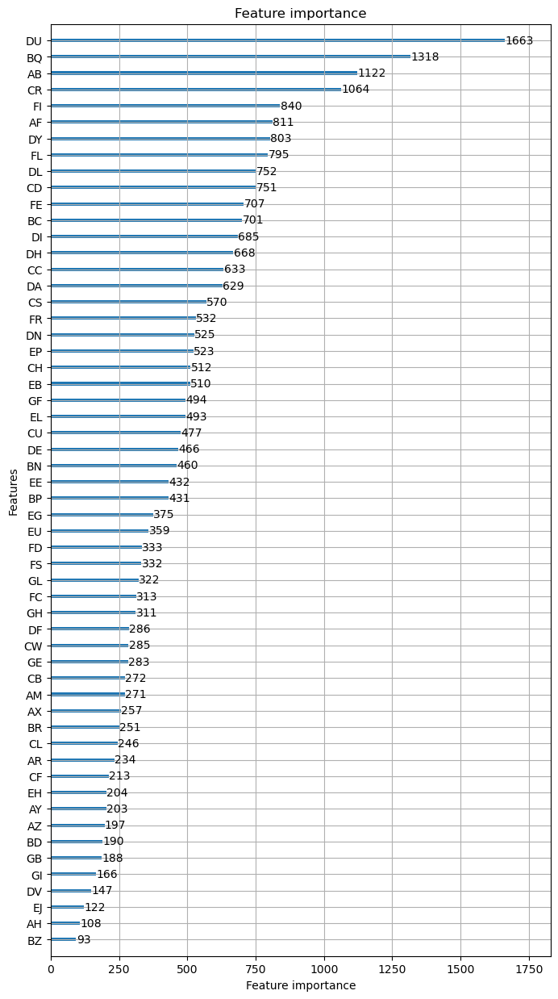

REPEAT NUMBER: 6/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.500898
[200]	valid_0's balanced_logloss: 0.37717
[300]	valid_0's balanced_logloss: 0.516363
[400]	valid_0's balanced_logloss: 0.449221
[500]	valid_0's balanced_logloss: 0.323034
[600]	valid_0's balanced_logloss: 0.243846
[700]	valid_0's balanced_logloss: 0.233109
[800]	valid_0's balanced_logloss: 0.22411
[900]	valid_0's balanced_logloss: 0.216577
[1000]	valid_0's balanced_logloss: 0.201416
[1100]	valid_0's balanced_logloss: 0.201144
[1200]	valid_0's balanced_logloss: 0.196139
[1300]	valid_0's balanced_logloss: 0.190808
[1400]	valid_0's balanced_logloss: 0.188882
[1500]	valid_0's balanced_logloss: 0.212011
[1600]	valid_0's balanced_logloss: 3.62435
[1700]	valid_0's balanced_logloss: 9.23511


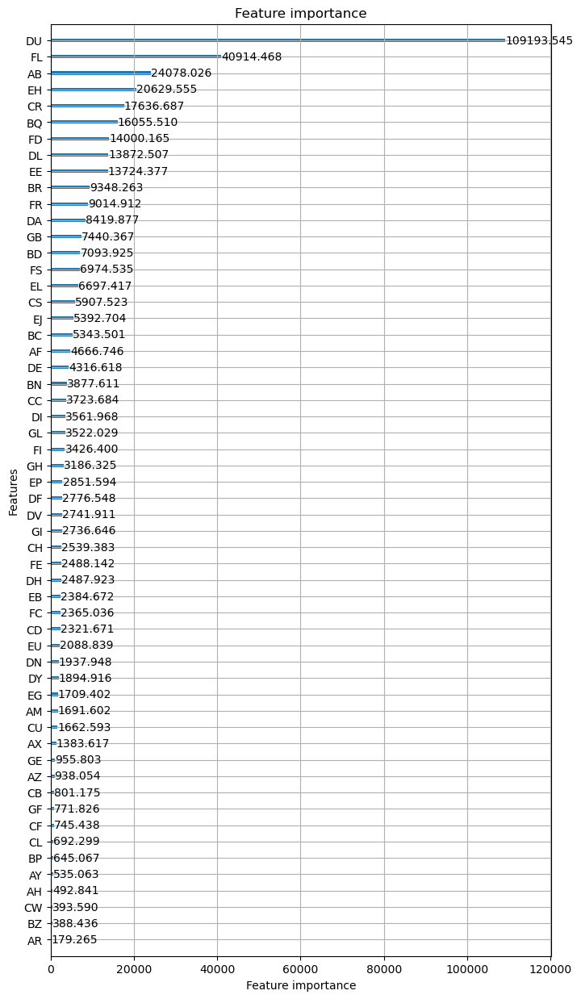

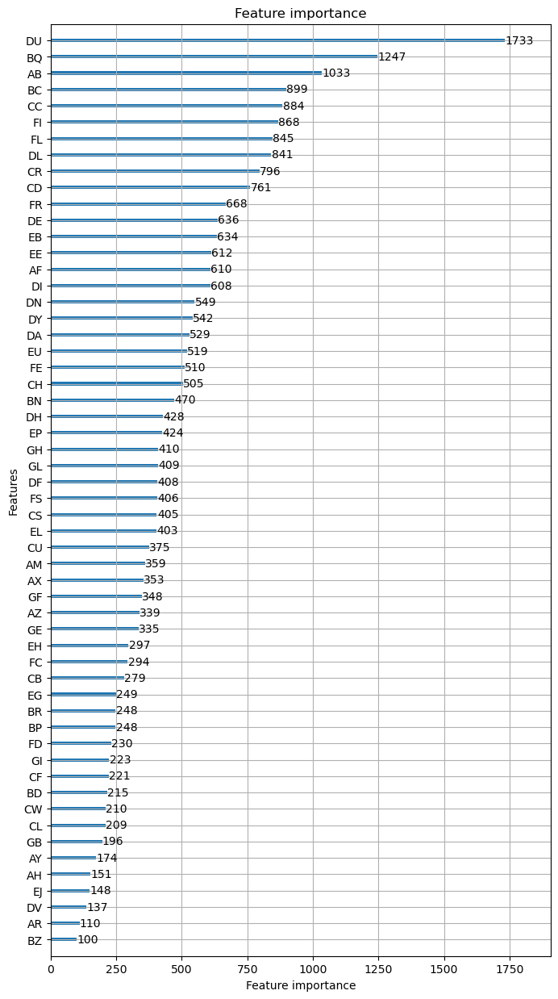

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.49687
[200]	valid_0's balanced_logloss: 0.400536
[300]	valid_0's balanced_logloss: 0.347854
[400]	valid_0's balanced_logloss: 0.308786
[500]	valid_0's balanced_logloss: 0.286855
[600]	valid_0's balanced_logloss: 0.272657
[700]	valid_0's balanced_logloss: 0.260409
[800]	valid_0's balanced_logloss: 0.256308
[900]	valid_0's balanced_logloss: 0.253491
[1000]	valid_0's balanced_logloss: 0.254011
[1100]	valid_0's balanced_logloss: 0.25088
[1200]	valid_0's balanced_logloss: 0.249944
[1300]	valid_0's balanced_logloss: 0.250305
[1400]	valid_0's balanced_logloss: 0.250431
[1500]	valid_0's balanced_logloss: 0.253466
[1600]	valid_0's balanced_logloss: 0.257775
[1700]	valid_0's balanced_logloss: 0.260354


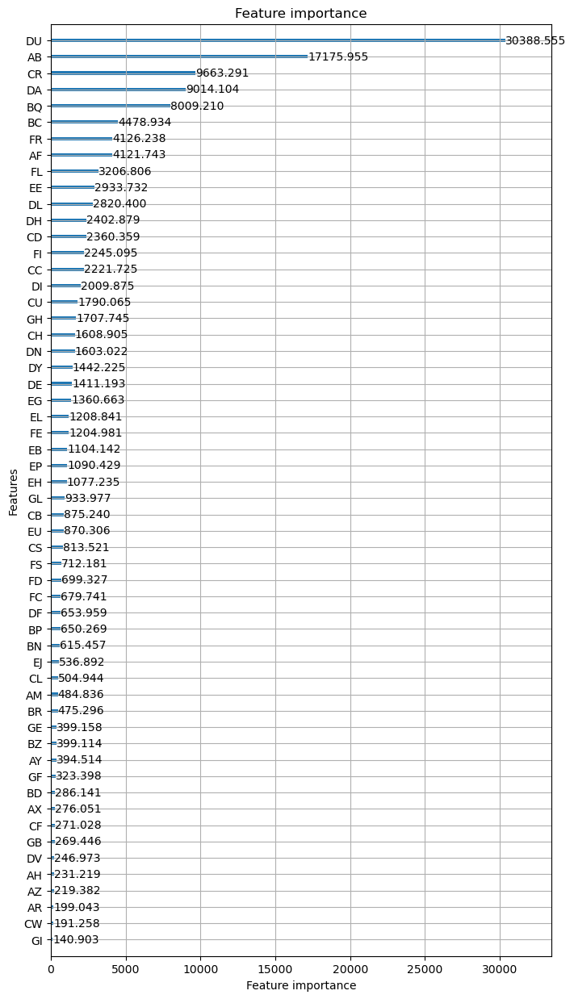

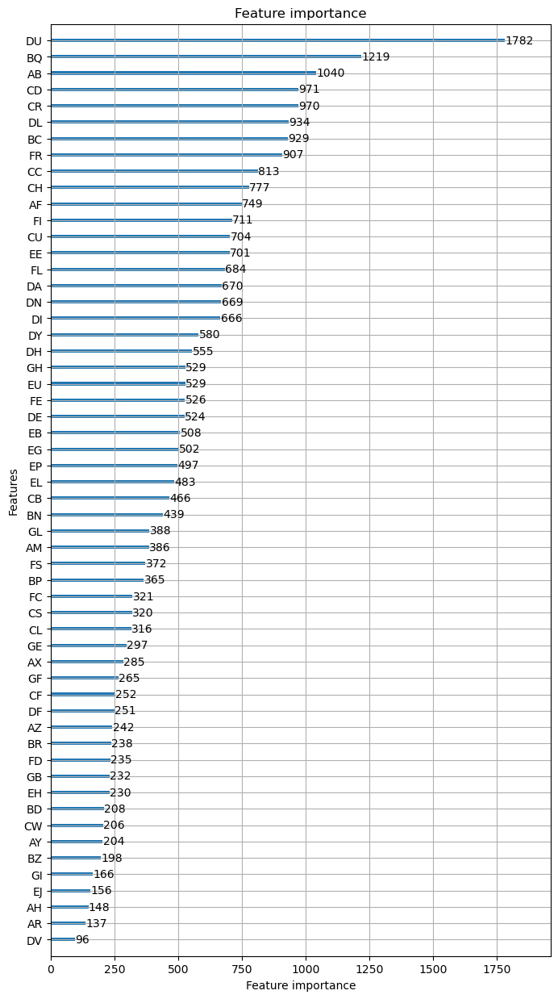

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.478055
[200]	valid_0's balanced_logloss: 0.379905
[300]	valid_0's balanced_logloss: 0.327069
[400]	valid_0's balanced_logloss: 0.291838
[500]	valid_0's balanced_logloss: 0.273103
[600]	valid_0's balanced_logloss: 0.264633
[700]	valid_0's balanced_logloss: 0.251534
[800]	valid_0's balanced_logloss: 0.242319
[900]	valid_0's balanced_logloss: 0.235424
[1000]	valid_0's balanced_logloss: 0.21874
[1100]	valid_0's balanced_logloss: 0.217863
[1200]	valid_0's balanced_logloss: 0.220965
[1300]	valid_0's balanced_logloss: 0.391291
[1400]	valid_0's balanced_logloss: 1.24935
[1500]	valid_0's balanced_logloss: 14.7058
[1600]	valid_0's balanced_logloss: 13.6415
[1700]	valid_0's balanced_logloss: 13.6415


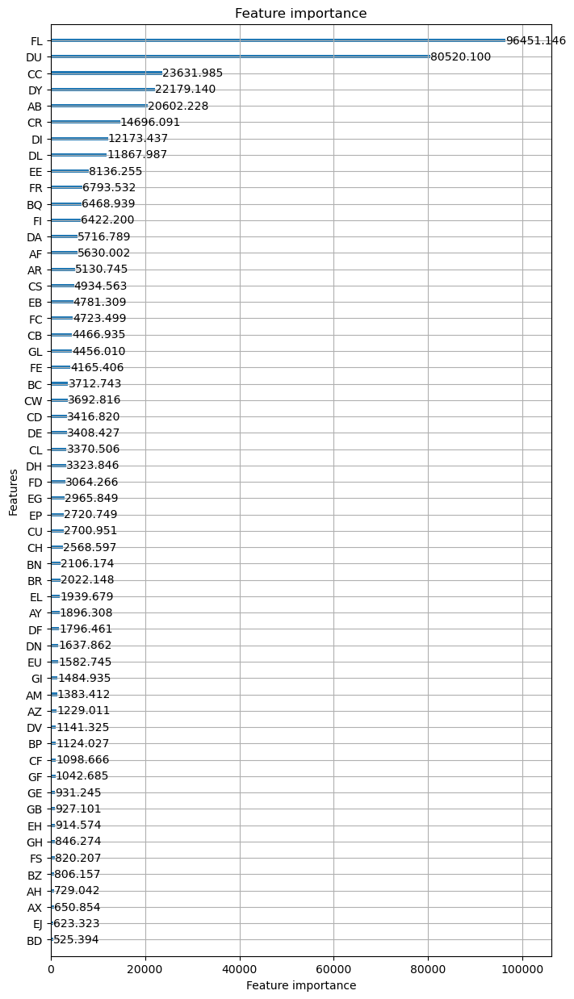

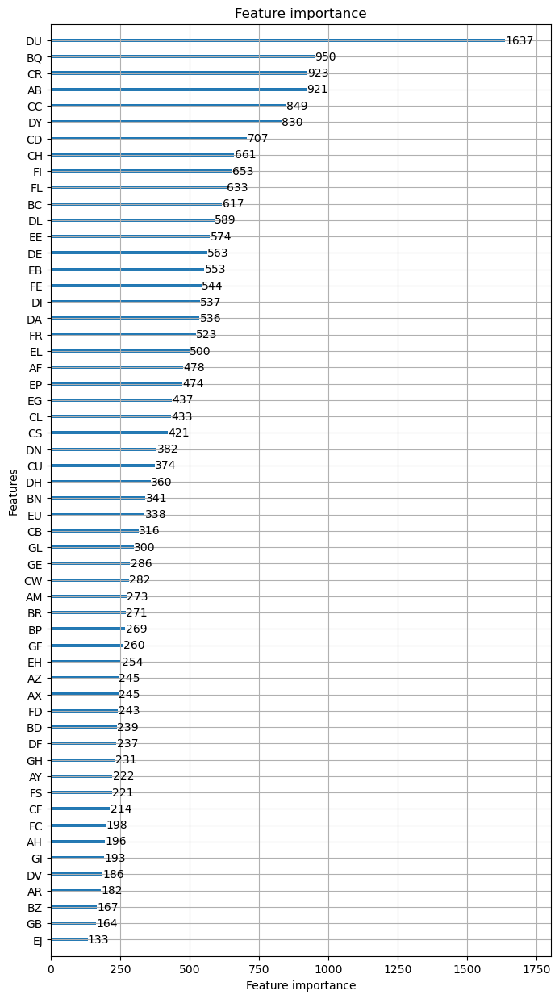

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.498611
[200]	valid_0's balanced_logloss: 0.403726
[300]	valid_0's balanced_logloss: 0.358379
[400]	valid_0's balanced_logloss: 0.330272
[500]	valid_0's balanced_logloss: 0.321555
[600]	valid_0's balanced_logloss: 0.319565
[700]	valid_0's balanced_logloss: 0.320732
[800]	valid_0's balanced_logloss: 0.326116
[900]	valid_0's balanced_logloss: 0.332175
[1000]	valid_0's balanced_logloss: 0.339531
[1100]	valid_0's balanced_logloss: 0.351055
[1200]	valid_0's balanced_logloss: 0.362228
[1300]	valid_0's balanced_logloss: 0.374639
[1400]	valid_0's balanced_logloss: 0.380733
[1500]	valid_0's balanced_logloss: 0.394036
[1600]	valid_0's balanced_logloss: 0.405257
[1700]	valid_0's balanced_logloss: 0.414227


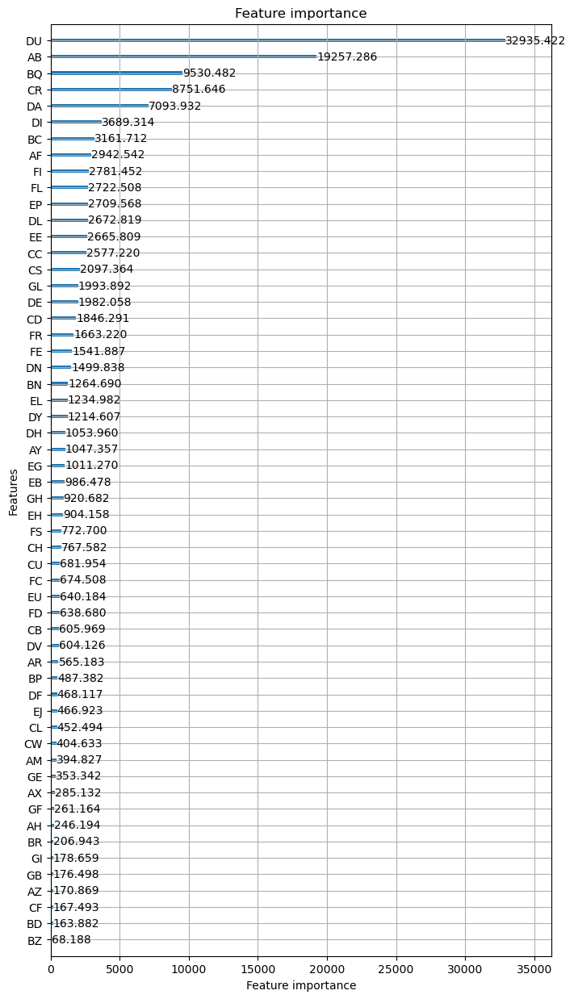

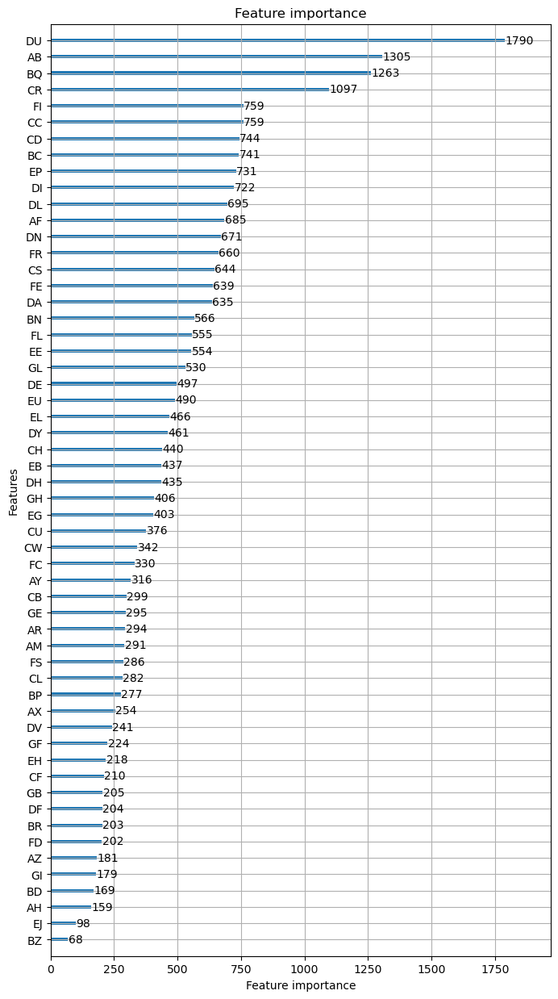

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.50307
[200]	valid_0's balanced_logloss: 0.390024
[300]	valid_0's balanced_logloss: 0.320429
[400]	valid_0's balanced_logloss: 0.353424
[500]	valid_0's balanced_logloss: 0.317396
[600]	valid_0's balanced_logloss: 0.296798
[700]	valid_0's balanced_logloss: 0.224307
[800]	valid_0's balanced_logloss: 0.213678
[900]	valid_0's balanced_logloss: 0.241954
[1000]	valid_0's balanced_logloss: 0.250012
[1100]	valid_0's balanced_logloss: 0.219774
[1200]	valid_0's balanced_logloss: 0.222454
[1300]	valid_0's balanced_logloss: 0.323341
[1400]	valid_0's balanced_logloss: 0.323339
[1500]	valid_0's balanced_logloss: 0.916212
[1600]	valid_0's balanced_logloss: 1.14698
[1700]	valid_0's balanced_logloss: 15.451


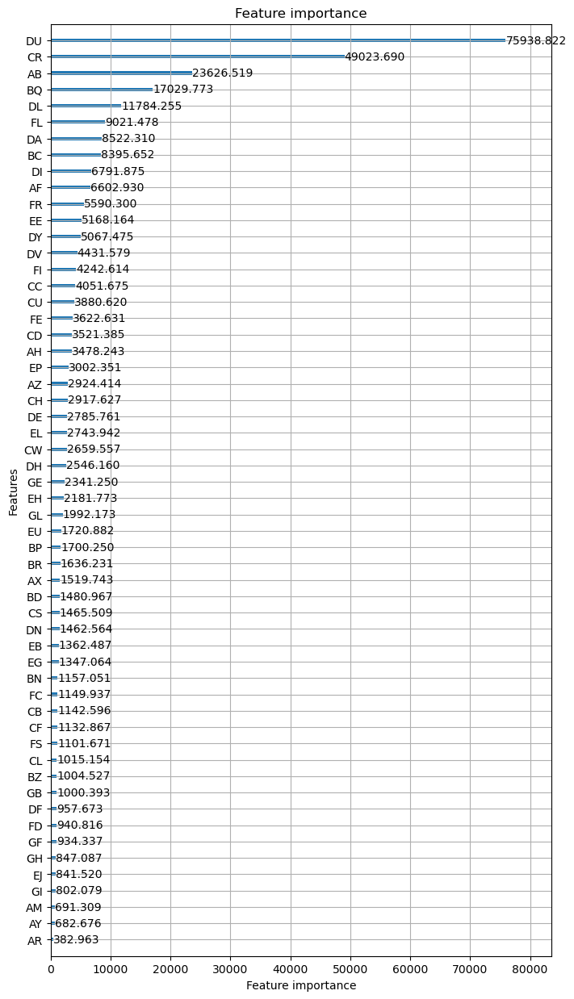

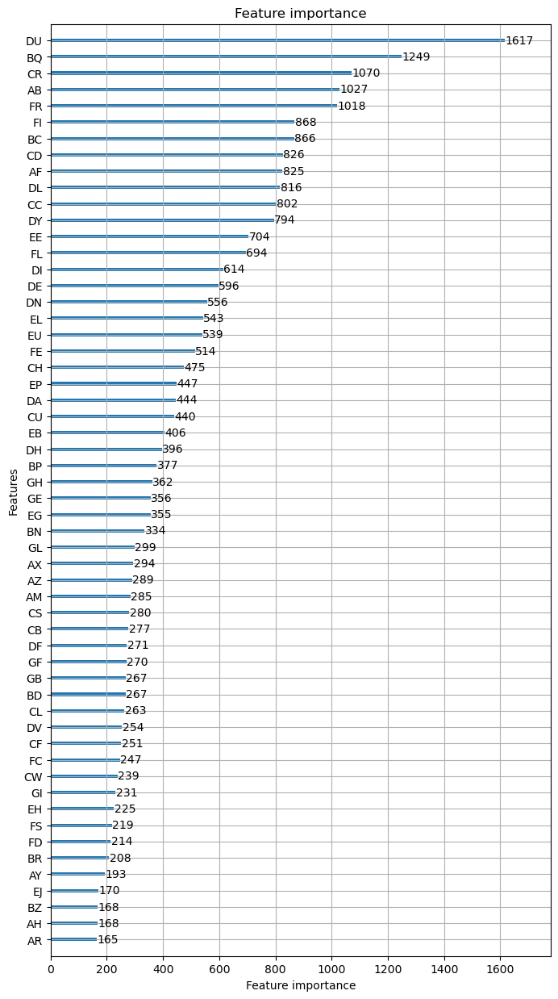

REPEAT NUMBER: 7/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.532706
[200]	valid_0's balanced_logloss: 0.458412
[300]	valid_0's balanced_logloss: 0.432552
[400]	valid_0's balanced_logloss: 0.426302
[500]	valid_0's balanced_logloss: 0.431584
[600]	valid_0's balanced_logloss: 0.444251
[700]	valid_0's balanced_logloss: 0.45664
[800]	valid_0's balanced_logloss: 0.469735
[900]	valid_0's balanced_logloss: 0.487863
[1000]	valid_0's balanced_logloss: 0.500898
[1100]	valid_0's balanced_logloss: 0.513224
[1200]	valid_0's balanced_logloss: 0.531507
[1300]	valid_0's balanced_logloss: 0.54544
[1400]	valid_0's balanced_logloss: 0.558995
[1500]	valid_0's balanced_logloss: 0.575619
[1600]	valid_0's balanced_logloss: 0.592289
[1700]	valid_0's balanced_logloss: 0.605692


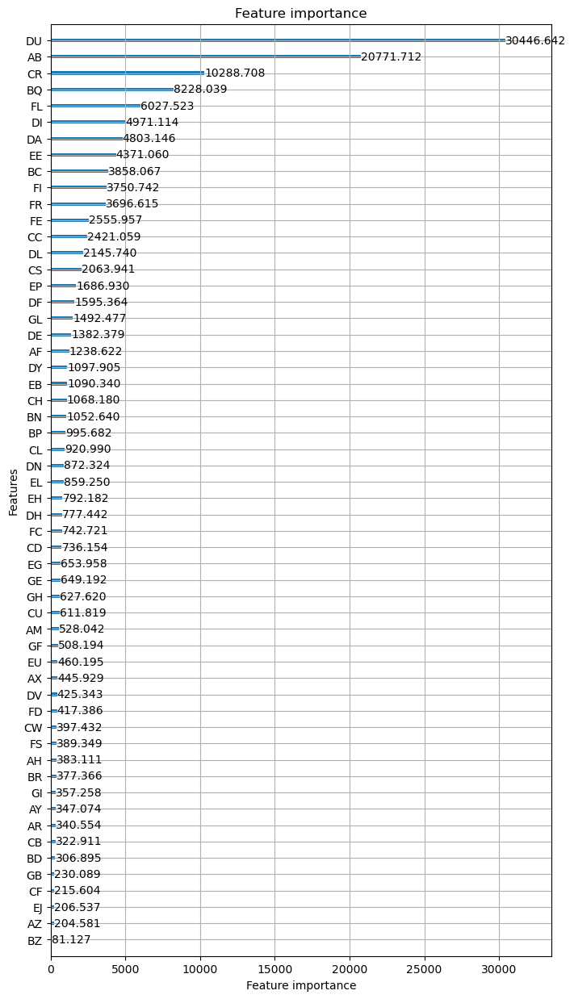

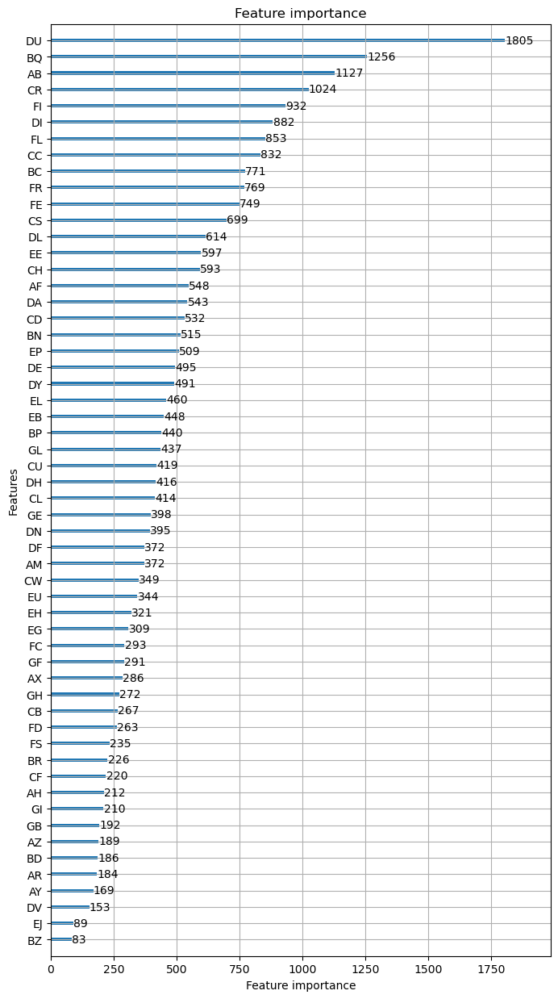

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.474444
[200]	valid_0's balanced_logloss: 0.370441
[300]	valid_0's balanced_logloss: 0.308239
[400]	valid_0's balanced_logloss: 0.274341
[500]	valid_0's balanced_logloss: 0.247113
[600]	valid_0's balanced_logloss: 0.231909
[700]	valid_0's balanced_logloss: 0.21781
[800]	valid_0's balanced_logloss: 0.214635
[900]	valid_0's balanced_logloss: 0.212921
[1000]	valid_0's balanced_logloss: 0.209861
[1100]	valid_0's balanced_logloss: 0.205827
[1200]	valid_0's balanced_logloss: 0.203485
[1300]	valid_0's balanced_logloss: 0.205806
[1400]	valid_0's balanced_logloss: 0.201845
[1500]	valid_0's balanced_logloss: 0.204555
[1600]	valid_0's balanced_logloss: 0.206534
[1700]	valid_0's balanced_logloss: 0.211979


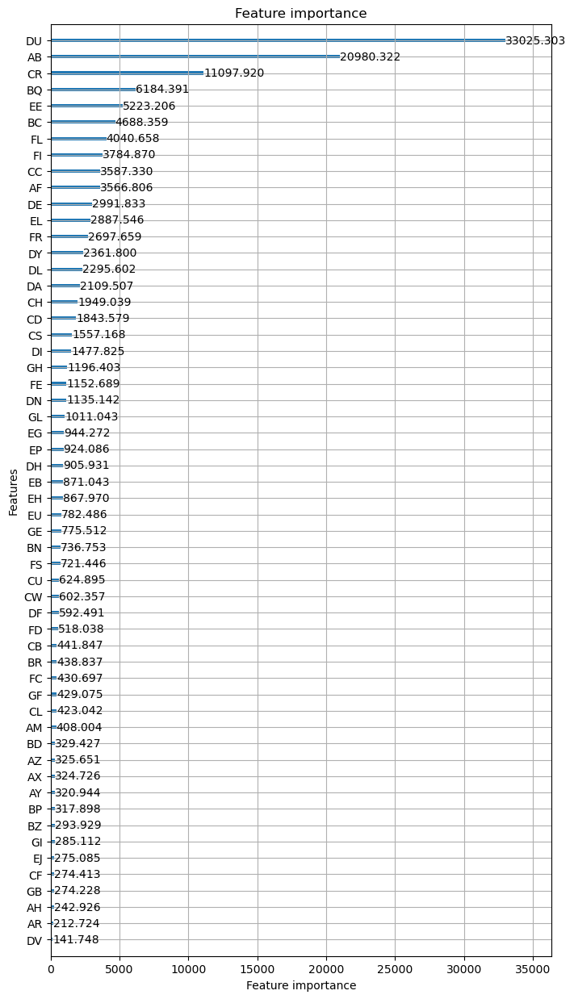

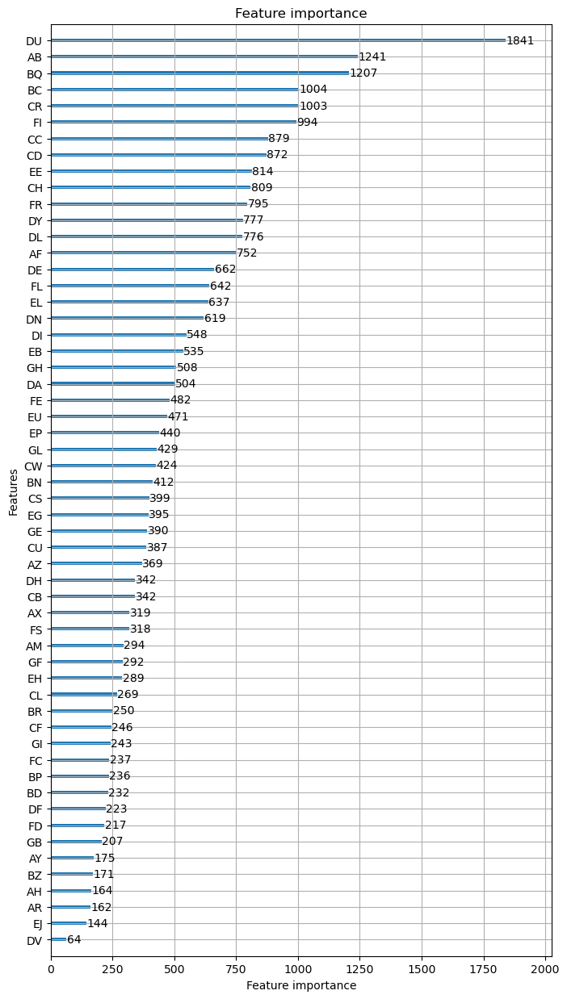

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.455594
[200]	valid_0's balanced_logloss: 0.34306
[300]	valid_0's balanced_logloss: 0.272727
[400]	valid_0's balanced_logloss: 0.227586
[500]	valid_0's balanced_logloss: 0.19681
[600]	valid_0's balanced_logloss: 0.175232
[700]	valid_0's balanced_logloss: 0.15978
[800]	valid_0's balanced_logloss: 0.146636
[900]	valid_0's balanced_logloss: 0.135965
[1000]	valid_0's balanced_logloss: 0.129067
[1100]	valid_0's balanced_logloss: 0.121861
[1200]	valid_0's balanced_logloss: 0.116404
[1300]	valid_0's balanced_logloss: 0.111542
[1400]	valid_0's balanced_logloss: 0.108035
[1500]	valid_0's balanced_logloss: 0.107474
[1600]	valid_0's balanced_logloss: 0.104233
[1700]	valid_0's balanced_logloss: 0.102474


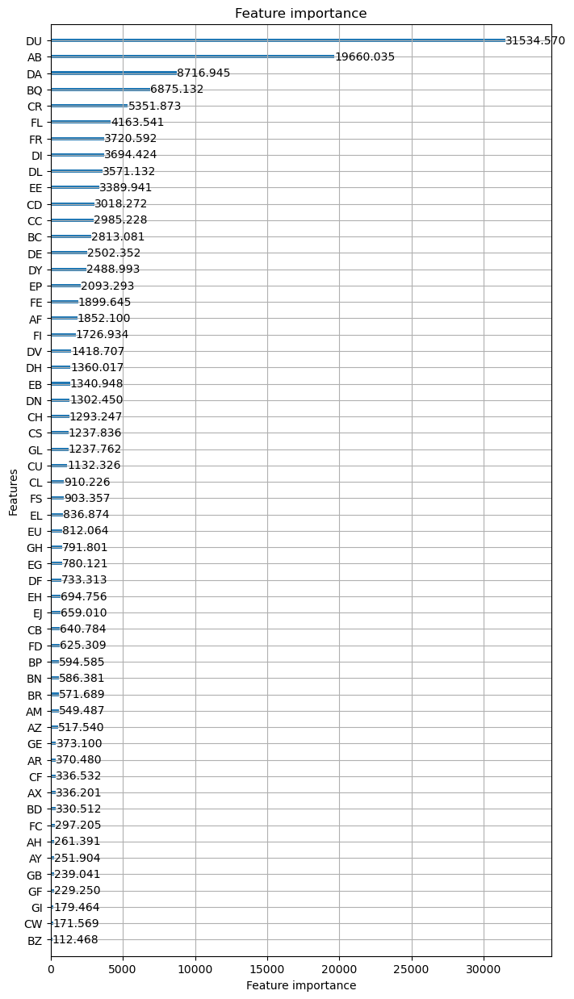

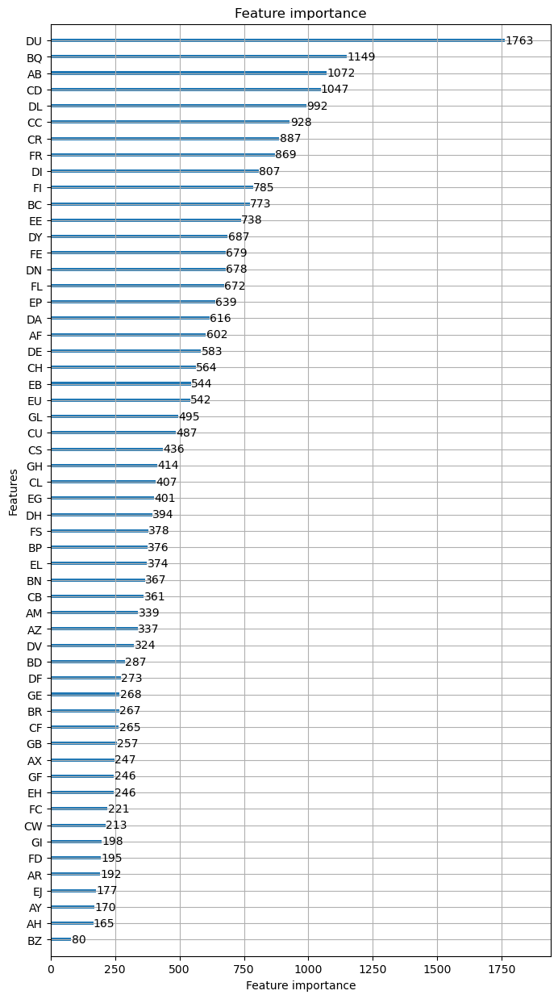

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.501107
[200]	valid_0's balanced_logloss: 0.411143
[300]	valid_0's balanced_logloss: 0.35986
[400]	valid_0's balanced_logloss: 0.338985
[500]	valid_0's balanced_logloss: 0.308462
[600]	valid_0's balanced_logloss: 0.292897
[700]	valid_0's balanced_logloss: 0.283856
[800]	valid_0's balanced_logloss: 0.282574
[900]	valid_0's balanced_logloss: 0.28061
[1000]	valid_0's balanced_logloss: 0.283002
[1100]	valid_0's balanced_logloss: 0.899299
[1200]	valid_0's balanced_logloss: 14.7915
[1300]	valid_0's balanced_logloss: 14.7915
[1400]	valid_0's balanced_logloss: 14.7915
[1500]	valid_0's balanced_logloss: 14.7915
[1600]	valid_0's balanced_logloss: 14.7915
[1700]	valid_0's balanced_logloss: 14.7915


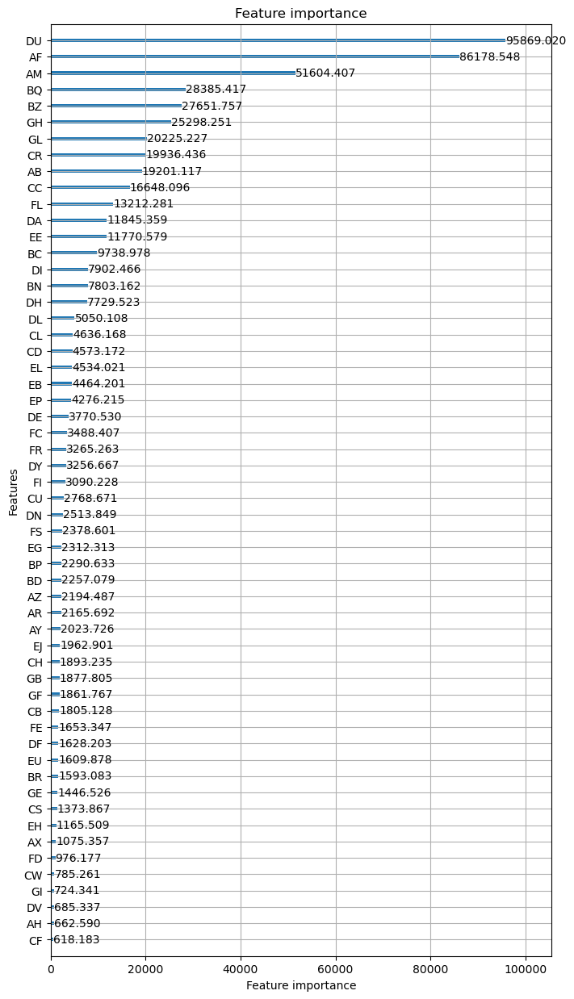

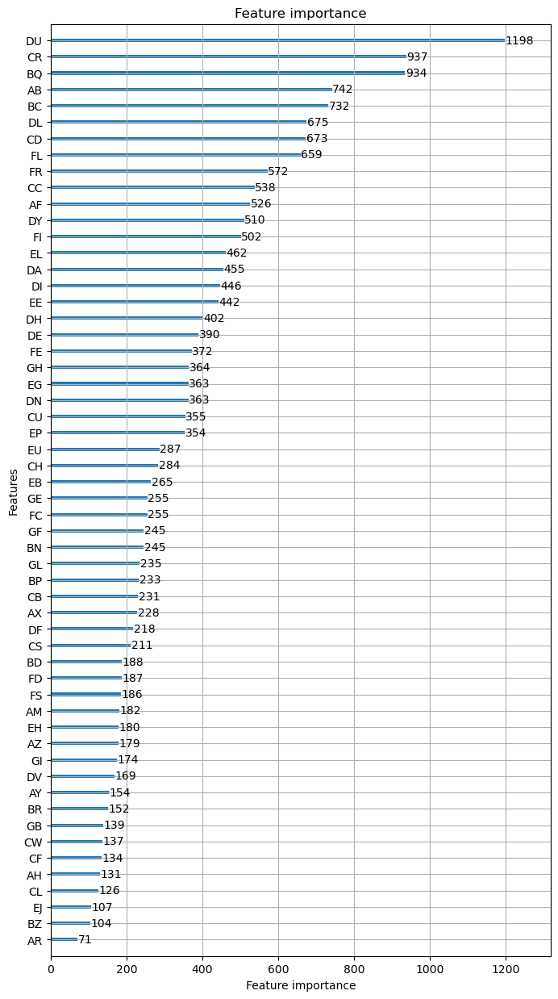

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.476847
[200]	valid_0's balanced_logloss: 0.369852
[300]	valid_0's balanced_logloss: 0.303086
[400]	valid_0's balanced_logloss: 0.646822
[500]	valid_0's balanced_logloss: 0.610994
[600]	valid_0's balanced_logloss: 0.57711
[700]	valid_0's balanced_logloss: 0.56967
[800]	valid_0's balanced_logloss: 0.558933
[900]	valid_0's balanced_logloss: 0.551025
[1000]	valid_0's balanced_logloss: 0.562189
[1100]	valid_0's balanced_logloss: 0.569755
[1200]	valid_0's balanced_logloss: 0.242767
[1300]	valid_0's balanced_logloss: 0.230804
[1400]	valid_0's balanced_logloss: 11.5131
[1500]	valid_0's balanced_logloss: 14.1011
[1600]	valid_0's balanced_logloss: 14.1011
[1700]	valid_0's balanced_logloss: 14.4396


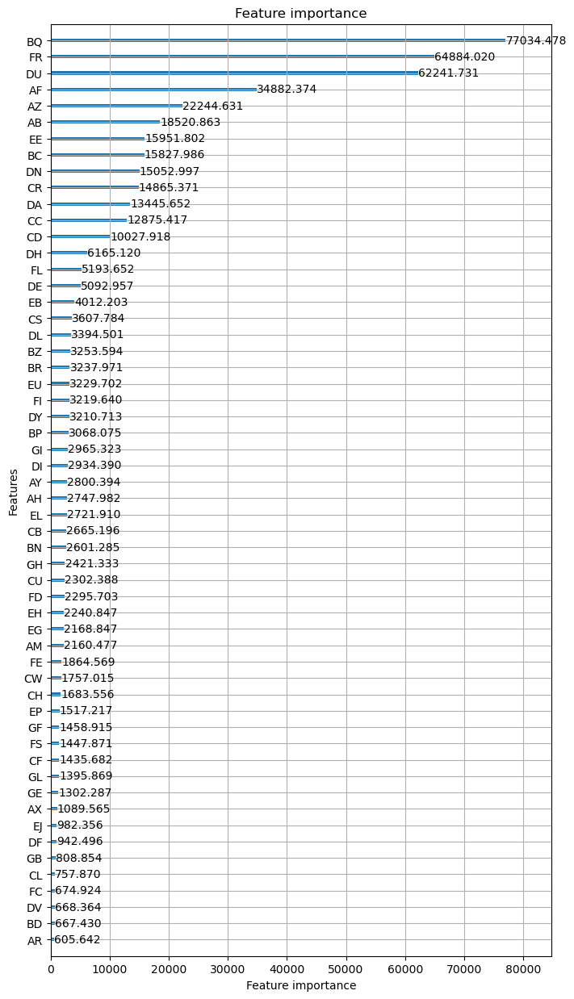

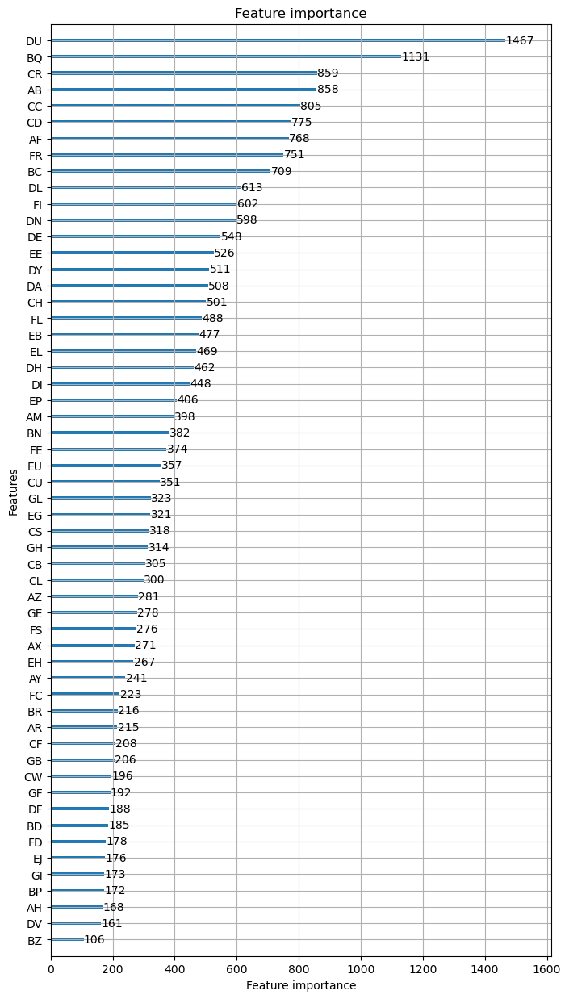

REPEAT NUMBER: 8/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.508096
[200]	valid_0's balanced_logloss: 0.422741
[300]	valid_0's balanced_logloss: 0.386637
[400]	valid_0's balanced_logloss: 0.368435
[500]	valid_0's balanced_logloss: 0.356286
[600]	valid_0's balanced_logloss: 0.355914
[700]	valid_0's balanced_logloss: 0.354413
[800]	valid_0's balanced_logloss: 0.352488
[900]	valid_0's balanced_logloss: 0.357451
[1000]	valid_0's balanced_logloss: 0.366585
[1100]	valid_0's balanced_logloss: 0.375327
[1200]	valid_0's balanced_logloss: 0.380358
[1300]	valid_0's balanced_logloss: 0.386604
[1400]	valid_0's balanced_logloss: 0.385473
[1500]	valid_0's balanced_logloss: 0.391347
[1600]	valid_0's balanced_logloss: 0.402392
[1700]	valid_0's balanced_logloss: 0.40747


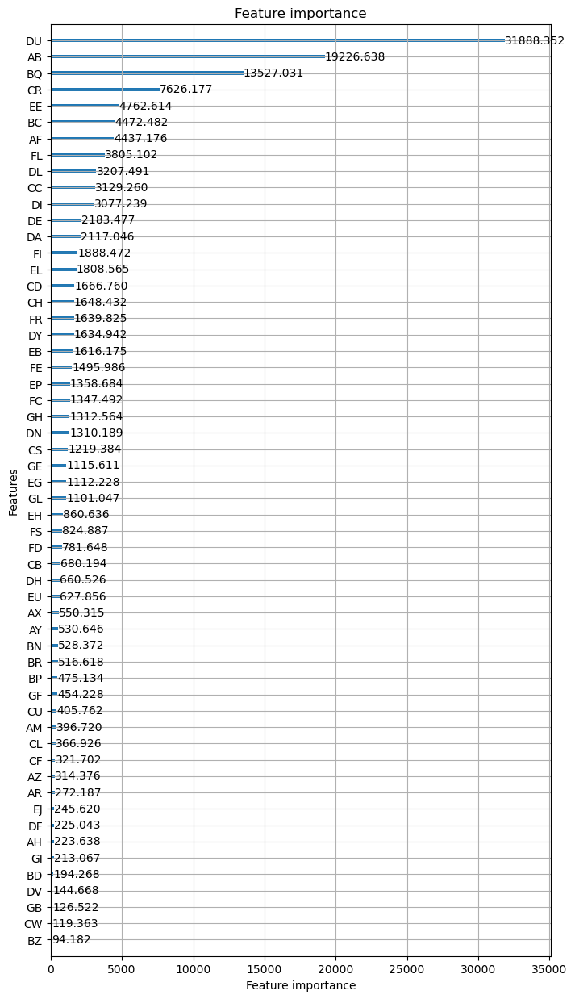

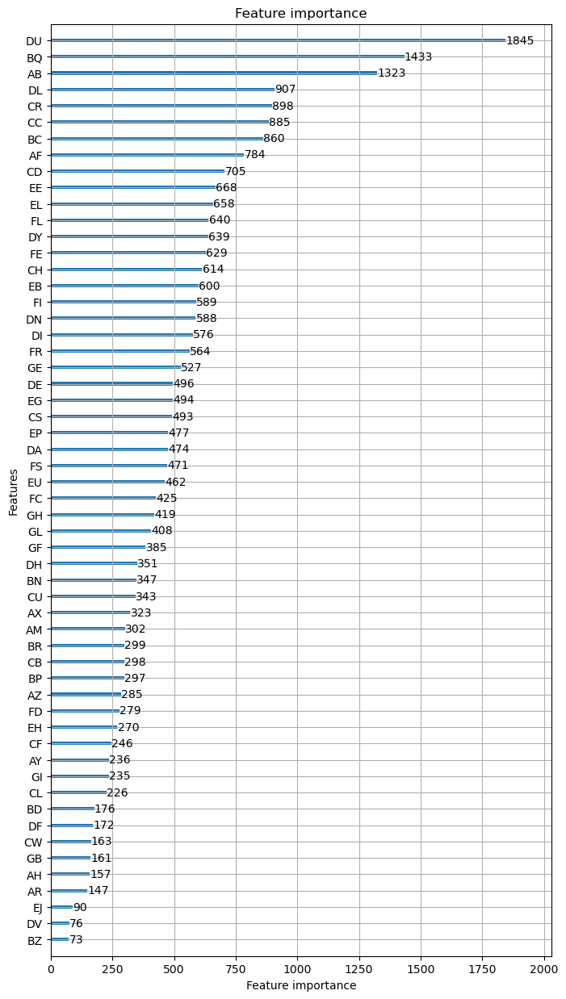

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.486463
[200]	valid_0's balanced_logloss: 0.384489
[300]	valid_0's balanced_logloss: 0.320382
[400]	valid_0's balanced_logloss: 0.280114
[500]	valid_0's balanced_logloss: 0.257507
[600]	valid_0's balanced_logloss: 0.245069
[700]	valid_0's balanced_logloss: 0.234564
[800]	valid_0's balanced_logloss: 0.232762
[900]	valid_0's balanced_logloss: 0.230769
[1000]	valid_0's balanced_logloss: 0.230903
[1100]	valid_0's balanced_logloss: 0.236707
[1200]	valid_0's balanced_logloss: 0.239181
[1300]	valid_0's balanced_logloss: 0.242764
[1400]	valid_0's balanced_logloss: 0.24407
[1500]	valid_0's balanced_logloss: 0.245105
[1600]	valid_0's balanced_logloss: 0.247257
[1700]	valid_0's balanced_logloss: 0.253144


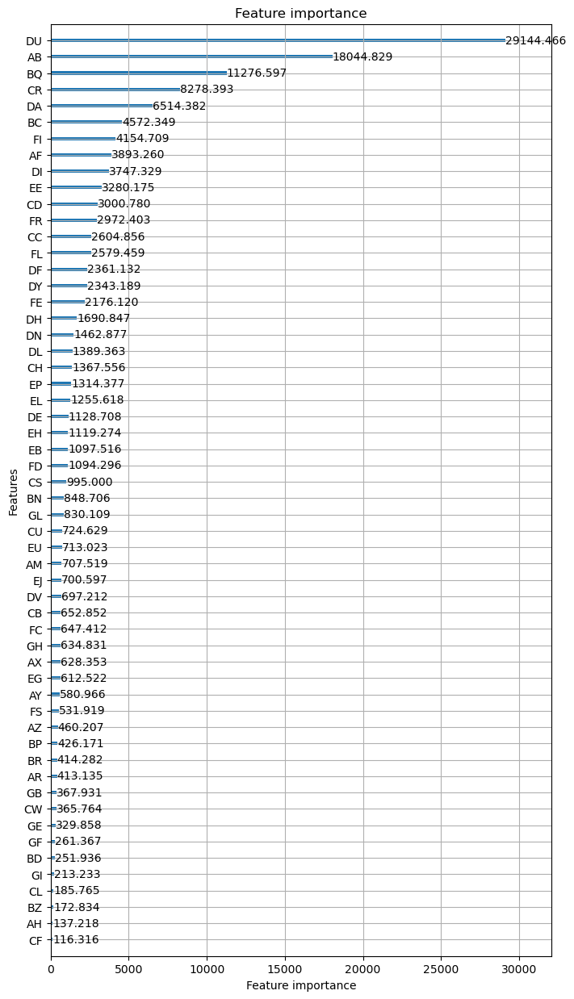

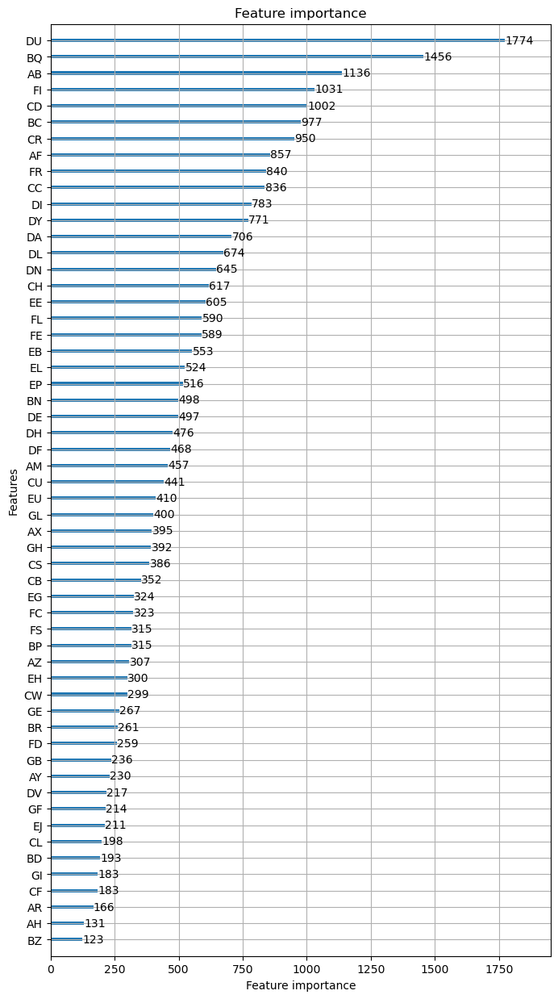

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.480055
[200]	valid_0's balanced_logloss: 0.384553
[300]	valid_0's balanced_logloss: 0.343512
[400]	valid_0's balanced_logloss: 0.318289
[500]	valid_0's balanced_logloss: 0.307229
[600]	valid_0's balanced_logloss: 0.298801
[700]	valid_0's balanced_logloss: 0.297524
[800]	valid_0's balanced_logloss: 0.298691
[900]	valid_0's balanced_logloss: 0.303794
[1000]	valid_0's balanced_logloss: 0.308289
[1100]	valid_0's balanced_logloss: 0.315156
[1200]	valid_0's balanced_logloss: 0.323027
[1300]	valid_0's balanced_logloss: 0.331693
[1400]	valid_0's balanced_logloss: 0.33994
[1500]	valid_0's balanced_logloss: 0.348335
[1600]	valid_0's balanced_logloss: 0.358869
[1700]	valid_0's balanced_logloss: 0.372536


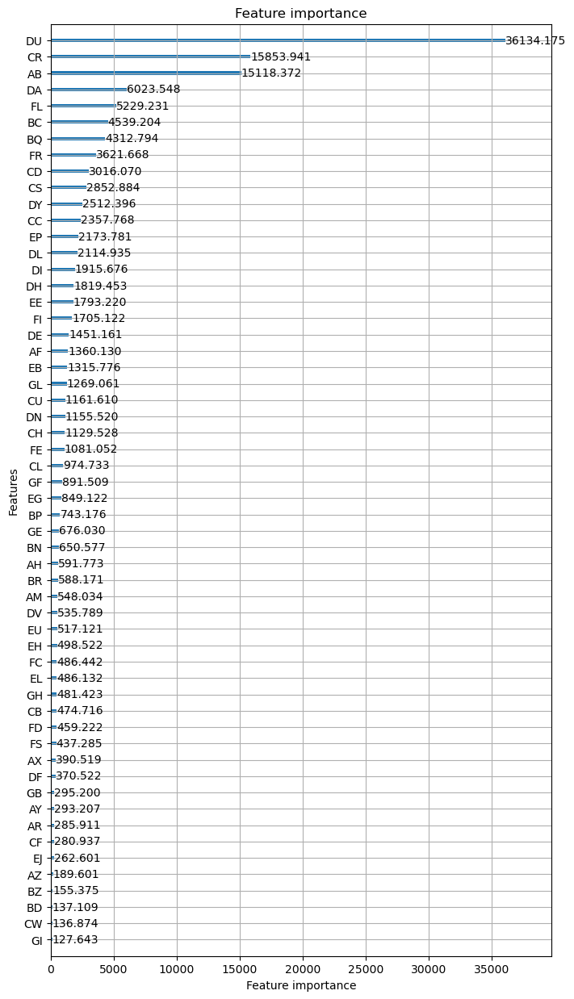

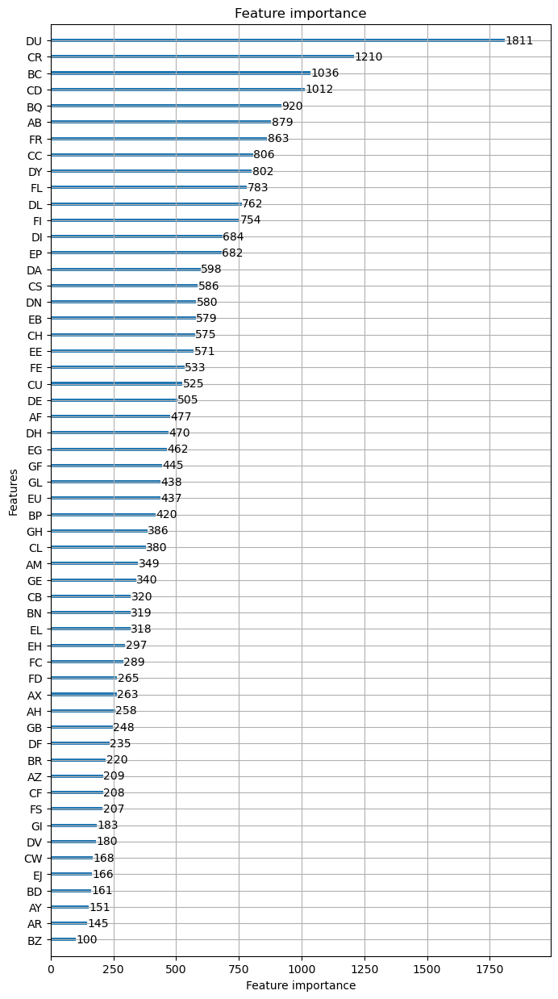

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.50045
[200]	valid_0's balanced_logloss: 0.41079
[300]	valid_0's balanced_logloss: 0.355587
[400]	valid_0's balanced_logloss: 0.318621
[500]	valid_0's balanced_logloss: 0.283302
[600]	valid_0's balanced_logloss: 0.272211
[700]	valid_0's balanced_logloss: 0.265455
[800]	valid_0's balanced_logloss: 0.260648
[900]	valid_0's balanced_logloss: 0.261915
[1000]	valid_0's balanced_logloss: 0.263536
[1100]	valid_0's balanced_logloss: 0.261212
[1200]	valid_0's balanced_logloss: 0.26269
[1300]	valid_0's balanced_logloss: 0.258486
[1400]	valid_0's balanced_logloss: 0.257077
[1500]	valid_0's balanced_logloss: 0.260685
[1600]	valid_0's balanced_logloss: 0.261695
[1700]	valid_0's balanced_logloss: 0.260437


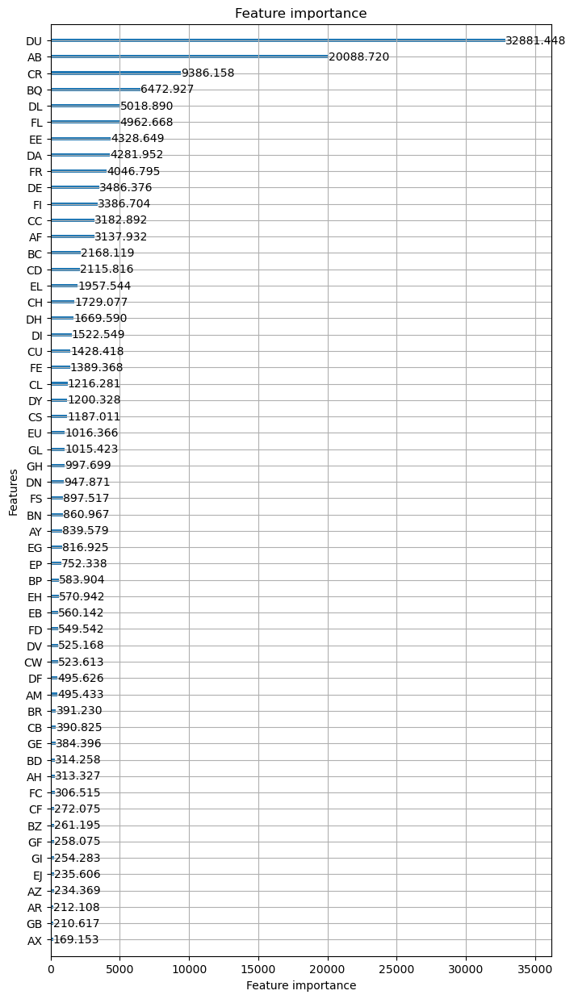

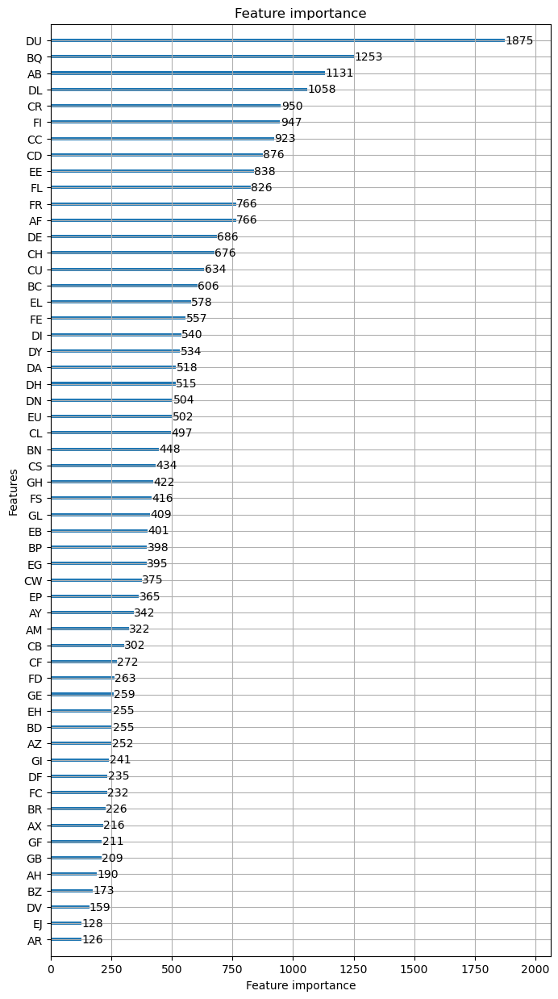

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.459595
[200]	valid_0's balanced_logloss: 0.350941
[300]	valid_0's balanced_logloss: 0.296088
[400]	valid_0's balanced_logloss: 0.255279
[500]	valid_0's balanced_logloss: 0.231141
[600]	valid_0's balanced_logloss: 0.213357
[700]	valid_0's balanced_logloss: 0.202804
[800]	valid_0's balanced_logloss: 0.192371
[900]	valid_0's balanced_logloss: 0.191265
[1000]	valid_0's balanced_logloss: 0.188665
[1100]	valid_0's balanced_logloss: 0.18633
[1200]	valid_0's balanced_logloss: 0.184655
[1300]	valid_0's balanced_logloss: 0.256083
[1400]	valid_0's balanced_logloss: 0.258348
[1500]	valid_0's balanced_logloss: 0.259028
[1600]	valid_0's balanced_logloss: 0.254637
[1700]	valid_0's balanced_logloss: 0.640169


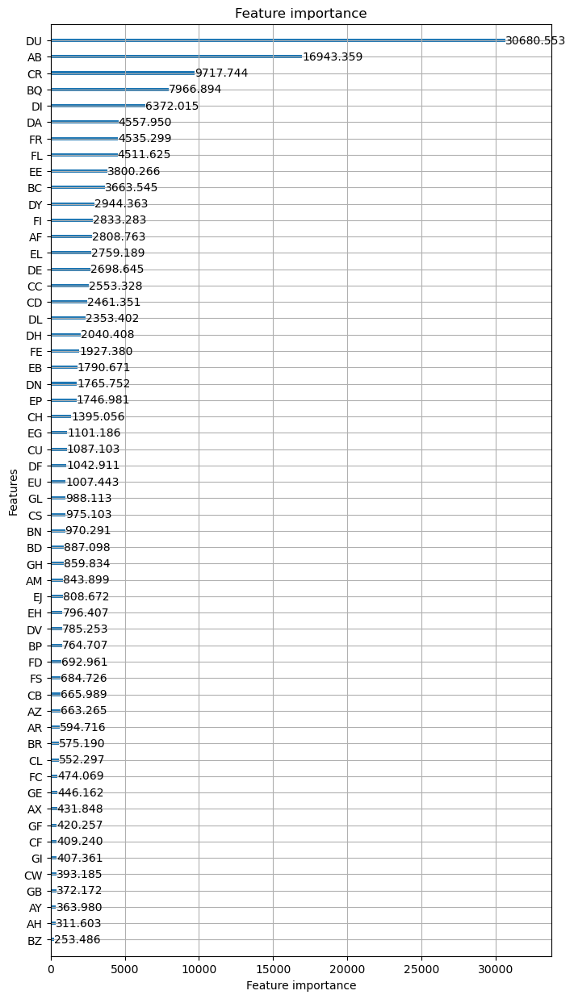

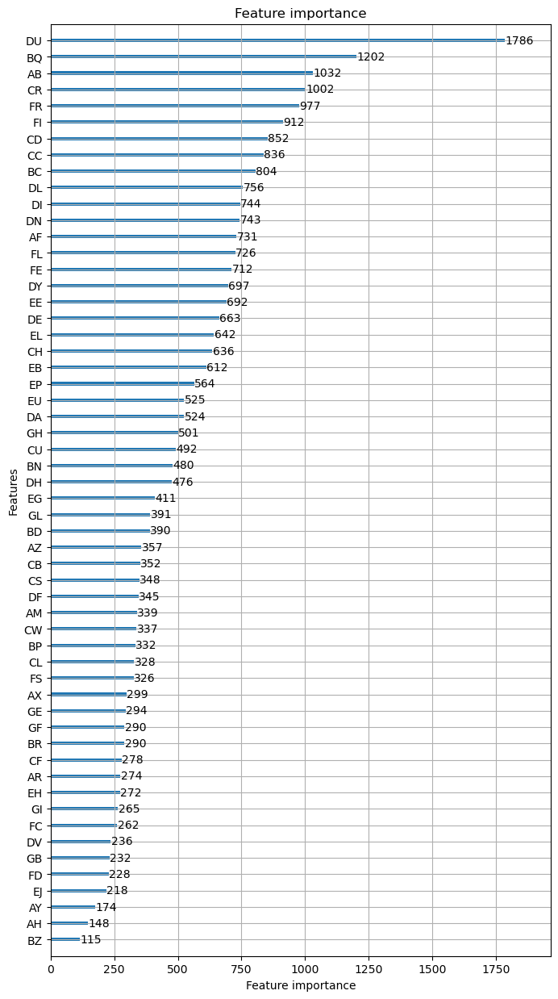

REPEAT NUMBER: 9/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.471741
[200]	valid_0's balanced_logloss: 0.368792
[300]	valid_0's balanced_logloss: 0.302966
[400]	valid_0's balanced_logloss: 0.263018
[500]	valid_0's balanced_logloss: 0.236959
[600]	valid_0's balanced_logloss: 0.217378
[700]	valid_0's balanced_logloss: 0.204301
[800]	valid_0's balanced_logloss: 0.194665
[900]	valid_0's balanced_logloss: 0.186644
[1000]	valid_0's balanced_logloss: 0.181698
[1100]	valid_0's balanced_logloss: 0.178388
[1200]	valid_0's balanced_logloss: 0.177091
[1300]	valid_0's balanced_logloss: 0.177348
[1400]	valid_0's balanced_logloss: 0.175459
[1500]	valid_0's balanced_logloss: 0.174772
[1600]	valid_0's balanced_logloss: 0.178373
[1700]	valid_0's balanced_logloss: 0.173382


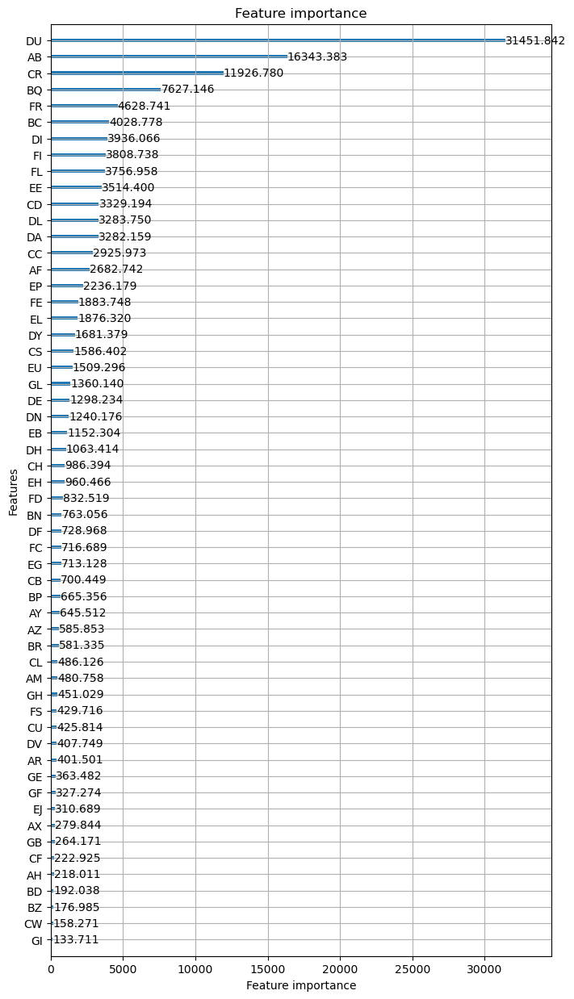

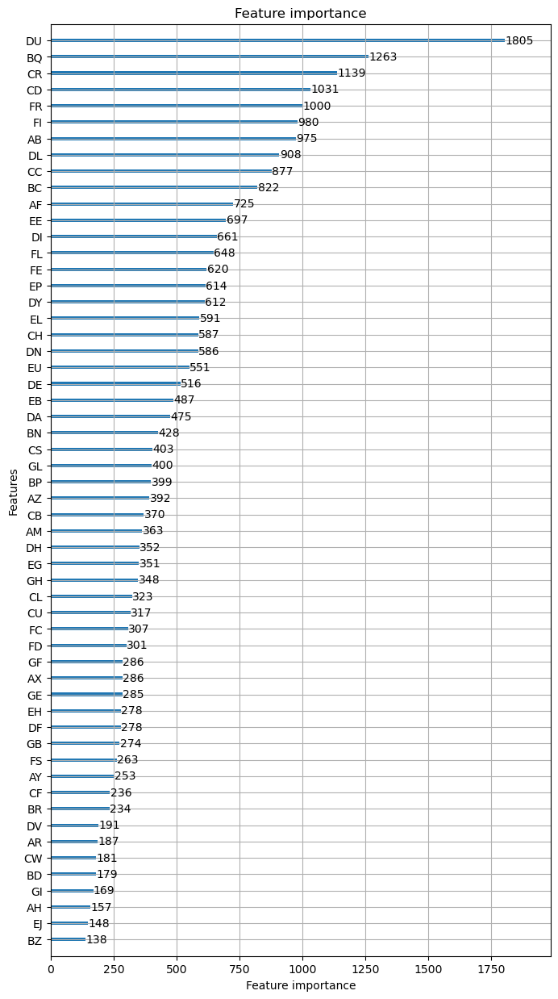

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.468798
[200]	valid_0's balanced_logloss: 0.339548
[300]	valid_0's balanced_logloss: 0.268001
[400]	valid_0's balanced_logloss: 0.222627
[500]	valid_0's balanced_logloss: 0.189748
[600]	valid_0's balanced_logloss: 0.168242
[700]	valid_0's balanced_logloss: 0.154797
[800]	valid_0's balanced_logloss: 0.145943
[900]	valid_0's balanced_logloss: 0.135433
[1000]	valid_0's balanced_logloss: 0.128176
[1100]	valid_0's balanced_logloss: 0.12103
[1200]	valid_0's balanced_logloss: 0.115372
[1300]	valid_0's balanced_logloss: 0.109771
[1400]	valid_0's balanced_logloss: 0.110135
[1500]	valid_0's balanced_logloss: 0.117864
[1600]	valid_0's balanced_logloss: 0.115408
[1700]	valid_0's balanced_logloss: 0.146754


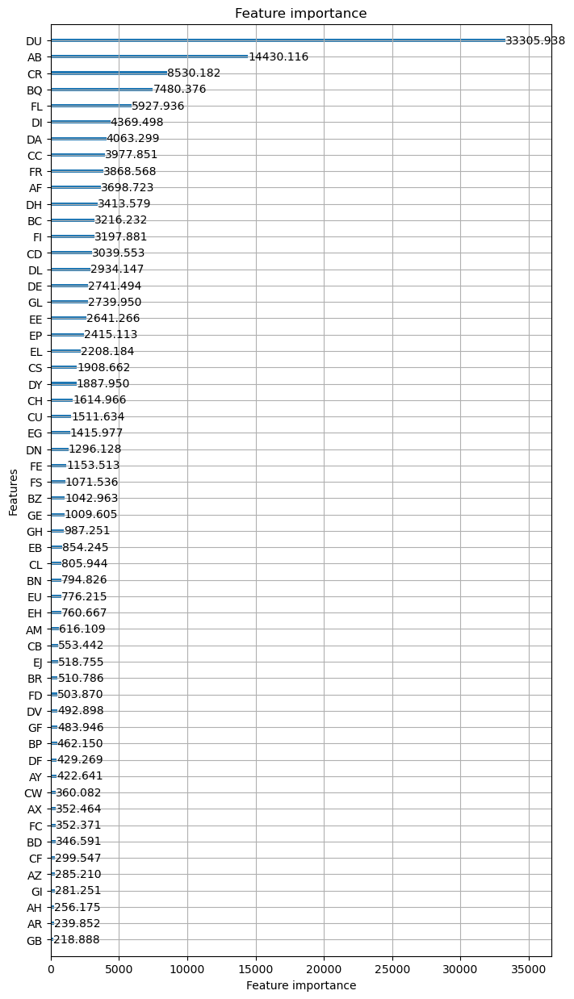

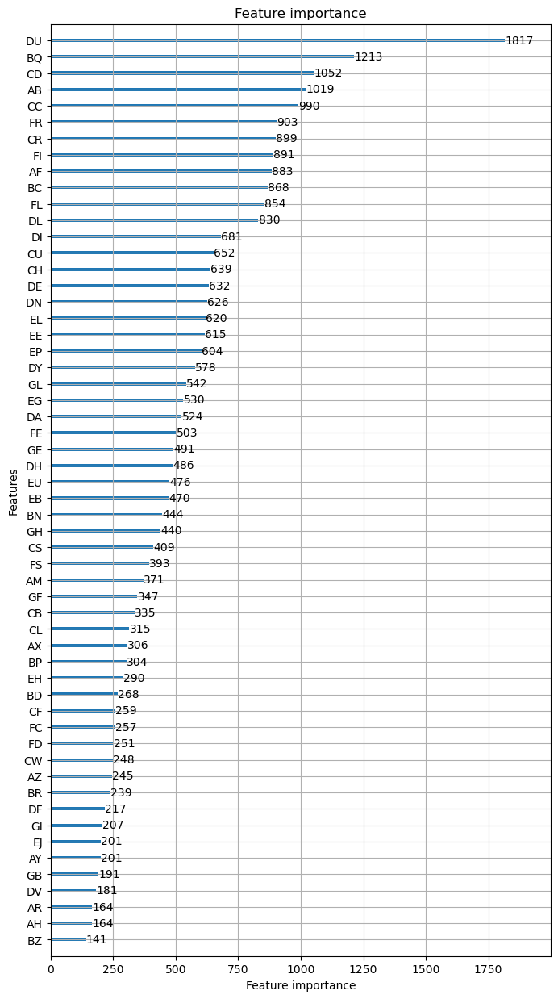

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.510447
[200]	valid_0's balanced_logloss: 0.417683
[300]	valid_0's balanced_logloss: 0.366312
[400]	valid_0's balanced_logloss: 0.335711
[500]	valid_0's balanced_logloss: 0.320236
[600]	valid_0's balanced_logloss: 0.312263
[700]	valid_0's balanced_logloss: 0.30754
[800]	valid_0's balanced_logloss: 0.30764
[900]	valid_0's balanced_logloss: 0.311445
[1000]	valid_0's balanced_logloss: 0.319944
[1100]	valid_0's balanced_logloss: 0.328154
[1200]	valid_0's balanced_logloss: 0.337021
[1300]	valid_0's balanced_logloss: 0.357501
[1400]	valid_0's balanced_logloss: 0.412529
[1500]	valid_0's balanced_logloss: 0.448638
[1600]	valid_0's balanced_logloss: 0.472507
[1700]	valid_0's balanced_logloss: 0.506347


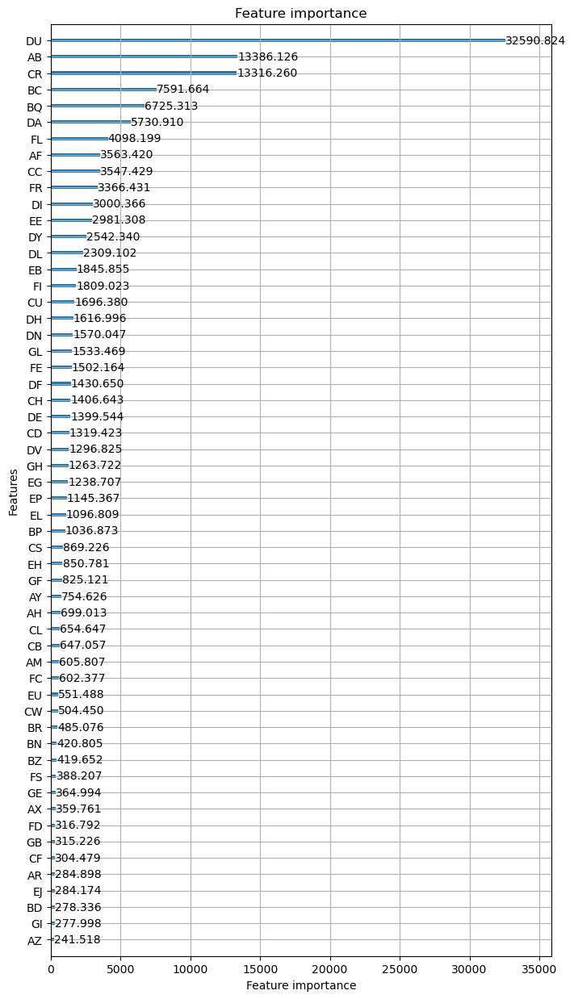

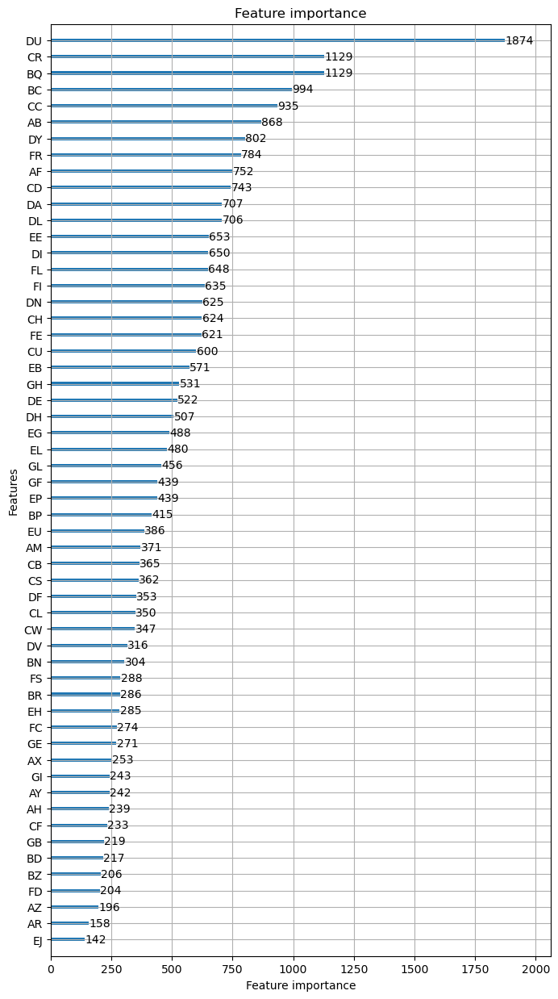

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.509042
[200]	valid_0's balanced_logloss: 0.420533
[300]	valid_0's balanced_logloss: 0.374314
[400]	valid_0's balanced_logloss: 0.345844
[500]	valid_0's balanced_logloss: 0.330279
[600]	valid_0's balanced_logloss: 0.326933
[700]	valid_0's balanced_logloss: 0.308253
[800]	valid_0's balanced_logloss: 0.299774
[900]	valid_0's balanced_logloss: 0.279054
[1000]	valid_0's balanced_logloss: 0.281817
[1100]	valid_0's balanced_logloss: 0.281901
[1200]	valid_0's balanced_logloss: 0.284515
[1300]	valid_0's balanced_logloss: 0.291085
[1400]	valid_0's balanced_logloss: 0.300691
[1500]	valid_0's balanced_logloss: 0.304141
[1600]	valid_0's balanced_logloss: 0.308349
[1700]	valid_0's balanced_logloss: 0.317857


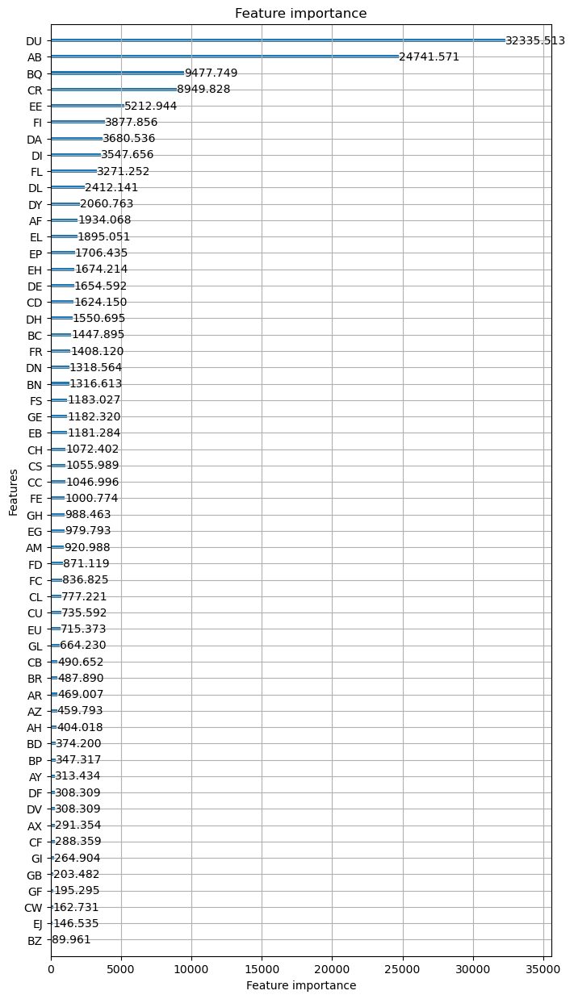

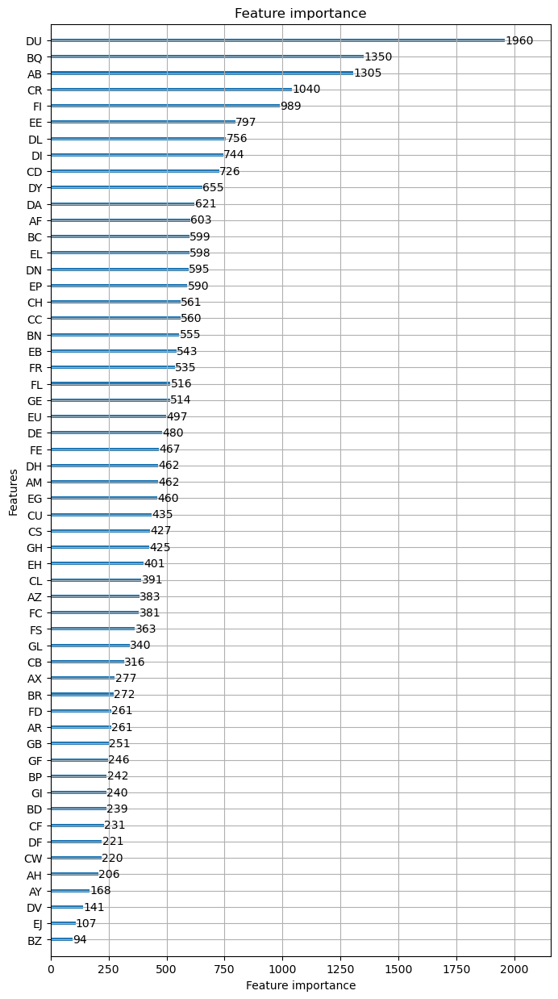

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.488575
[200]	valid_0's balanced_logloss: 0.40694
[300]	valid_0's balanced_logloss: 0.353146
[400]	valid_0's balanced_logloss: 0.323755
[500]	valid_0's balanced_logloss: 0.306096
[600]	valid_0's balanced_logloss: 0.289566
[700]	valid_0's balanced_logloss: 0.278706
[800]	valid_0's balanced_logloss: 0.27415
[900]	valid_0's balanced_logloss: 0.275715
[1000]	valid_0's balanced_logloss: 0.281266
[1100]	valid_0's balanced_logloss: 0.279954
[1200]	valid_0's balanced_logloss: 0.284016
[1300]	valid_0's balanced_logloss: 0.28679
[1400]	valid_0's balanced_logloss: 0.287566
[1500]	valid_0's balanced_logloss: 0.290191
[1600]	valid_0's balanced_logloss: 0.290975
[1700]	valid_0's balanced_logloss: 0.293502


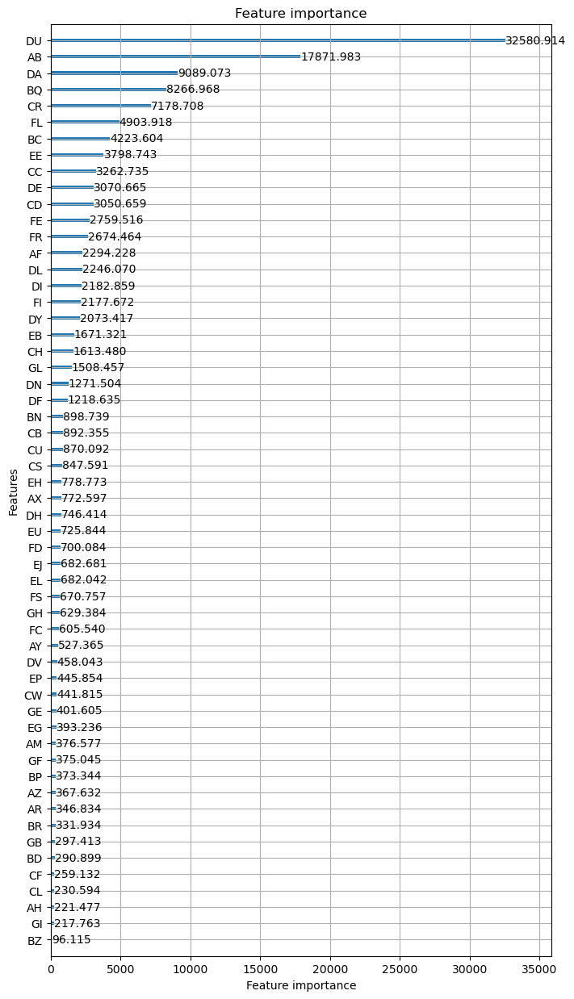

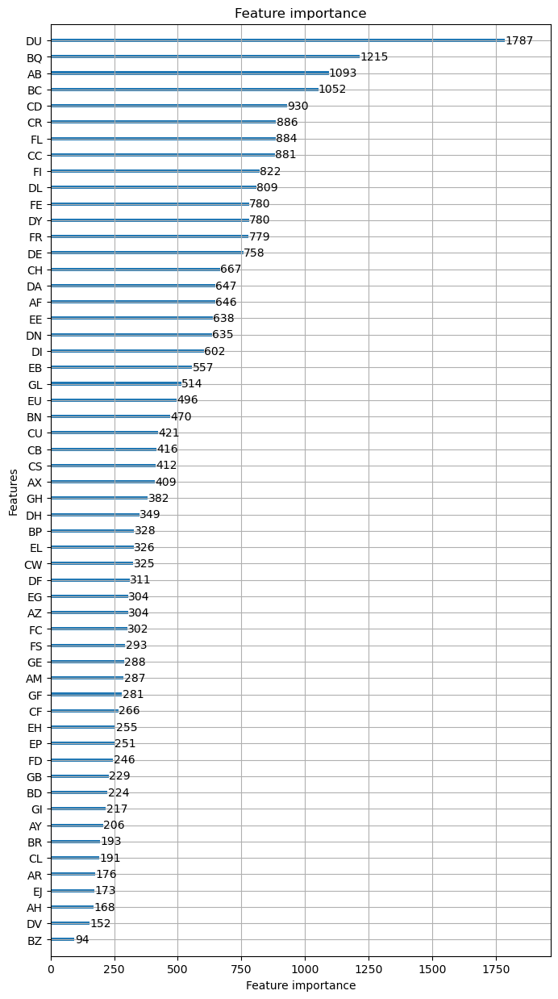

REPEAT NUMBER: 10/10
training model for fold: 1/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.465494
[200]	valid_0's balanced_logloss: 0.347641
[300]	valid_0's balanced_logloss: 0.277783
[400]	valid_0's balanced_logloss: 0.236588
[500]	valid_0's balanced_logloss: 0.202235
[600]	valid_0's balanced_logloss: 0.177833
[700]	valid_0's balanced_logloss: 0.16334
[800]	valid_0's balanced_logloss: 0.150813
[900]	valid_0's balanced_logloss: 0.209326
[1000]	valid_0's balanced_logloss: 0.16614
[1100]	valid_0's balanced_logloss: 0.15751
[1200]	valid_0's balanced_logloss: 0.144303
[1300]	valid_0's balanced_logloss: 0.139595
[1400]	valid_0's balanced_logloss: 0.128719
[1500]	valid_0's balanced_logloss: 0.121928
[1600]	valid_0's balanced_logloss: 0.114982
[1700]	valid_0's balanced_logloss: 0.115423


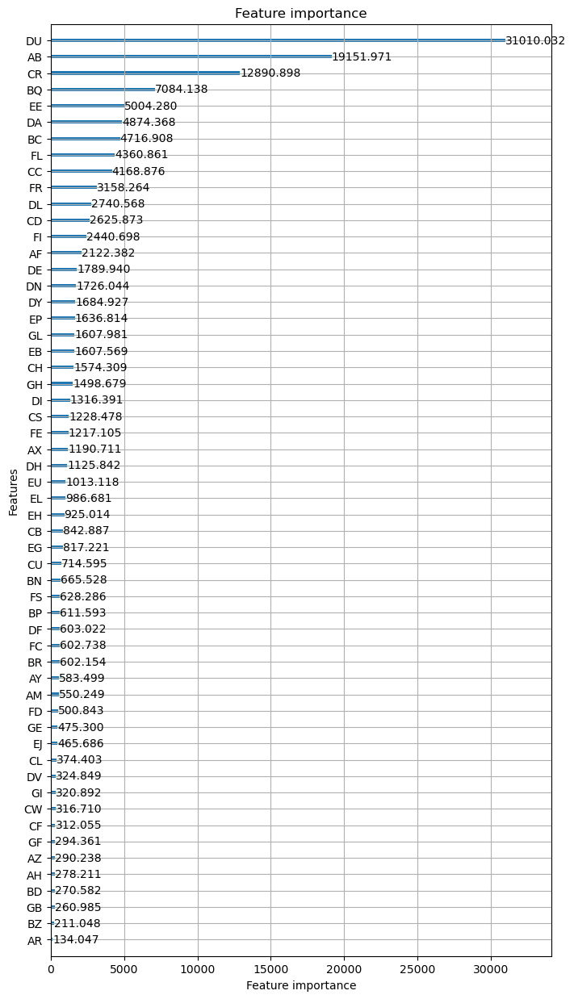

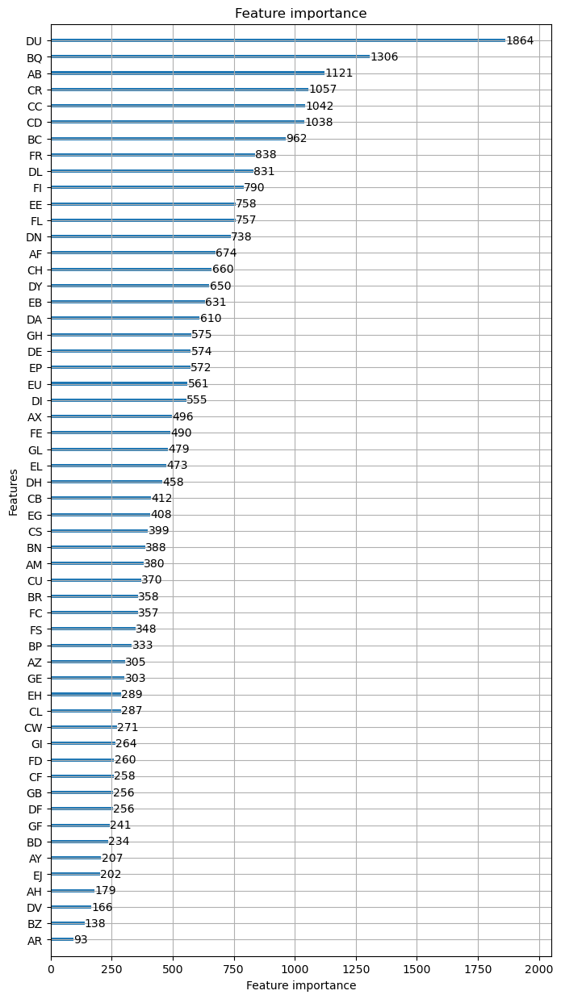

training model for fold: 2/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.504592
[200]	valid_0's balanced_logloss: 0.411101
[300]	valid_0's balanced_logloss: 0.356847
[400]	valid_0's balanced_logloss: 0.333123
[500]	valid_0's balanced_logloss: 0.326282
[600]	valid_0's balanced_logloss: 0.325944
[700]	valid_0's balanced_logloss: 0.330445
[800]	valid_0's balanced_logloss: 0.338387
[900]	valid_0's balanced_logloss: 0.350762
[1000]	valid_0's balanced_logloss: 0.361811
[1100]	valid_0's balanced_logloss: 0.370627
[1200]	valid_0's balanced_logloss: 0.383371
[1300]	valid_0's balanced_logloss: 0.395791
[1400]	valid_0's balanced_logloss: 0.41238
[1500]	valid_0's balanced_logloss: 0.423386
[1600]	valid_0's balanced_logloss: 0.442202
[1700]	valid_0's balanced_logloss: 0.45769


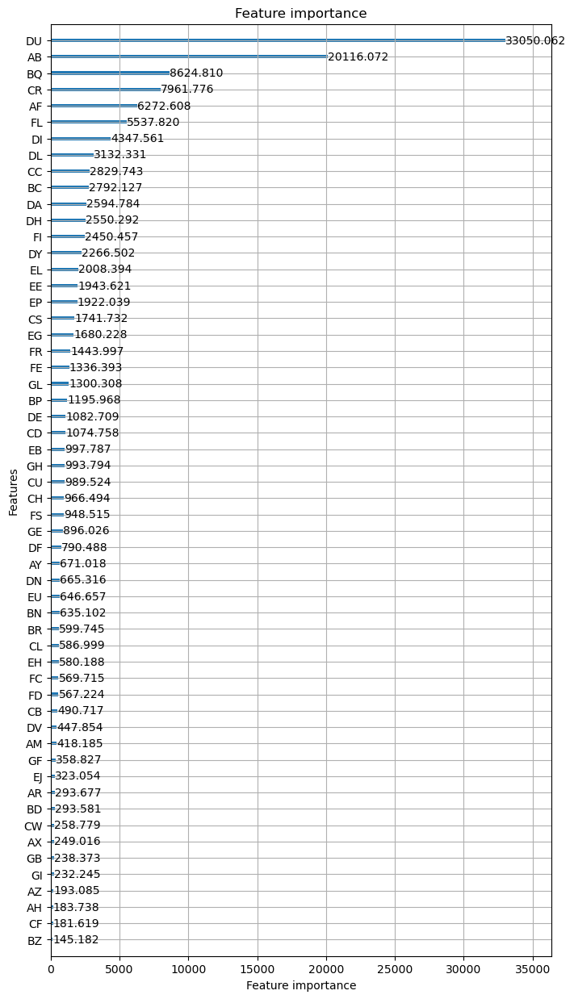

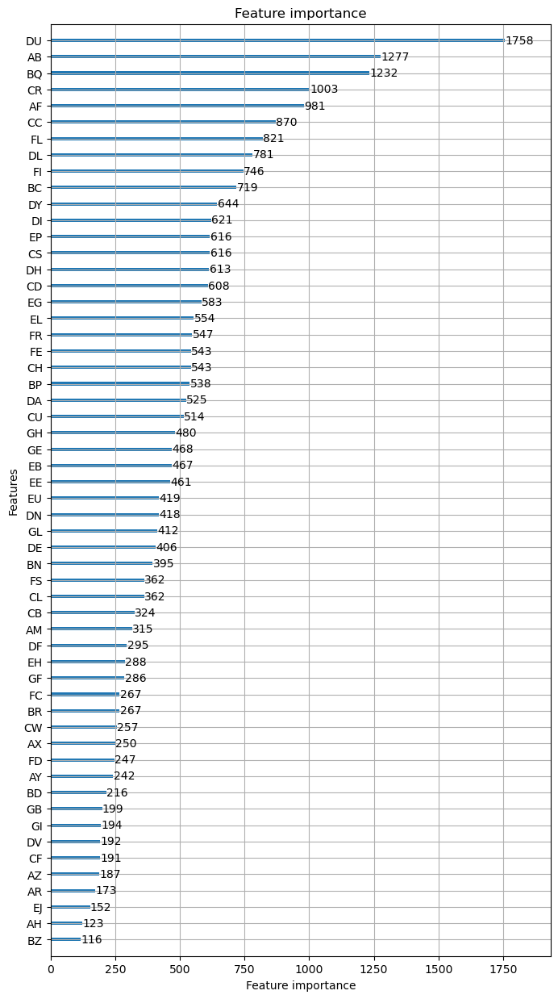

training model for fold: 3/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.483443
[200]	valid_0's balanced_logloss: 0.383369
[300]	valid_0's balanced_logloss: 0.323997
[400]	valid_0's balanced_logloss: 0.286828
[500]	valid_0's balanced_logloss: 0.26125
[600]	valid_0's balanced_logloss: 0.246663
[700]	valid_0's balanced_logloss: 0.242333
[800]	valid_0's balanced_logloss: 0.240067
[900]	valid_0's balanced_logloss: 0.237734
[1000]	valid_0's balanced_logloss: 0.24072
[1100]	valid_0's balanced_logloss: 0.237878
[1200]	valid_0's balanced_logloss: 0.24129
[1300]	valid_0's balanced_logloss: 0.246033
[1400]	valid_0's balanced_logloss: 0.250459
[1500]	valid_0's balanced_logloss: 0.254278
[1600]	valid_0's balanced_logloss: 0.260211
[1700]	valid_0's balanced_logloss: 0.265399


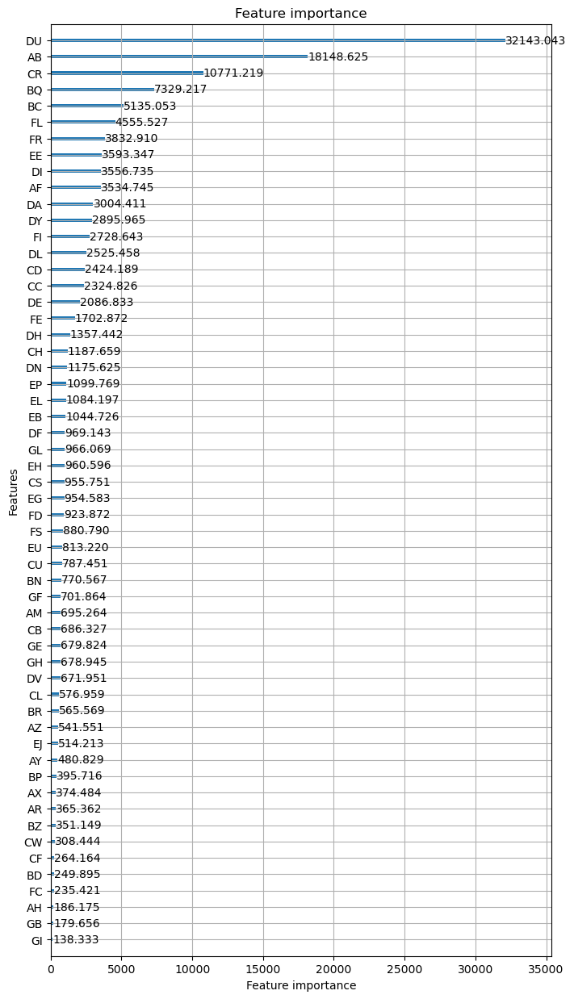

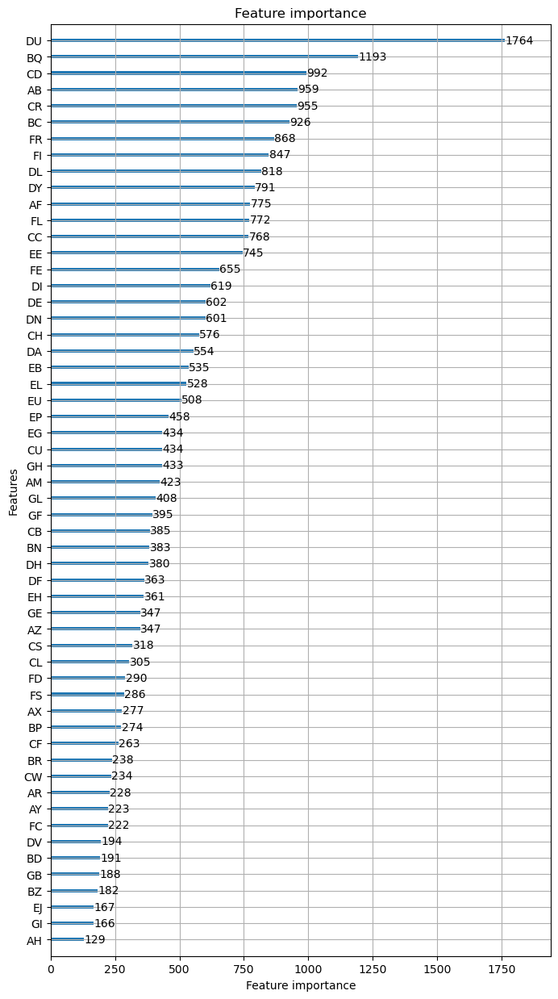

training model for fold: 4/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.518435
[200]	valid_0's balanced_logloss: 0.442486
[300]	valid_0's balanced_logloss: 0.393055
[400]	valid_0's balanced_logloss: 0.365343
[500]	valid_0's balanced_logloss: 0.364272
[600]	valid_0's balanced_logloss: 0.351575
[700]	valid_0's balanced_logloss: 0.343206
[800]	valid_0's balanced_logloss: 0.337291
[900]	valid_0's balanced_logloss: 0.334073
[1000]	valid_0's balanced_logloss: 0.345231
[1100]	valid_0's balanced_logloss: 0.344738
[1200]	valid_0's balanced_logloss: 0.347001
[1300]	valid_0's balanced_logloss: 0.345382
[1400]	valid_0's balanced_logloss: 0.342719
[1500]	valid_0's balanced_logloss: 0.33327
[1600]	valid_0's balanced_logloss: 0.329875
[1700]	valid_0's balanced_logloss: 0.333757


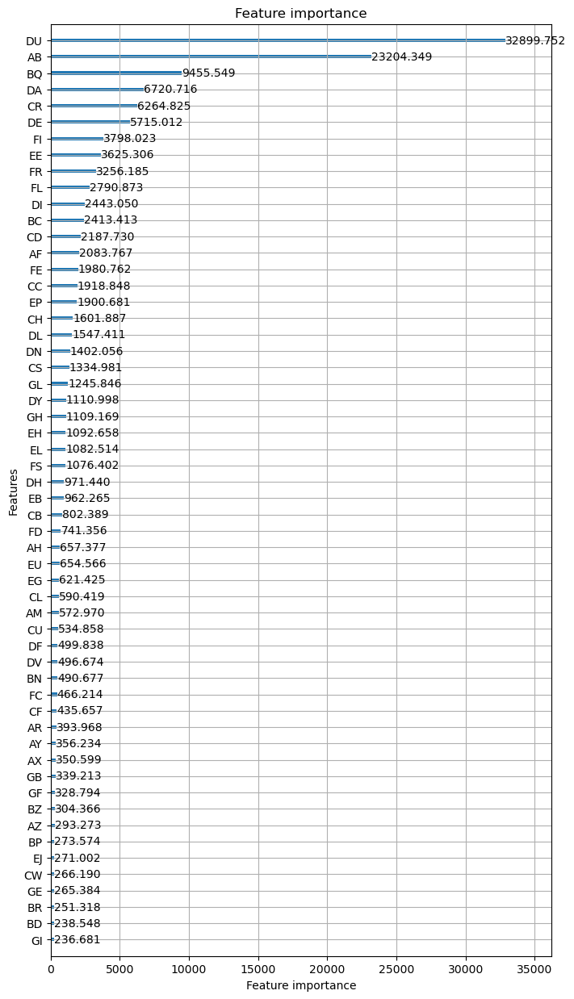

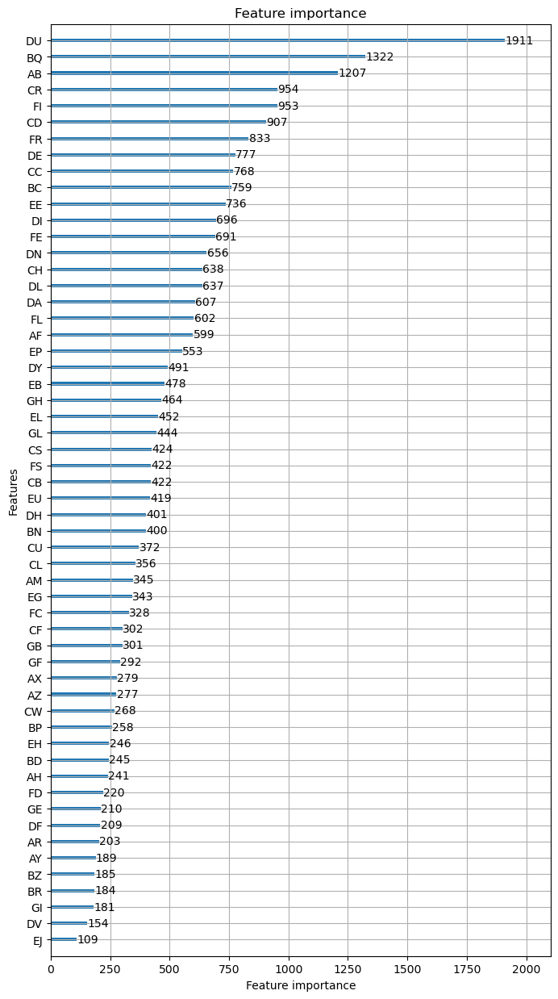

training model for fold: 5/5


/home/mavillan/mambaforge/envs/kg/lib/python3.10/site-packages/lightgbm/engine.py:177: UserWarning:

Found `num_iterations` in params. Will use it instead of argument



[100]	valid_0's balanced_logloss: 0.476127
[200]	valid_0's balanced_logloss: 0.380758
[300]	valid_0's balanced_logloss: 0.325216
[400]	valid_0's balanced_logloss: 0.293737
[500]	valid_0's balanced_logloss: 0.275008
[600]	valid_0's balanced_logloss: 0.264186
[700]	valid_0's balanced_logloss: 0.261509
[800]	valid_0's balanced_logloss: 0.259579
[900]	valid_0's balanced_logloss: 0.261716
[1000]	valid_0's balanced_logloss: 0.265
[1100]	valid_0's balanced_logloss: 0.268667
[1200]	valid_0's balanced_logloss: 0.27356
[1300]	valid_0's balanced_logloss: 0.28203
[1400]	valid_0's balanced_logloss: 0.288243
[1500]	valid_0's balanced_logloss: 0.295517
[1600]	valid_0's balanced_logloss: 0.301022
[1700]	valid_0's balanced_logloss: 0.307424


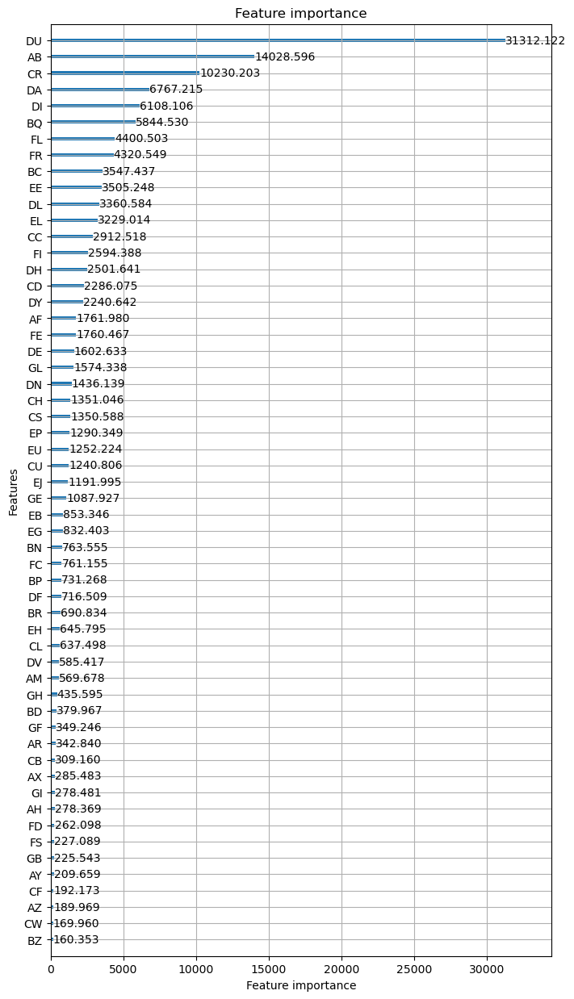

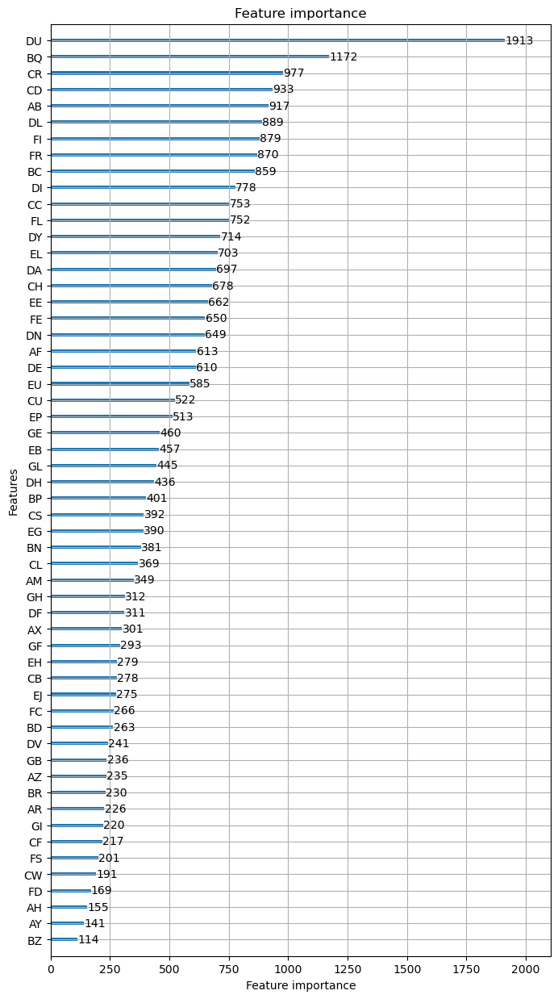

In [12]:
VERBOSE = True

models = list()
metrics = list()
oof_dfs = list()

for repeat in range(REPETITIONS):
    print(f"REPEAT NUMBER: {repeat+1}/{REPETITIONS}")
    cv_split = repeated_cv_split[f"repeat_{repeat}"]
    n_folds = len(cv_split)
    
    oof = train[["Id","Class"]].copy()
    oof["pred_proba"] = np.nan
    
    for split in cv_split:
        fold = split["fold"]
        train_idx = split["train_idx"]
        valid_idx = split["valid_idx"]
        print(f"training model for fold: {fold+1}/{n_folds}")
    
        train_df = train.loc[train_idx,:].reset_index(drop=True)
        valid_df = train.loc[valid_idx,:].reset_index(drop=True)

        train_df_mixup = mixup(
            train_df,
            input_cols,
            total_samples=100_000,
            alpha=0.25,
            pct_interclass=0,
        )
        
        train_dset = lgb.Dataset(
            #data=train_df.loc[:,input_cols],
            #label=train_df.loc[:,"Class"].values,
            data=train_df_mixup.loc[:,input_cols],
            label=train_df_mixup.loc[:,"Class"].values,
            free_raw_data=False,
            #init_score= train_df.Class.mean() * np.ones(len(train_df))
            #init_score=np.ones(len(train_df))
            #init_score=np.zeros(len(train_df))
        )
        valid_dset = lgb.Dataset(
            data=valid_df.loc[:,input_cols],
            label=valid_df.loc[:,"Class"].values,
            free_raw_data=False
        )
        model = lgb.train(
            params=model_params,
            train_set=train_dset,
            valid_sets=[valid_dset,],
            #num_boost_round=2000,
            feval=[balanced_logloss],
            callbacks=[lgb.log_evaluation(period=100),],
        )
        
        if VERBOSE:
            lgb.plot_importance(model, importance_type="gain", figsize=(8,15))
            plt.show()
            lgb.plot_importance(model, importance_type="split", figsize=(8,15))
            plt.show()
            
        y_pred = model.predict(valid_df.loc[:,input_cols])
        valid_loss = balanced_logloss_(y_pred, valid_df.loc[:,"Class"].values)
        oof.loc[valid_idx, "pred_proba"] = y_pred
        
        models.append(model)
        metrics.append(valid_loss)
        
    oof_dfs.append(oof)

# boost_from_average = False
# [1700]	valid_0's balanced_logloss: 0.350429

# boost_from_average = True
# [1700]	valid_0's balanced_logloss: 0.348503

# mean init_score
# [1700]	valid_0's balanced_logloss: 0.37599

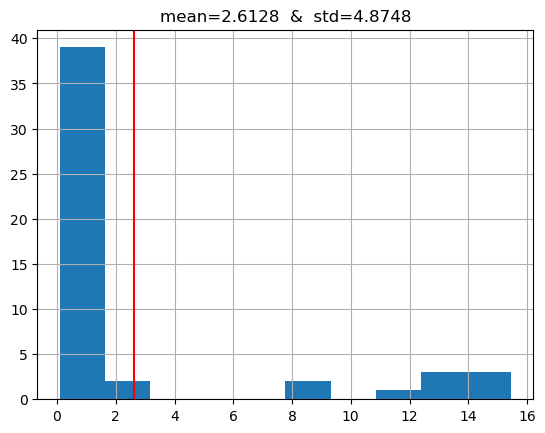

In [13]:
_metrics = metrics[:50]

metric_mean = np.mean(_metrics)
metric_median = np.median(_metrics)
metric_std = np.std(_metrics)

plt.hist(_metrics, bins=10)
plt.axvline(metric_mean, c="r")
plt.title(f"mean={metric_mean:0.4f}  &  std={metric_std:0.4f}")
plt.grid()
plt.show()

In [14]:
from functools import partial

def calibrate_probs(prob_class1, scale_factor):
    p0 = (1-prob_class1).copy()
    p1 = prob_class1.copy()
    p1 *= scale_factor
    normalized_p1 = p1 / (p0+p1)
    return normalized_p1

def calculate_overall_metric(
        oof_dfs:list, 
        factor:int
    ) -> float:
    
    all_metrics = list()
    for oof in oof_dfs:
        oof = oof.copy()

        p0 = 1 - oof.pred_proba.values.copy()
        p1 = oof.pred_proba.values.copy()
        p1 *= factor
        scaled_p1 = p1 / (p0+p1)
        oof["pred_proba"] = scaled_p1

        metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
        all_metrics.append(metric)
    
    return np.mean(all_metrics[1:])

out = minimize(partial(calculate_overall_metric, oof_dfs), x0=1)
display(out)

scale_factor = out.x[0]
display(scale_factor)

  message: Desired error not necessarily achieved due to precision loss.
  success: False
   status: 2
      fun: 2.805511665072263
        x: [ 6.098e+00]
      nit: 9
      jac: [-9.307e-05]
 hess_inv: [[ 6.538e+02]]
     nfev: 79
     njev: 37

6.0979943533531005

####################################################################################################
CV repeat nbr: 1 - metric: 0.2755


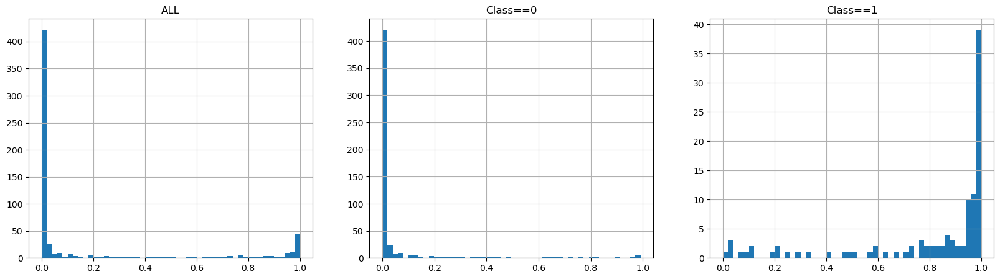

CV repeat nbr: 1 - metric: 0.2142


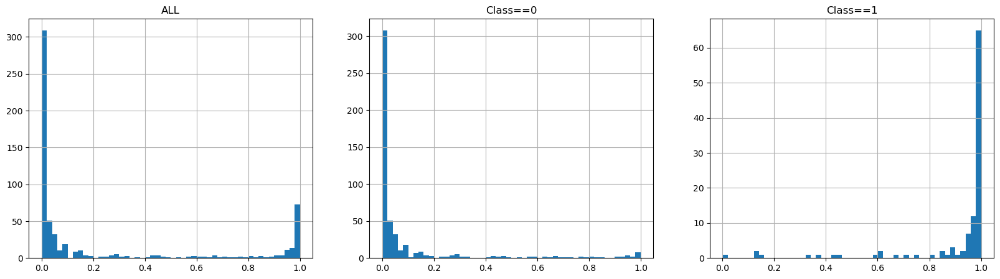

####################################################################################################
CV repeat nbr: 2 - metric: 0.2918


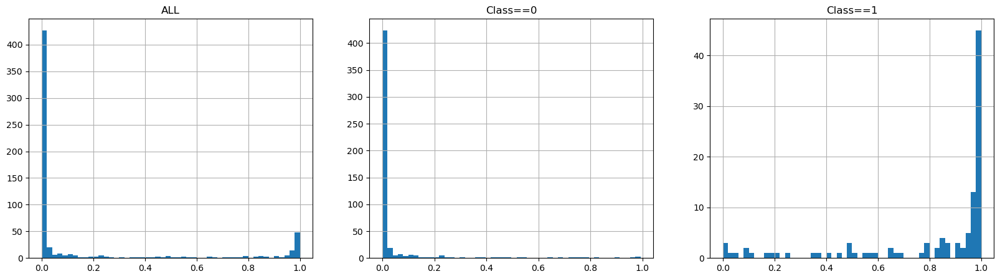

CV repeat nbr: 2 - metric: 0.2260


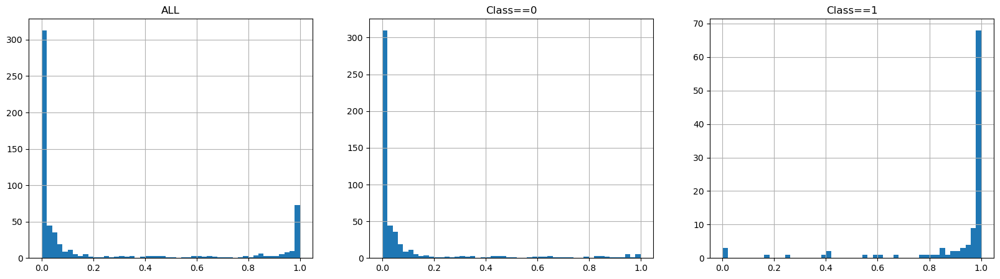

####################################################################################################
CV repeat nbr: 3 - metric: 4.7028


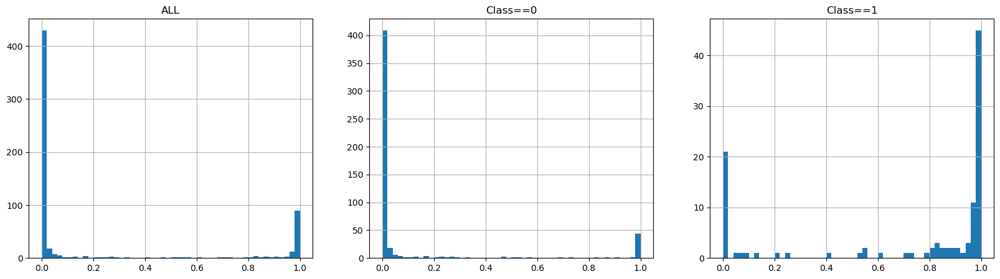

CV repeat nbr: 3 - metric: 4.6605


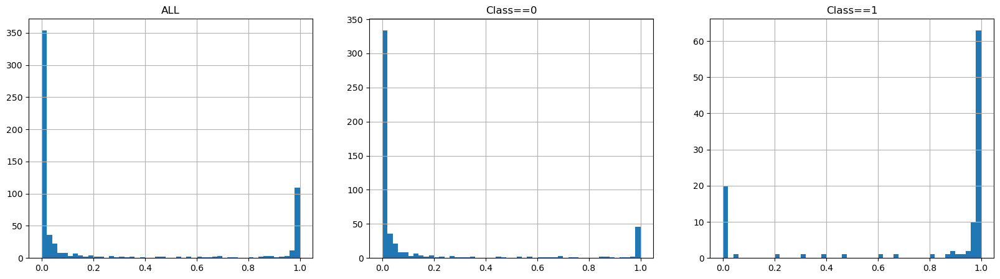

####################################################################################################
CV repeat nbr: 4 - metric: 5.1026


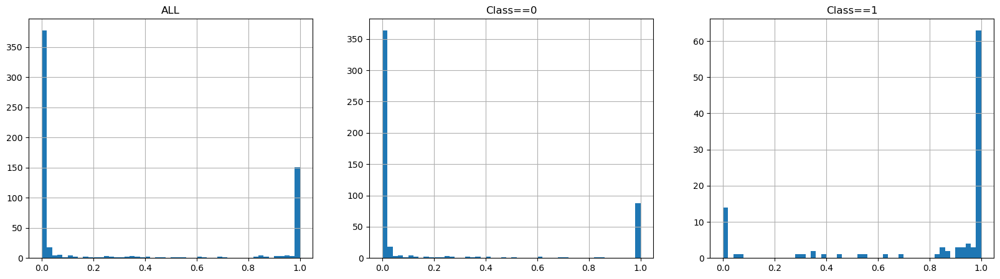

CV repeat nbr: 4 - metric: 5.0860


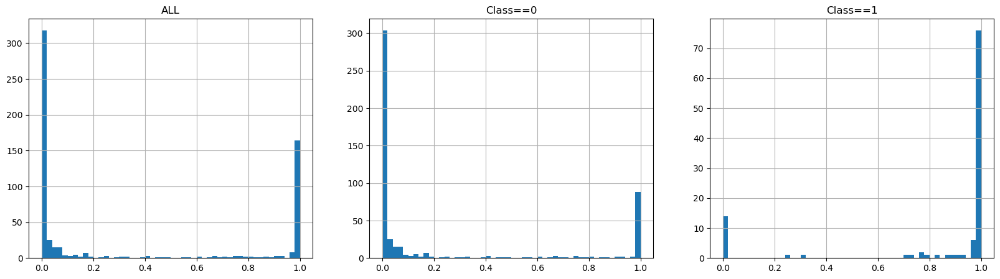

####################################################################################################
CV repeat nbr: 5 - metric: 0.3171


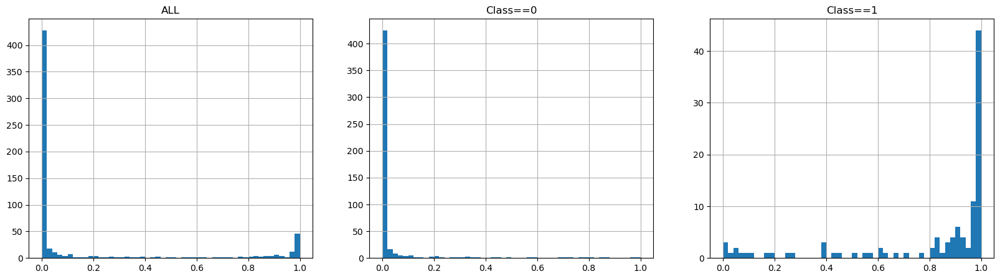

CV repeat nbr: 5 - metric: 0.2513


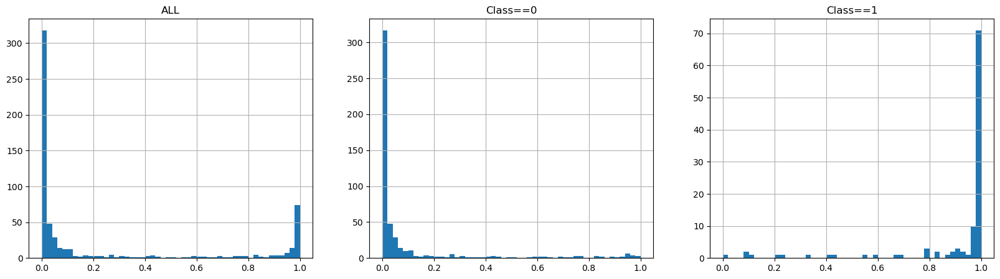

####################################################################################################
CV repeat nbr: 6 - metric: 7.7657


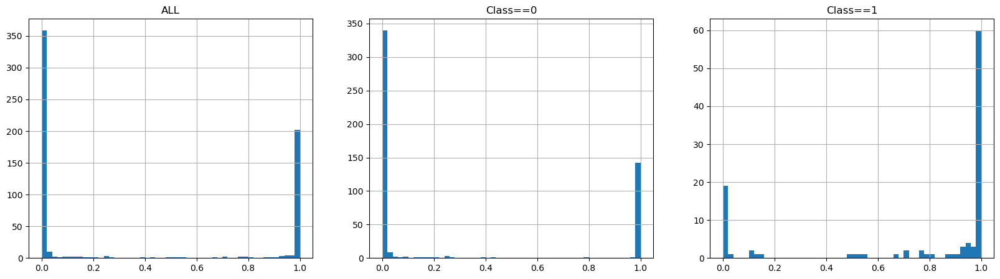

CV repeat nbr: 6 - metric: 7.7244


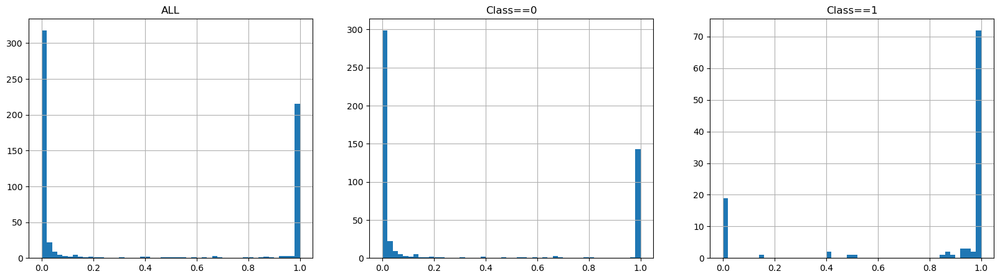

####################################################################################################
CV repeat nbr: 7 - metric: 6.0134


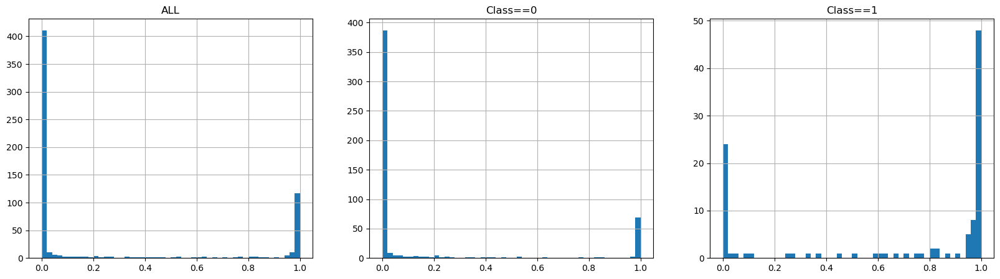

CV repeat nbr: 7 - metric: 5.9706


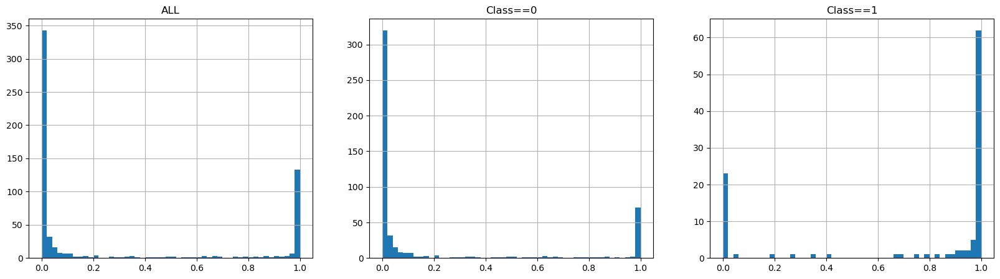

####################################################################################################
CV repeat nbr: 8 - metric: 0.6479


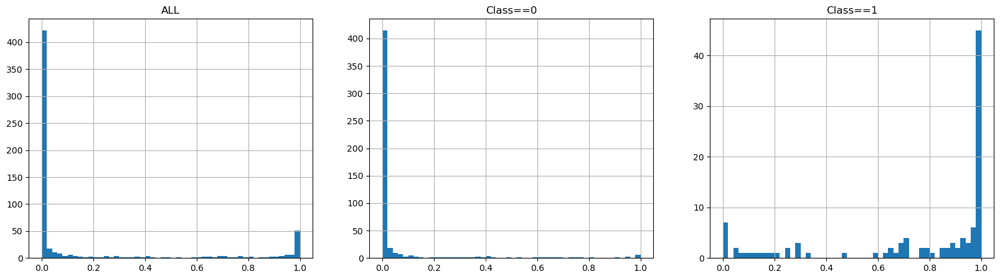

CV repeat nbr: 8 - metric: 0.5563


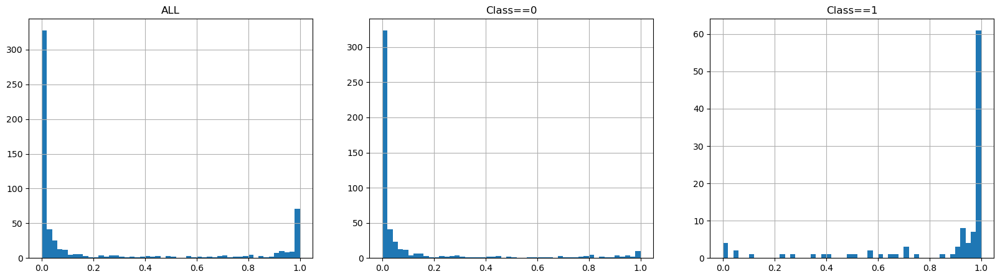

####################################################################################################
CV repeat nbr: 9 - metric: 0.6061


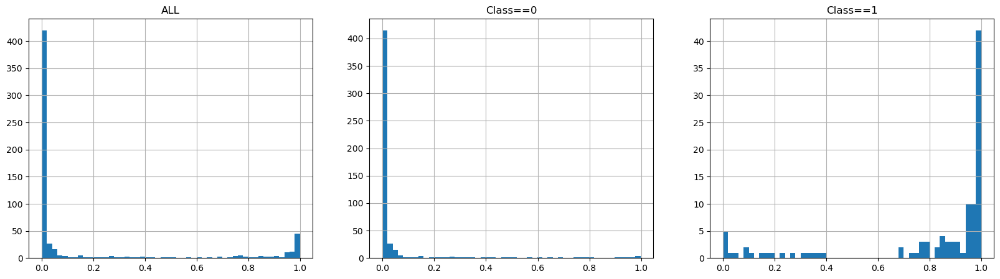

CV repeat nbr: 9 - metric: 0.5499


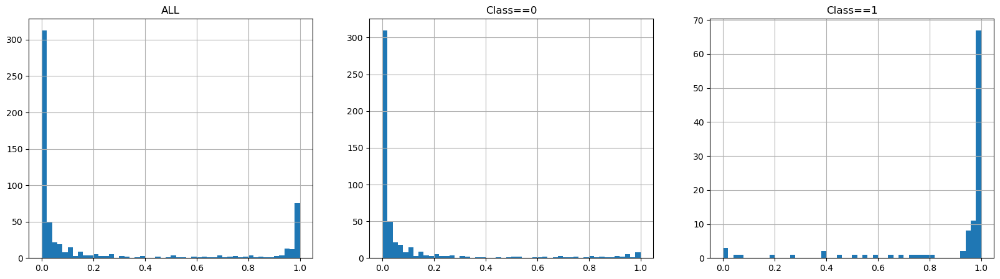

####################################################################################################
CV repeat nbr: 10 - metric: 0.3004


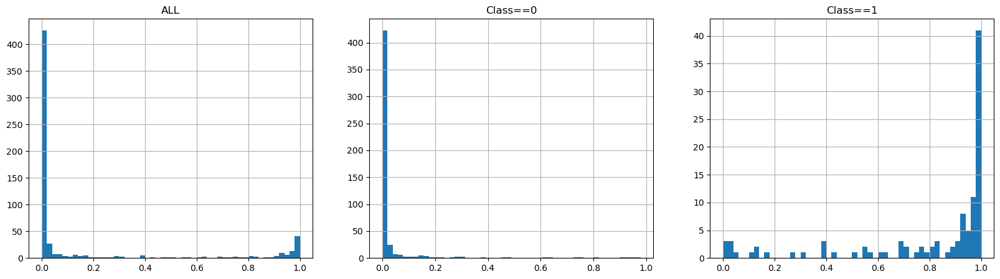

CV repeat nbr: 10 - metric: 0.2247


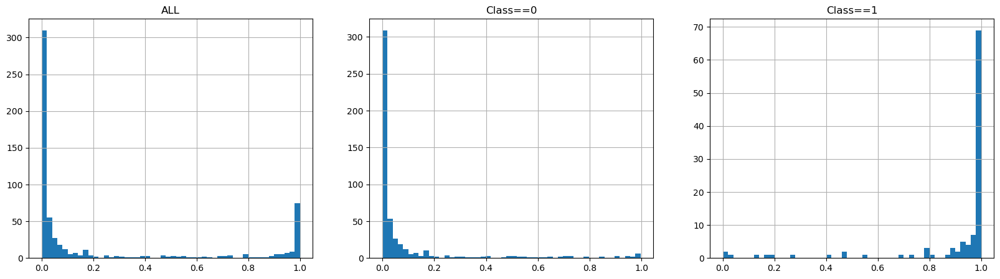

In [15]:
for i,oof in enumerate(oof_dfs):
    print("#"*100)
    oof = oof.copy()
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()
    
    p0 = 1 - oof.pred_proba.values.copy()
    p1 = oof.pred_proba.values.copy()
    p1 *= scale_factor
    scaled_p1 = p1 / (p0+p1)
    oof["pred_proba"] = scaled_p1
    
    metric = balanced_logloss_(oof.pred_proba.values, oof.Class.values)
    print(f"CV repeat nbr: {i+1} - metric: {metric:0.4f}")

    plt.figure(figsize=(20,5))

    plt.subplot(1,3,1)
    plt.title("ALL")
    oof.pred_proba.hist(bins=50)

    plt.subplot(1,3,2)
    plt.title("Class==0")
    oof.query("Class==0").pred_proba.hist(bins=50)

    plt.subplot(1,3,3)
    plt.title("Class==1")
    oof.query("Class==1").pred_proba.hist(bins=50)

    plt.show()

***